In [2]:
library(Seurat)
library(dplyr)
library(ggplot2)
library(tidyr)
library(viridis)
library(stringr)
library(pheatmap)
library(presto)
library(pals)
library(harmony)
library(singlecellmethods)
library(lisi)
library(symphony)
source("/data/srlab/ik936/Foxxy/utils/utils.R")
source("/data/srlab/anathan/scripts/scseq_utils.R")
library(parallel)

Attaching SeuratObject


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: viridisLite

Loading required package: Rcpp

Warning message:
“package ‘Rcpp’ was built under R version 4.1.3”
Loading required package: data.table


Attaching package: ‘data.table’


The following objects are masked from ‘package:dplyr’:

    between, first, last



Attaching package: ‘pals’


The following objects are masked from ‘package:viridis’:

    cividis, inferno, magma, plasma, turbo, viridis


The following objects are masked from ‘package:viridisLite’:

    cividis, inferno, magma, plasma, turbo, viridis



Attaching package: ‘singlecellmethods’


The following object is masked from ‘package:SeuratObject’:

    rowMeans


The following object is masked from ‘package:base’:

    rowMeans



Attaching package: ‘symphony’


The fo

In [2]:
temp_meta <- readRDS('/data/srlab2/jmears/jupyter/SLE_Phase2_Kidney_Analysis/nuc-seq-output/full_metadata/meta_all_filtered_500nGene_0.01pctmtUMI7500uppernGene_1000nUMI_40000uppernUMI_doublet_removal.rds')
meta <- readRDS("/data/srlab/ssg34/SLE_kidney/data/all_immune/all_immune_cells.integrated.consolidated_clusters.rds")@meta.data
doublet_meta <- rbind(temp_meta %>% select(cells, doublet_score_scrublet, isscrubletdoublet) %>% 
                      rename(doublet_score = doublet_score_scrublet, doublet_classification = isscrubletdoublet, cell = cells), 
                      meta %>% select(cells, doublet_score, doublet_classification) %>% rename(cell = cells))

In [3]:
meta %>% pull(percent.mito) %>% range()
    temp_meta %>% pull(percent.mito) %>% range()

[1] 0.0000000 0.4710494

[1] 0.000000000 0.009996971

In [4]:
broad <- readRDS("/data/srlab/ssg34/SLE_kidney/data/all_immune/all_immune_cells.integrated.rds")

In [143]:
mito_meta <- rbind(temp_meta %>% select(cells, percent.mito) %>% 
                      rename(cell = cells), 
                      meta %>% select(cells, percent.mito.sub) %>% rename(cell = cells, percent.mito = percent.mito.sub)) 

In [353]:
plot_clusters3 <- function(cluster_ids, labels, pt_size = 20, umap_use = umap_post,
                           do_labels = FALSE,
                           do_points = TRUE, do_density = FALSE, alpha_pt = 1, min_cluster_size = 20) {
    cluster_table <- table(cluster_ids)
    clusters_keep <- names(which(cluster_table > min_cluster_size))
    plt_df <- umap_use %>% data.frame() %>% cbind(cluster = factor(cluster_ids)) %>% cbind(cluster_label = labels)
    factor_levels <- plt_df %>% select(cluster_label, cluster) %>% unique() %>% arrange(as.numeric(cluster)) %>% pull(cluster_label)
    plt <- plt_df %>%
        dplyr::sample_frac(1L) %>%
        ggplot(aes(hUMAP1, hUMAP2, col = factor(cluster_label, levels = factor_levels), fill = factor(cluster_label, factor_levels)))
    if (do_points)
        plt <- plt + geom_point(alpha = alpha_pt, size = 0.5) + theme_classic()
    if (do_density)
        plt <- plt + geom_density_2d()


    plt <- plt +
     #   theme_tufte() +
#         theme(axis.line = element_line()) +
        guides(color = guide_legend(override.aes = list(size = 3))) +
#         scale_color_manual(values = sample(unique(singler.colors))) +
#         scale_color_manual(values = palette_use) +
        labs(x = "UMAP 1", y = "UMAP 2") +
        theme(plot.title = element_text(hjust = .5))

    if (do_labels)
        plt <- plt + ggrepel::geom_label_repel(data = data.table(plt_df)[, .(hUMAP1 = mean(hUMAP1), hUMAP2 = mean(hUMAP2)), by = .(cluster_label, cluster)], label.size = NA,
                                aes(label = cluster), color = "white", size = 5,  max.overlaps = 15) +
        guides(col = FALSE, fill = FALSE) +
#         scale_fill_manual(values = palette_use) +
        NULL
    return(plt)
}

plot_shuffled_features <- function(ab, umap, exprs, pct) {
    library(viridis)
    max.cutoff = quantile(exprs[ab,], pct)
    min.cutoff = quantile(exprs[ab,], 1-pct)
    
    tmp <- sapply(X = exprs[ab,], FUN = function(x) {
        return(ifelse(test = x > max.cutoff, yes = max.cutoff,
            no = x))
    })
    tmp <- sapply(X = tmp, FUN = function(x) {
        return(ifelse(test = x < min.cutoff, yes = min.cutoff,
            no = x))
    })
    umap_res_plot <- cbind(umap, tmp)
    return(ggplot(data = as.data.frame(umap_res_plot)[sample(nrow(umap_res_plot)),] , aes(x = V1, y = V2)) +
      geom_point(mapping = aes(color = tmp), size = 0.75) +
      scale_color_viridis(option = "inferno", end = pct) +
      theme_classic() +
      theme(plot.title = element_text(size = 15), legend.position = "none") +
      labs(title = ab, x = 'hUMAP1', y = 'hUMAP2', color = "Normalized Expression"))
}
                           fig.size <- function (height, width) {
    options(repr.plot.height = height, repr.plot.width = width, repr.plot.res = 300)
}

## Read In Files

In [3]:
all_meta <- readRDS('/data/srlab2/qxiao/AMP-SLE/sc_nuc_data/meta_ScNuc_500nGene_1000nUMI_3pctnontargetMTwdoubletandsampleFINAL-8-10-22.rds')

In [4]:
norm <- readRDS('/data/srlab2/qxiao/AMP-SLE/sc_nuc_data/normalized_data_ScNuc_500nGene_1000nUMI_3pctnontargetMTwdoubletandsampleFINAL-8-10-22.rds')

In [5]:
T_NK_meta <- all_meta %>% filter(broad.type == 'T/NK')

In [6]:
T_NK_norm <- norm[, T_NK_meta$cell]

In [7]:
genes_exclude <- c(grep("^MT-|^RPL|^RPS|MALAT1|MIR-", row.names(norm), value = TRUE), Seurat::cc.genes$s.genes, Seurat::cc.genes$g2m.genes) 

## QC Clustering

In [56]:
nuc_norm <- T_NK_norm[, T_NK_meta %>% filter(dataset == 'snRNAseq') %>% pull(cell)]

sc_norm <- T_NK_norm[, T_NK_meta %>% filter(dataset == 'scRNAseq') %>% pull(cell)]

nuc_meta <- T_NK_meta %>% filter(dataset == 'snRNAseq')

sc_meta <- T_NK_meta %>% filter(dataset == 'scRNAseq')

In [55]:
## Filtering for expressed genes
threshold_genes <- nuc_norm[rownames(nuc_norm[rowMeans(nuc_norm) >= .01, ]), ]

samples_25 <- nuc_meta %>% group_by(sample) %>% tally() %>% filter(n > 25) %>% pull(sample)

threshold_samples <- threshold_genes[, nuc_meta %>% filter(sample %in% samples_25) %>% pull(cell)]
 
## Variable gene selection — very inefficiently written, but essentially using VST to select most variable genes from samples with > 10 cells
var_genes_raw <- singlecellmethods::vargenes_vst(object = threshold_samples, groups = nuc_meta %>% filter(sample %in% samples_25) %>% pull(sample), topn = 500)

In [10]:
## Scale Data
t_nk_scaled_nuc <- nuc_norm[var_genes_raw[! var_genes_raw %in% genes_exclude], ] %>% scaleData
## PCA
t_nk_pca_res_nuc <- irlba::prcomp_irlba(t(t_nk_scaled_nuc), 20)
## UMAP
t_nk_umap_res_nuc <- uwot::umap(t_nk_pca_res_nuc$x[, 1:20], n_neighbors = 30L, metric = "euclidean", min_dist = .1)

In [11]:
## Filtering for expressed genes
threshold_genes <- sc_norm[rownames(sc_norm[rowMeans(sc_norm) >= .01, ]), ]

samples_25 <- sc_meta %>% group_by(sample) %>% tally() %>% filter(n > 25) %>% pull(sample)

threshold_samples <- threshold_genes[, sc_meta %>% filter(sample %in% samples_25) %>% pull(cell)]

## Variable gene selection — very inefficiently written, but essentially using VST to select most variable genes from samples with > 100 cells
var_genes_raw <- singlecellmethods::vargenes_vst(object = threshold_samples, groups = sc_meta %>% filter(sample %in% samples_25) %>% pull(sample), topn = 500)

In [12]:
## Scale Data
t_nk_scaled_sc <- sc_norm[var_genes_raw[!var_genes_raw %in% genes_exclude], ] %>% scaleData
## PCA
t_nk_pca_res_sc <- irlba::prcomp_irlba(t(t_nk_scaled_sc), 20)
## UMAP
t_nk_umap_res_sc <- uwot::umap(t_nk_pca_res_sc$x[, 1:20], n_neighbors = 30L, metric = "euclidean", min_dist = .1)

In [13]:
t_nk_sc_lisi <- compute_lisi(t_nk_pca_res_sc$x[, 1:20], sc_meta, c('Site', 'processing.batch', 'sample'))
t_nk_nuc_lisi <- compute_lisi(t_nk_pca_res_nuc$x[, 1:20], nuc_meta, c('Site', 'processing.batch', 'sample'))

use_weights



[1] FALSE


use_weights

use_weights



[1] FALSE


use_weights

Harmony 1/20

Harmony 2/20

Harmony 3/20

Harmony 4/20

Harmony 5/20

Harmony 6/20

Harmony 7/20

Harmony 8/20

Harmony 9/20

Harmony 10/20

Harmony 11/20

Harmony 12/20

Harmony 13/20

Harmony 14/20

Harmony 15/20

Harmony 16/20

Harmony 17/20

Harmony 18/20

Harmony 19/20

Harmony 20/20



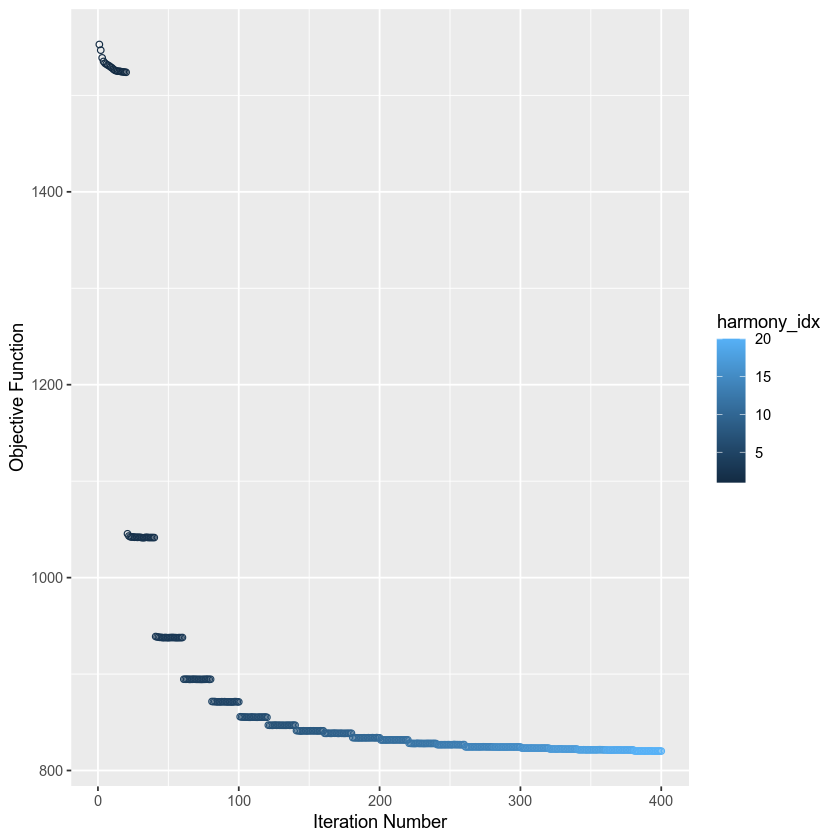

In [14]:
t_nk_harmony_nuc <- HarmonyMatrix(t_nk_pca_res_nuc$x[, 1:20], nuc_meta, 
                                     vars_use = c("sample", "processing.batch", "Site"), theta = c(2, 1, 1),
                        # lambda = 1, 
                        # tau = 0, 
                        epsilon.cluster = -Inf,
                        epsilon.harmony = -Inf,
                        max.iter.cluster = 20,
                        max.iter.harmony = 20,
                        plot_convergence = TRUE,
                        npcs = 20, do_pca = FALSE)

use_weights



[1] FALSE


use_weights

use_weights



[1] FALSE


use_weights

Harmony 1/20

Harmony 2/20

Harmony 3/20

Harmony 4/20

Harmony 5/20

Harmony 6/20

Harmony 7/20

Harmony 8/20

Harmony 9/20

Harmony 10/20

Harmony 11/20

Harmony 12/20

Harmony 13/20

Harmony 14/20

Harmony 15/20

Harmony 16/20

Harmony 17/20

Harmony 18/20

Harmony 19/20

Harmony 20/20



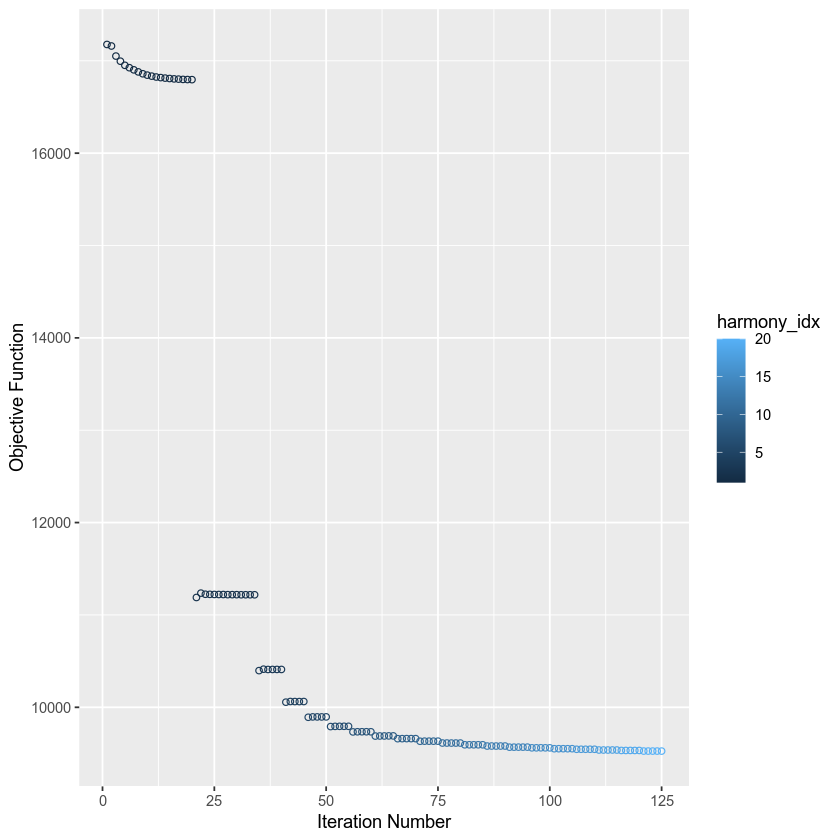

In [15]:
t_nk_harmony_sc <- HarmonyMatrix(t_nk_pca_res_sc$x[, 1:20], sc_meta, 
                                     vars_use = c("sample", "processing.batch", "Site"), theta = c(2, 1, 1),
                        # lambda = 1, 
                        # tau = 0, 
                        epsilon.harmony = -Inf,
                        max.iter.cluster = 20,
                        max.iter.harmony = 20,
                        plot_convergence = TRUE,
                        npcs = 20, do_pca = FALSE)

In [16]:
t_nk_humap_res_nuc <- uwot::umap(t_nk_harmony_nuc[, 1:20], n_neighbors = 30L, metric = "euclidean", min_dist = .1)

In [17]:
t_nk_humap_res_sc <- uwot::umap(t_nk_harmony_sc[, 1:20], n_neighbors = 30L, metric = "euclidean", min_dist = .1)

In [18]:
t_nk_sc_lisi_harmony <- compute_lisi(t_nk_harmony_sc[, 1:20], sc_meta, c('Site', 'processing.batch', 'sample'))
t_nk_nuc_lisi_harmony <- compute_lisi(t_nk_harmony_nuc[, 1:20], nuc_meta, c('Site', 'processing.batch', 'sample'))

In [20]:
sc_lisi <- rbind(t_nk_sc_lisi %>% mutate(status = 'preharmony'), t_nk_sc_lisi_harmony %>% mutate(status = 'postharmony'))
nuc_lisi <- rbind(t_nk_nuc_lisi %>% mutate(status = 'preharmony'), t_nk_nuc_lisi_harmony %>% mutate(status = 'postharmony'))

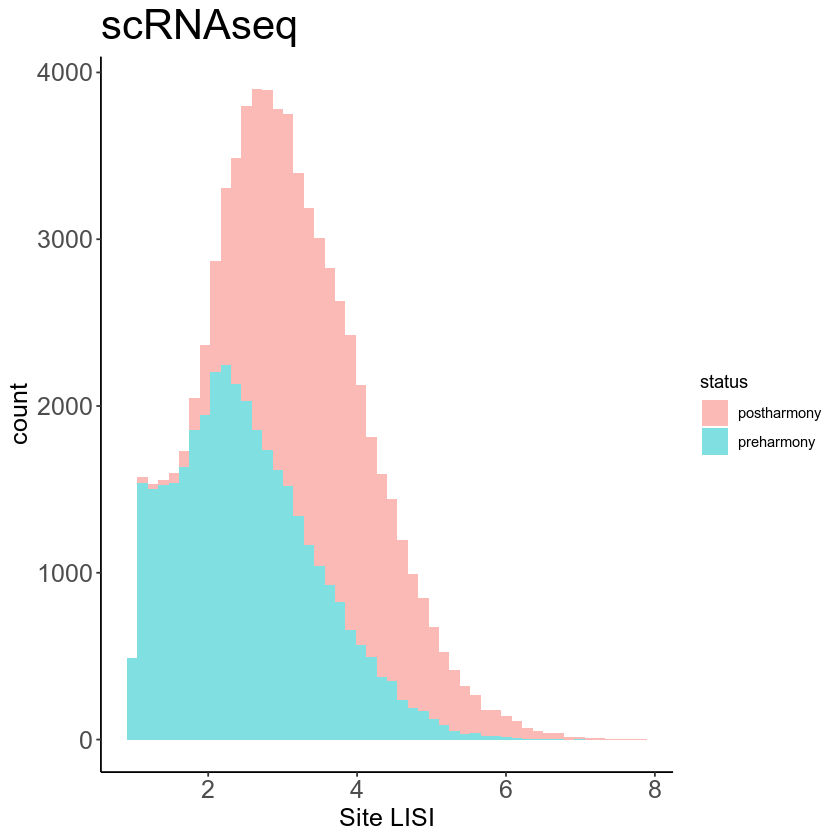

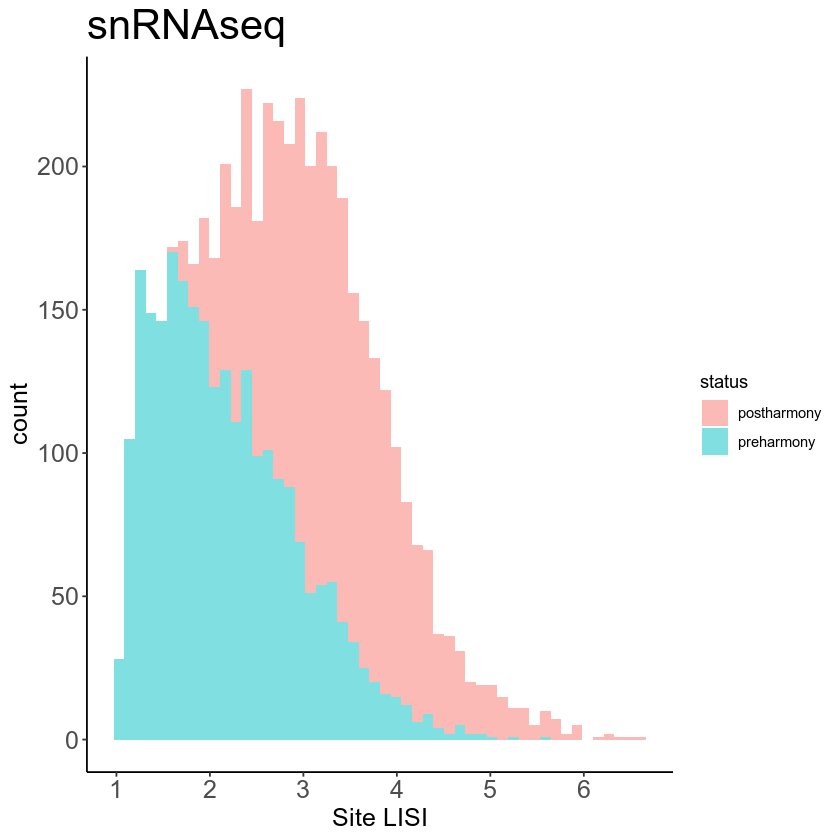

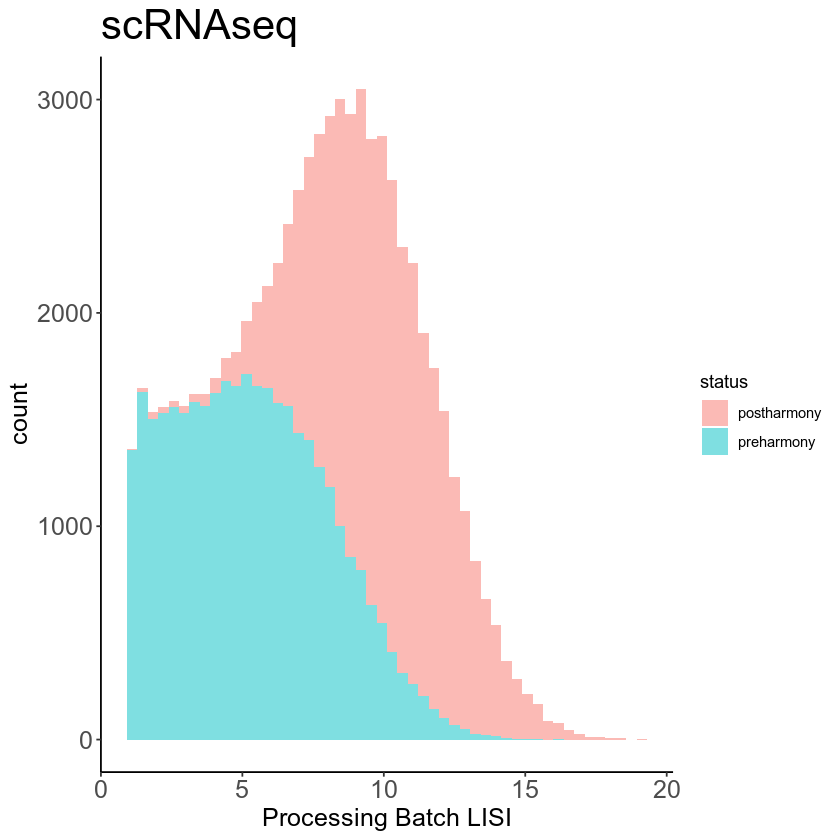

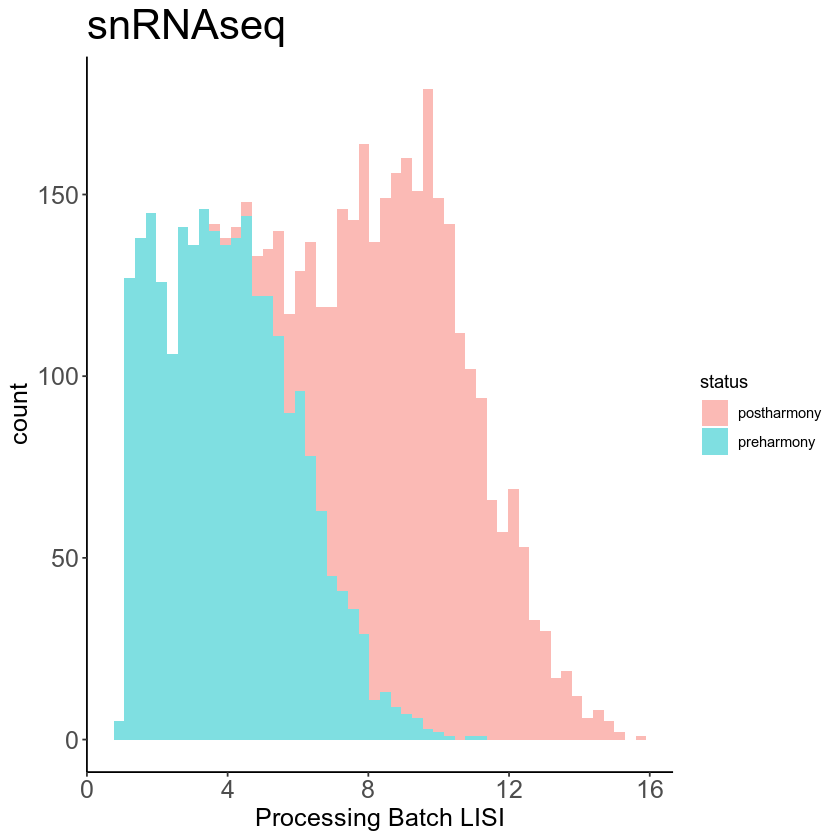

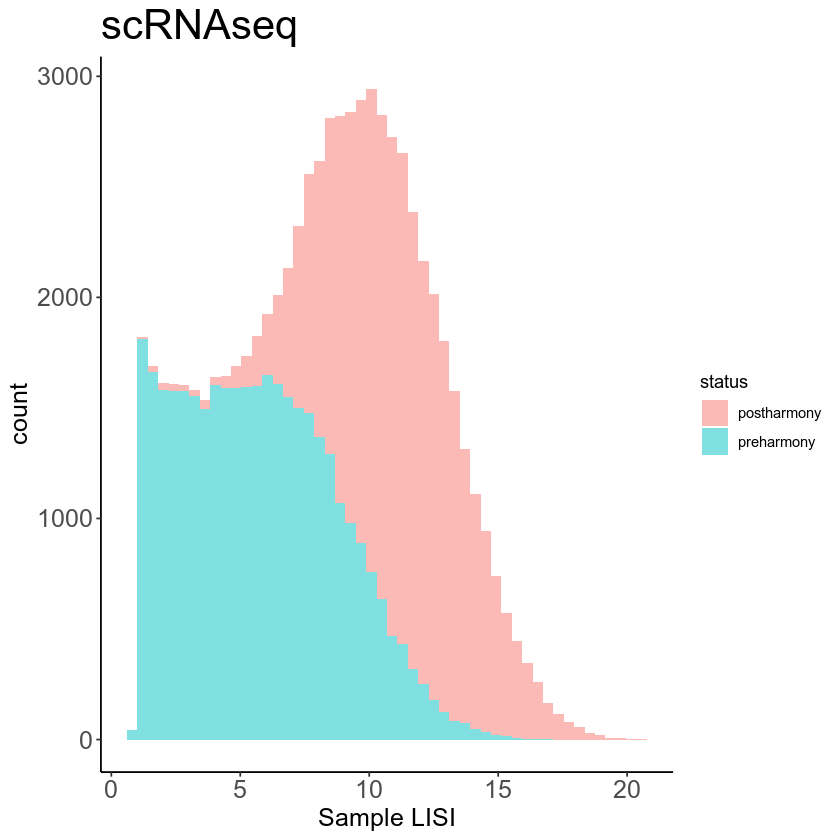

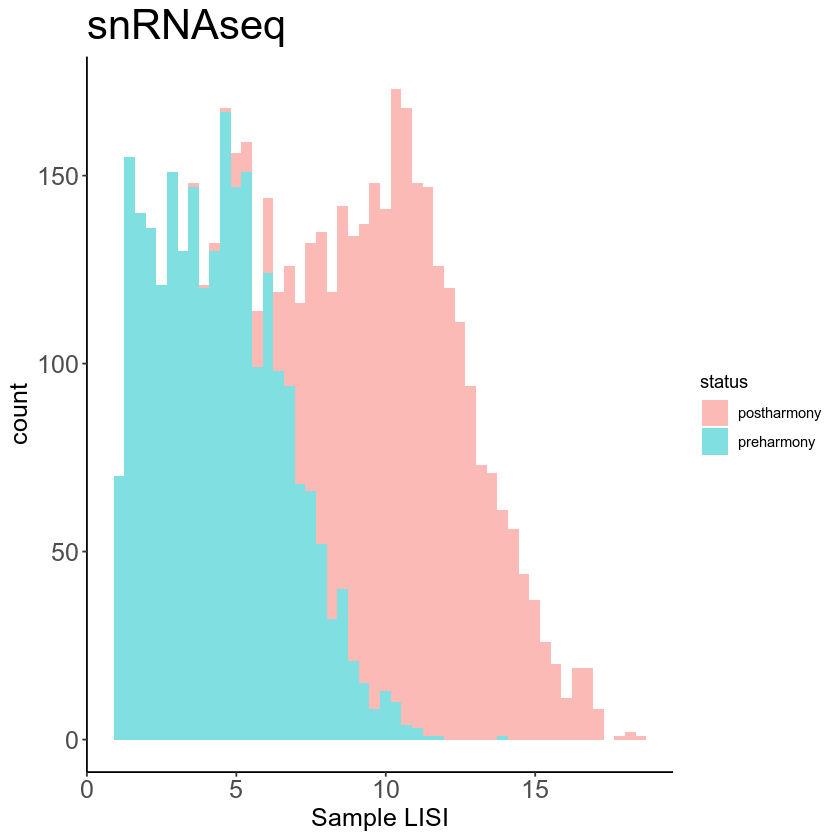

In [21]:
ggplot(sc_lisi, aes(x = Site, y = ..count.., fill = status)) + 
    geom_histogram(alpha = 0.5, bins = 50) + 
    theme_classic() +
    labs(x = 'Site LISI', title = 'scRNAseq')  +
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) 


ggplot(nuc_lisi, aes(x = Site, y = ..count.., fill = status)) + 
    geom_histogram(alpha = 0.5, bins = 50) + 
    theme_classic() +
    labs(x = 'Site LISI', title = 'snRNAseq') +
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) 



ggplot(sc_lisi, aes(x = processing.batch, y = ..count.., fill = status)) + 
    geom_histogram(alpha = 0.5, bins = 50) + 
    theme_classic() +
    labs(x = 'Processing Batch LISI', title = 'scRNAseq') + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) 


ggplot(nuc_lisi, aes(x = processing.batch, y = ..count.., fill = status)) + 
    geom_histogram(alpha = 0.5, bins = 50) + 
    theme_classic() +
    labs(x = 'Processing Batch LISI', title = 'snRNAseq') +
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) 



ggplot(sc_lisi, aes(x = sample, y = ..count.., fill = status)) + 
    geom_histogram(alpha = 0.5, bins = 50) + 
    theme_classic() +
    labs(x = 'Sample LISI', title = 'scRNAseq') +
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) 


ggplot(nuc_lisi, aes(x = sample, y = ..count.., fill = status)) + 
    geom_histogram(alpha = 0.5, bins = 50) + 
    theme_classic() +
    labs(x = 'Sample LISI', title = 'snRNAseq') +
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) 


In [30]:
snn_ref <- BuildSNNSeurat(t_nk_harmony_sc[,1:20], nn.eps = 0)

resolution_list <- c(2.0)
ids_ref_sc <- Reduce(cbind, mclapply(resolution_list, function(res_use) {
    Seurat:::RunModularityClustering(SNN = snn_ref, modularity = 1,
        resolution = res_use, algorithm = 1, n.start = 20,
        n.iter = 20, random.seed = 100, print.output = FALSE,
        temp.file.location = NULL, edge.file.name = NULL)
}, mc.preschedule = FALSE, mc.cores = min(20, length(resolution_list)))) 

In [31]:
snn_ref <- BuildSNNSeurat(t_nk_harmony_nuc[,1:20], nn.eps = 0)

resolution_list <- c(2.0)
ids_ref_nuc <- Reduce(cbind, mclapply(resolution_list, function(res_use) {
    Seurat:::RunModularityClustering(SNN = snn_ref, modularity = 1,
        resolution = res_use, algorithm = 1, n.start = 20,
        n.iter = 20, random.seed = 100, print.output = FALSE,
        temp.file.location = NULL, edge.file.name = NULL)
}, mc.preschedule = FALSE, mc.cores = min(20, length(resolution_list)))) 

In [57]:
MYL <- c("AIF1", "LYZ", "FCGR3A", "CD14")

B <- c("MS4A1", "IGHG1", "MZB1")

T <- c("CD2", "CD3D")

EC <- c("ENG", "EGFL7", "EMCN")

IC <- c("ATP6V0D2", "ATP6V1G3", "SLC26A7")

PC_DCT_CNT <- c("CALB1", "FXYD4", "AQP2")

ATL_TAL <- c("SLC12A1", "SFRP1", "EGF")

FIB <- c("COL1A2", "COL1A1", "CCDC80")

POD <- c("PTGDS", "PODXL", "NPHS2")

PT1 <- c("SLC13A3", "SLC34A1", "LRP2")

MAST <- c("TPSB2", "TPSAB1", "CPA3")

pDC <- c('IL3RA', 'JCHAIN', 'NRP1')

In [58]:
nuc_meta <-nuc_meta %>% mutate(Myeloid = colMeans(nuc_norm[rownames(nuc_norm) %in% MYL, ]),
                                        T = colMeans(nuc_norm[rownames(nuc_norm) %in% T, ]), 
                                        B = colMeans(nuc_norm[rownames(nuc_norm) %in% B, ]),
                                        EC = colMeans(nuc_norm[rownames(nuc_norm) %in% EC, ]),
                                        IC = colMeans(nuc_norm[rownames(nuc_norm) %in% IC, ]),
                                        PC = colMeans(nuc_norm[rownames(nuc_norm) %in% PC_DCT_CNT, ]),
                                        ATL = colMeans(nuc_norm[rownames(nuc_norm) %in% ATL_TAL, ]),
                                        Fib = colMeans(nuc_norm[rownames(nuc_norm) %in% FIB, ]),
                                        Pod = colMeans(nuc_norm[rownames(nuc_norm) %in% POD, ]),
                                        PT = colMeans(nuc_norm[rownames(nuc_norm) %in% PT1, ]),
                                        MAST = colMeans(nuc_norm[rownames(nuc_norm) %in% MAST, ]),
                                        pDC = colMeans(nuc_norm[rownames(nuc_norm) %in% pDC, ]),
                                        qc_cluster = ids_ref_nuc)

In [110]:
sc_meta <- sc_meta %>% mutate(Myeloid = colMeans(sc_norm[rownames(sc_norm) %in% MYL, ]),
                                        T = colMeans(sc_norm[rownames(sc_norm) %in% T, ]), 
                                        B = colMeans(sc_norm[rownames(sc_norm) %in% B, ]),
                                        EC = colMeans(sc_norm[rownames(sc_norm) %in% EC, ]),
                                        IC = colMeans(sc_norm[rownames(sc_norm) %in% IC, ]),
                                        PC = colMeans(sc_norm[rownames(sc_norm) %in% PC_DCT_CNT, ]),
                                        ATL = colMeans(sc_norm[rownames(sc_norm) %in% ATL_TAL, ]),
                                        Fib = colMeans(sc_norm[rownames(sc_norm) %in% FIB, ]),
                                        Pod = colMeans(sc_norm[rownames(sc_norm) %in% POD, ]),
                                        PT = colMeans(sc_norm[rownames(sc_norm) %in% PT1, ]),
                                        MAST = colMeans(sc_norm[rownames(sc_norm) %in% MAST, ]),
                                        pDC = colMeans(sc_norm[rownames(sc_norm) %in% pDC, ]),
                                        qc_cluster = ids_ref_sc)

In [34]:
colnames(nuc_meta)

[1] "cell"                   "sample"                 "Annot.separate"        
 [4] "dataset"                "uwotUMAP1"              "uwotUMAP2"             
 [7] "Site"                   "Type"                   "processing.batch"      
[10] "hPC-1"                  "hPC-2"                  "hPC-3"                 
[13] "hPC-4"                  "hPC-5"                  "hPC-6"                 
[16] "hPC-7"                  "hPC-8"                  "hPC-9"                 
[19] "hPC-10"                 "hPC-11"                 "hPC-12"                
[22] "hPC-13"                 "hPC-14"                 "hPC-15"                
[25] "hPC-16"                 "hPC-17"                 "hPC-18"                
[28] "hPC-19"                 "hPC-20"                 "huwotUMAP1"            
[31] "huwotUMAP2"             "hres.0.1"               "hres.0.4"              
[34] "hres.0.6"               "hres.0.8"               "hres.1.2"              
[37] "hres.1.6"               "hres.2.0"               "hres.0.2"              
[40] "hres.0.3"               "nCount_RNA"             "nFeature_RNA"          
[43] "broad.type"             "Myeloid"                "T"                     
[46] "B"                      "EC"                     "IC"                    
[49] "PC"                     "ATL"                    "Fib"                   
[52] "Pod"                    "PT"                     "MAST"                  
[55] "pDC"                    "qc_cluster"             "doublet_score"         
[58] "doublet_classification"

In [60]:
nuc_meta <- left_join(nuc_meta, doublet_meta)
sc_meta <- left_join(sc_meta, doublet_meta)

Joining, by = "cell"
Joining, by = "cell"


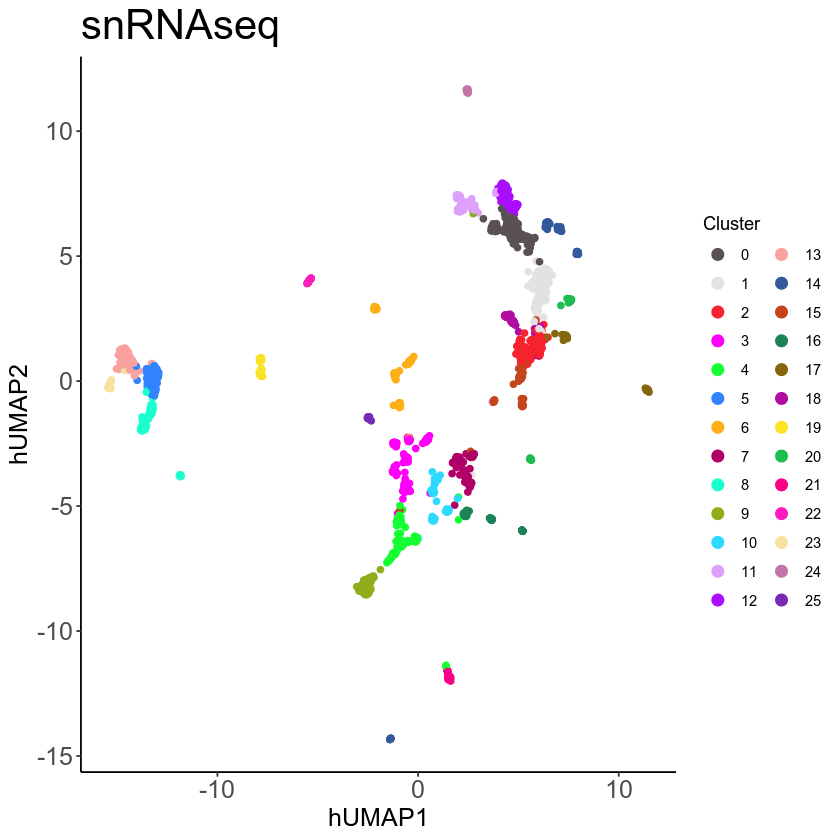

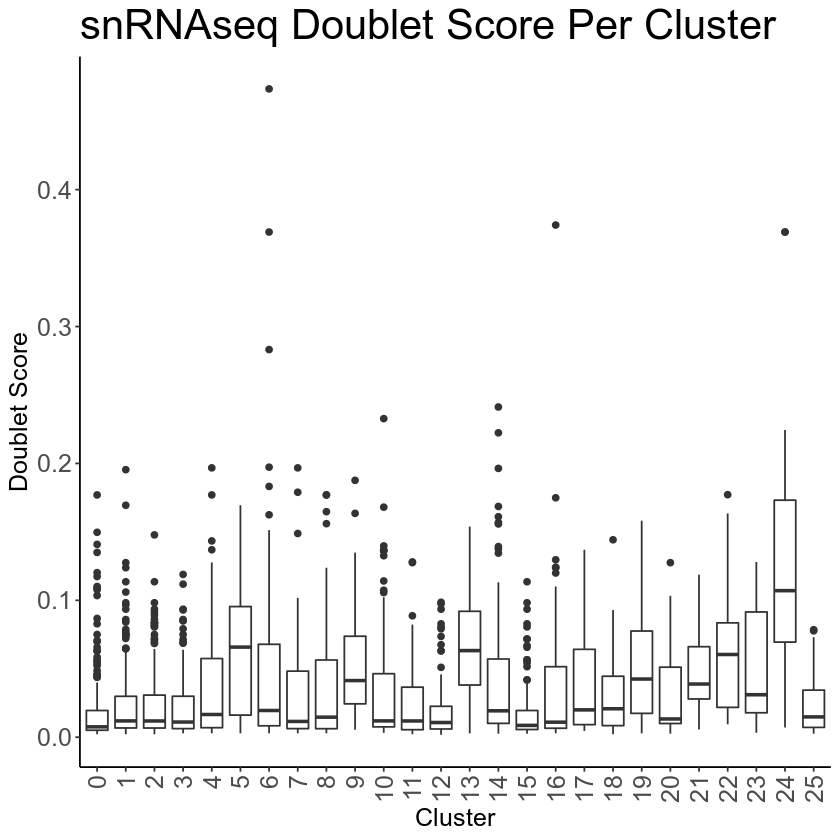

In [61]:
fig.size(7, 7)

ggplot(nuc_meta %>% mutate(hUMAP1 = t_nk_humap_res_nuc[, 1], 
                           hUMAP2 = t_nk_humap_res_nuc[, 2]), 
                           aes(x = hUMAP1, y = hUMAP2, color = as.factor(qc_cluster))) + 
    geom_point() + 
    theme_classic() +
    scale_color_manual(values = as.vector(polychrome(29)), drop = FALSE) +
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(title = 'snRNAseq') +
    guides(colour = guide_legend(override.aes = list(size=3), title="Cluster"))



fig.size(7, 7)
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = doublet_score)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 25))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Doublet Score', title = 'snRNAseq Doublet Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”


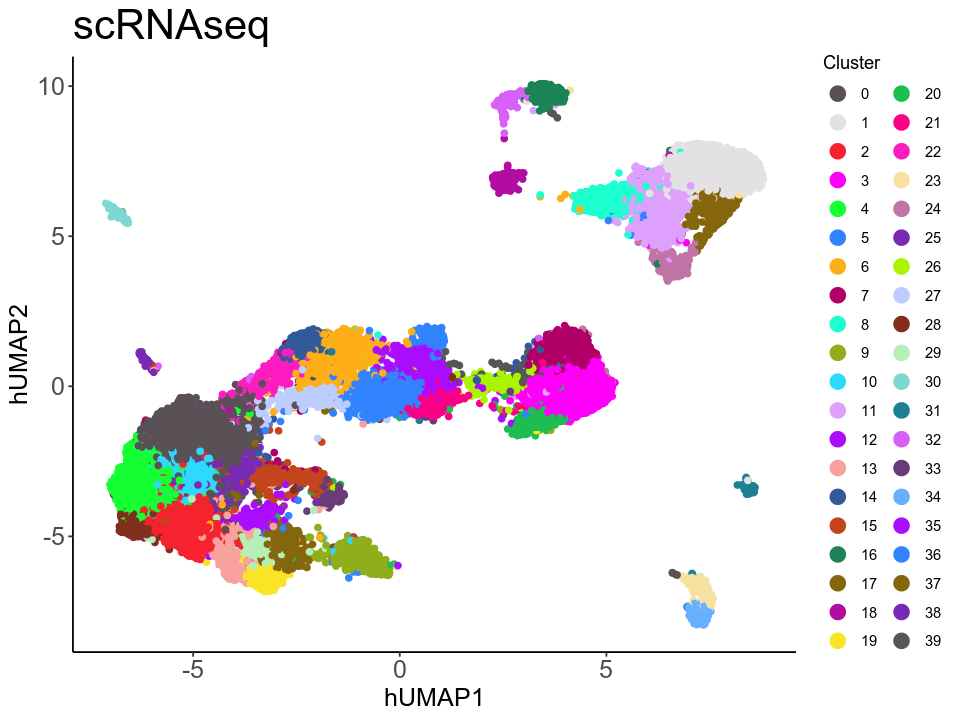

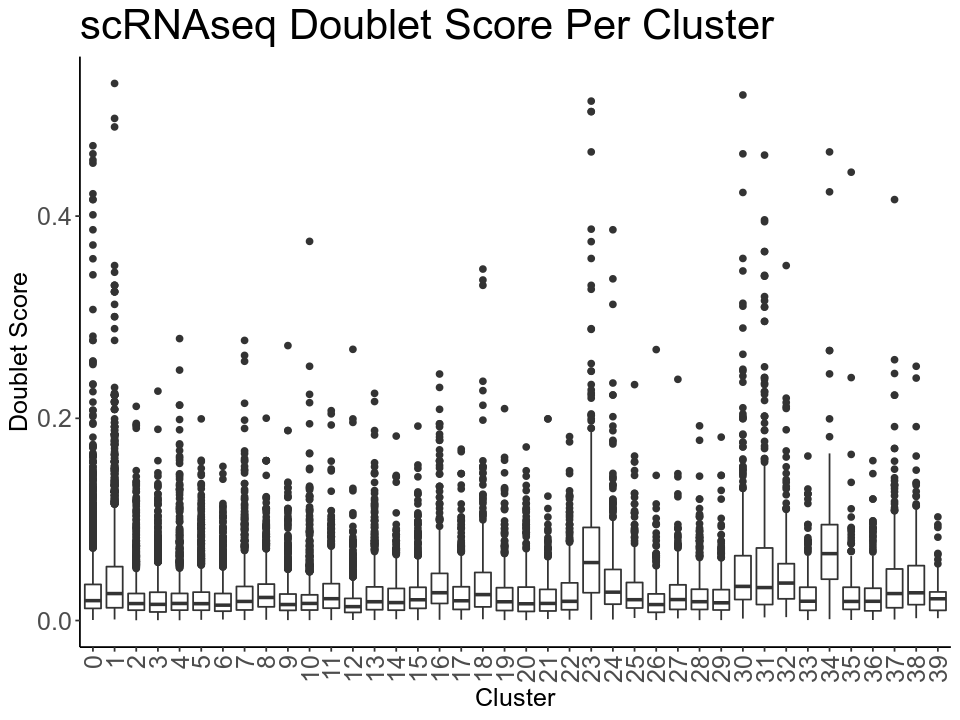

In [87]:
ggplot(sc_meta %>% mutate(hUMAP1 = t_nk_humap_res_sc[, 1], 
                           hUMAP2 = t_nk_humap_res_sc[, 2]), 
                           aes(x = hUMAP1, y = hUMAP2, color = as.factor(qc_cluster))) + 
    geom_point() + 
    theme_classic() +
    scale_color_manual(values = c(as.vector(polychrome(35)), as.vector(alphabet2(5))), drop = FALSE) +
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(title = 'scRNAseq') +
    guides(colour = guide_legend(override.aes = list(size=4), title="Cluster"))
fig.size(6, 8)
ggplot(sc_meta, aes(x = as.character(qc_cluster), y = doublet_score)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 39))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Doublet Score', title = 'scRNAseq Doublet Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

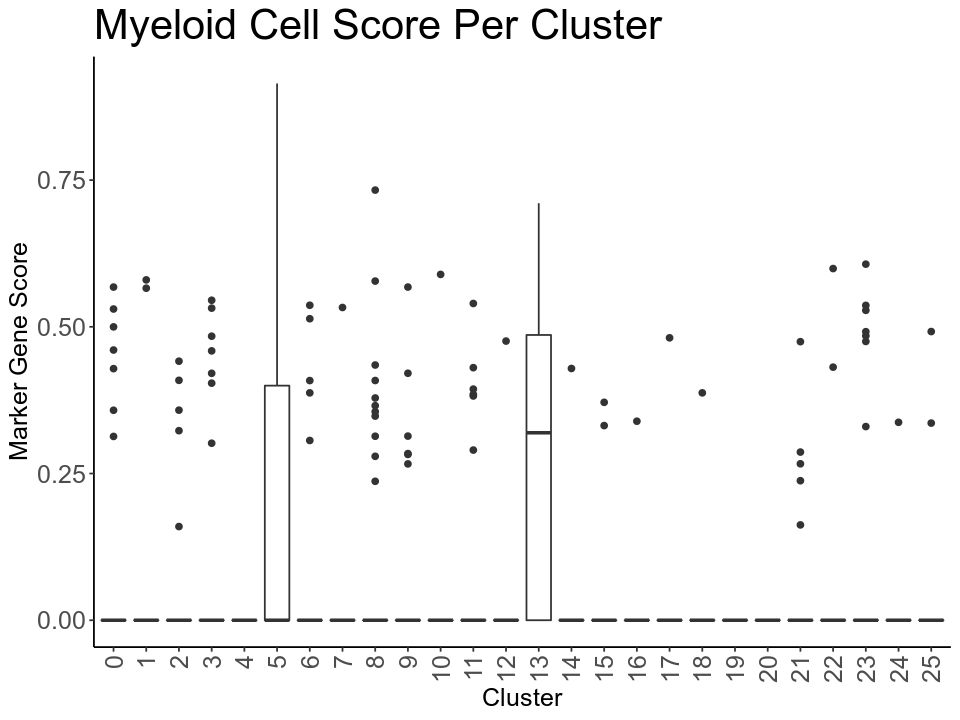

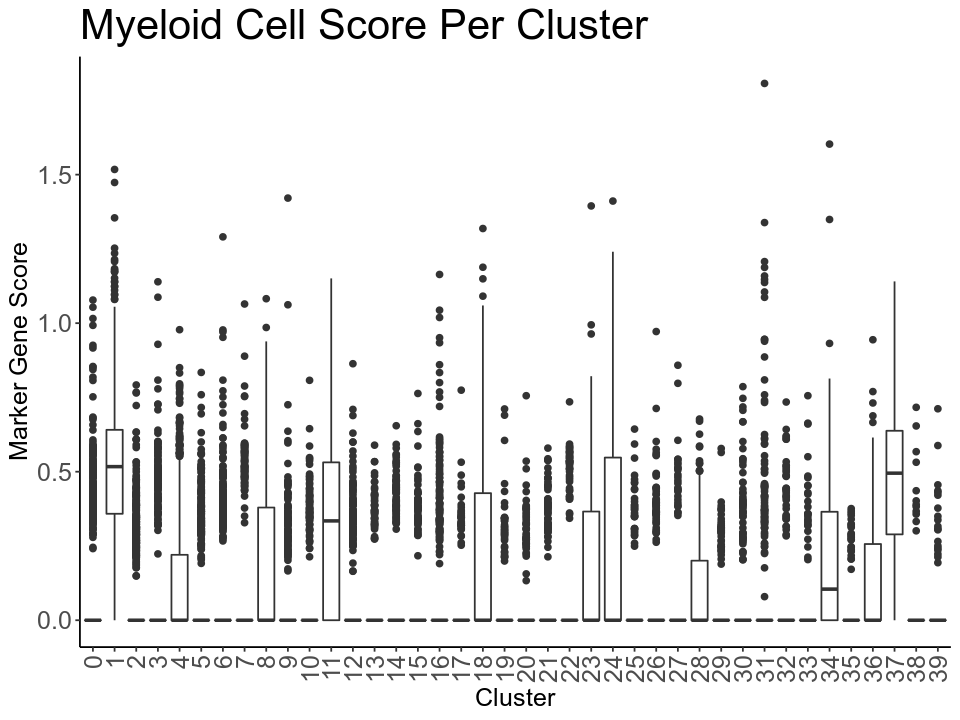

In [63]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = Myeloid)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 25))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'Myeloid Cell Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

ggplot(sc_meta, aes(x = as.character(qc_cluster), y = Myeloid)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 39))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'Myeloid Cell Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

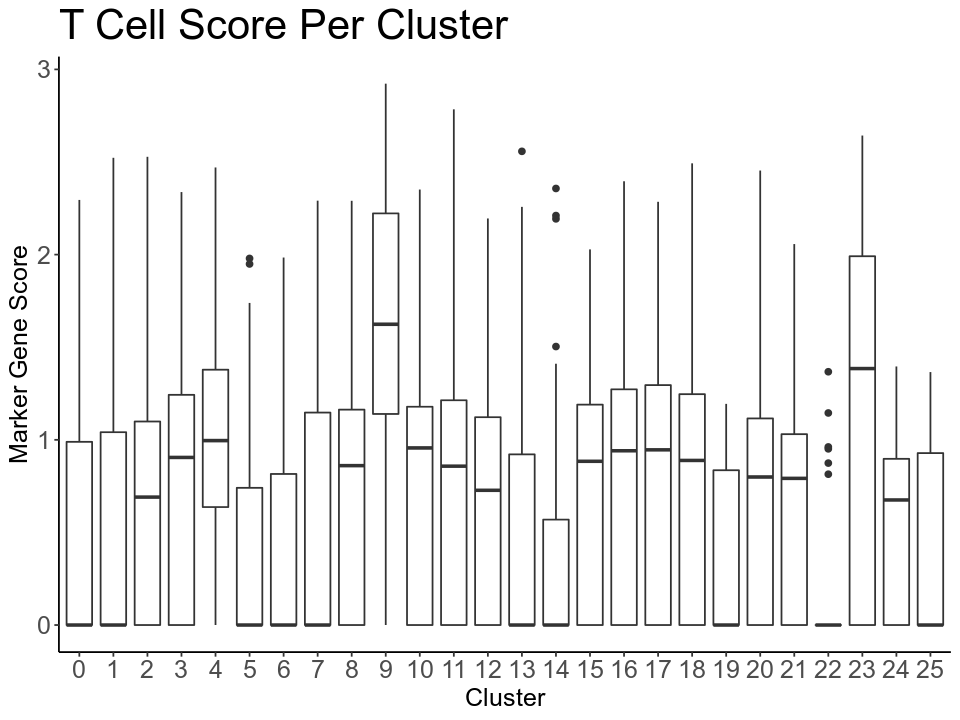

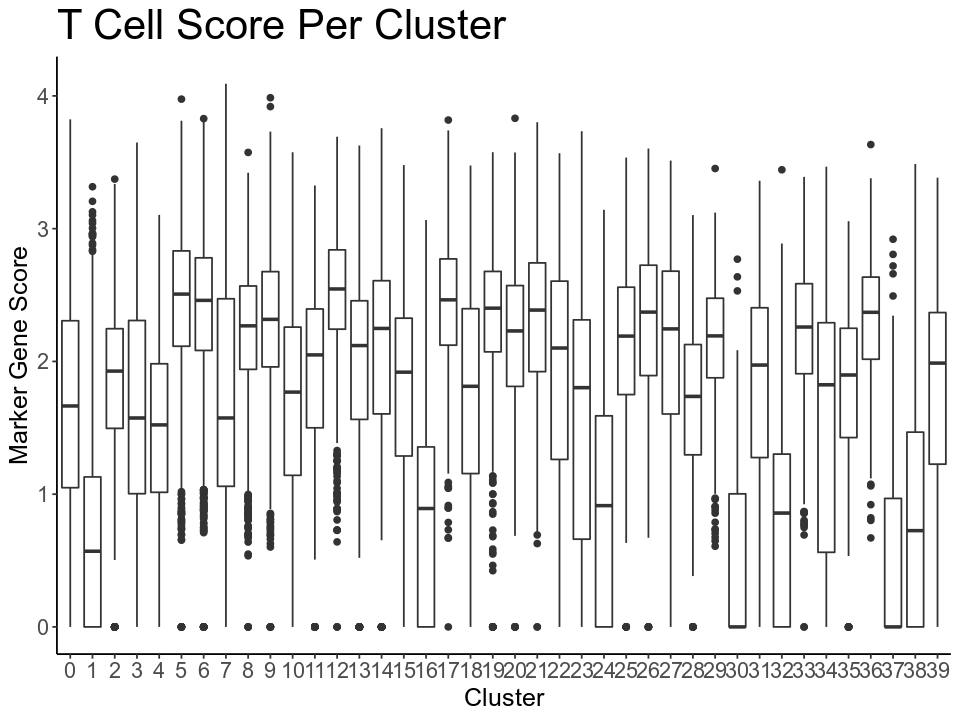

In [64]:
ggplot(nuc_meta, aes(x = as.factor(qc_cluster), y = T)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 25))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'T Cell Score Per Cluster')

ggplot(sc_meta, aes(x = as.factor(qc_cluster), y = T)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 39))) + 
    theme(axis.text = element_text(size = 13), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'T Cell Score Per Cluster')

In [53]:
colnames(nuc_meta)

[1] "cell"                   "sample"                 "Annot.separate"        
 [4] "dataset"                "uwotUMAP1"              "uwotUMAP2"             
 [7] "Site"                   "Type"                   "processing.batch"      
[10] "hPC-1"                  "hPC-2"                  "hPC-3"                 
[13] "hPC-4"                  "hPC-5"                  "hPC-6"                 
[16] "hPC-7"                  "hPC-8"                  "hPC-9"                 
[19] "hPC-10"                 "hPC-11"                 "hPC-12"                
[22] "hPC-13"                 "hPC-14"                 "hPC-15"                
[25] "hPC-16"                 "hPC-17"                 "hPC-18"                
[28] "hPC-19"                 "hPC-20"                 "huwotUMAP1"            
[31] "huwotUMAP2"             "hres.0.1"               "hres.0.4"              
[34] "hres.0.6"               "hres.0.8"               "hres.1.2"              
[37] "hres.1.6"               "hres.2.0"               "hres.0.2"              
[40] "hres.0.3"               "nCount_RNA"             "nFeature_RNA"          
[43] "broad.type"             "Myeloid"                "T"                     
[46] "B"                      "EC"                     "IC"                    
[49] "PC"                     "ATL"                    "Fib"                   
[52] "Pod"                    "PT"                     "MAST"                  
[55] "pDC"                    "qc_cluster"             "doublet_score"         
[58] "doublet_classification"

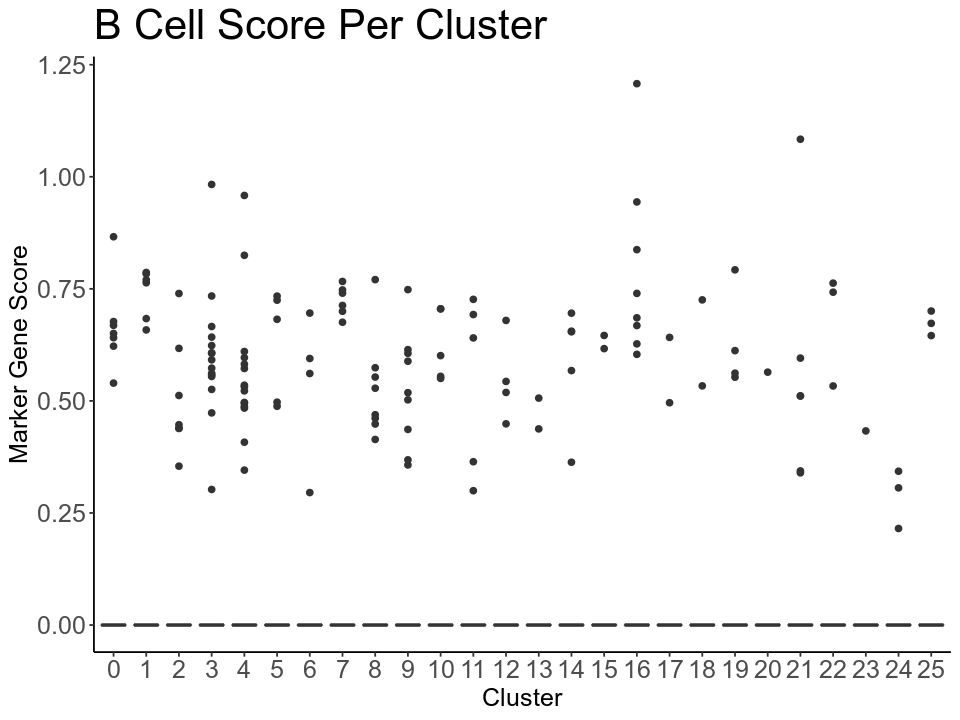

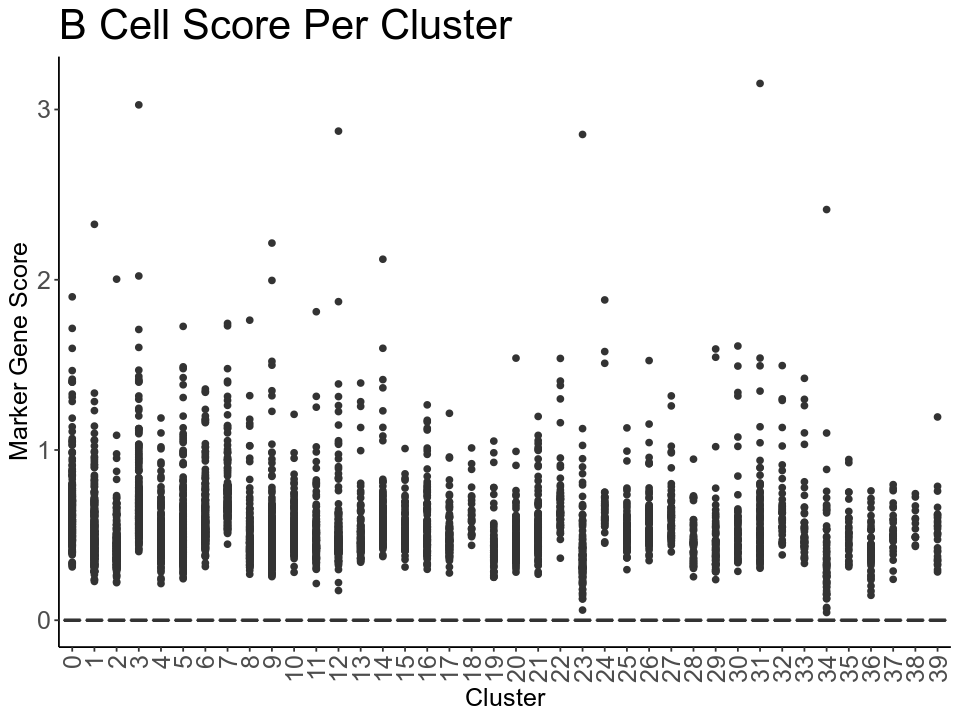

In [65]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = B)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 25))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'B Cell Score Per Cluster')

fig.size(6, 8)
ggplot(sc_meta, aes(x = as.character(qc_cluster), y = B)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 39))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'B Cell Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

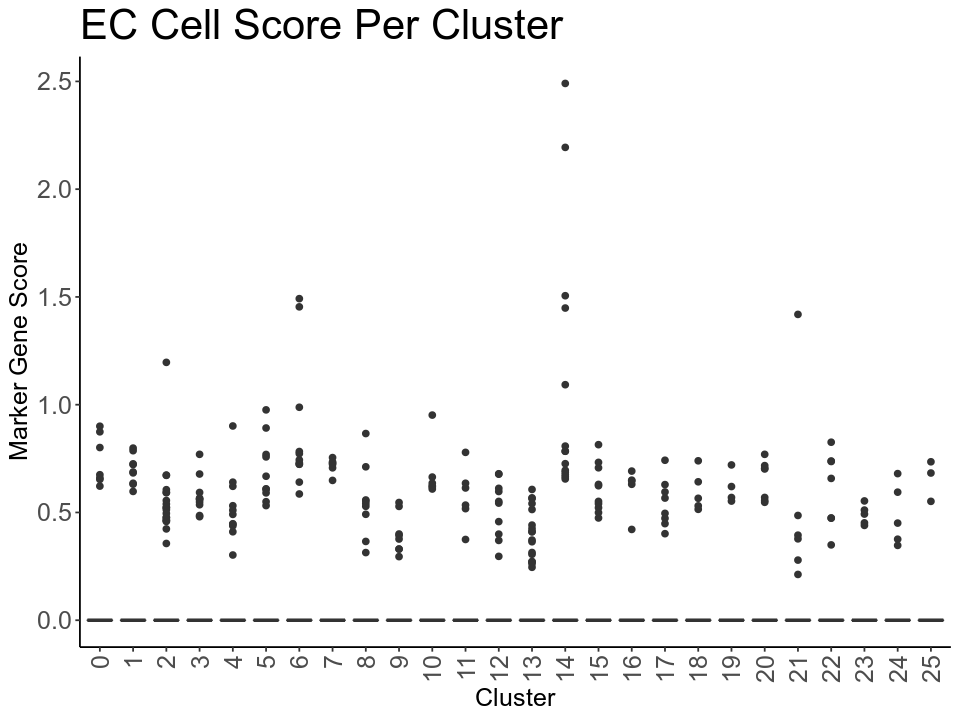

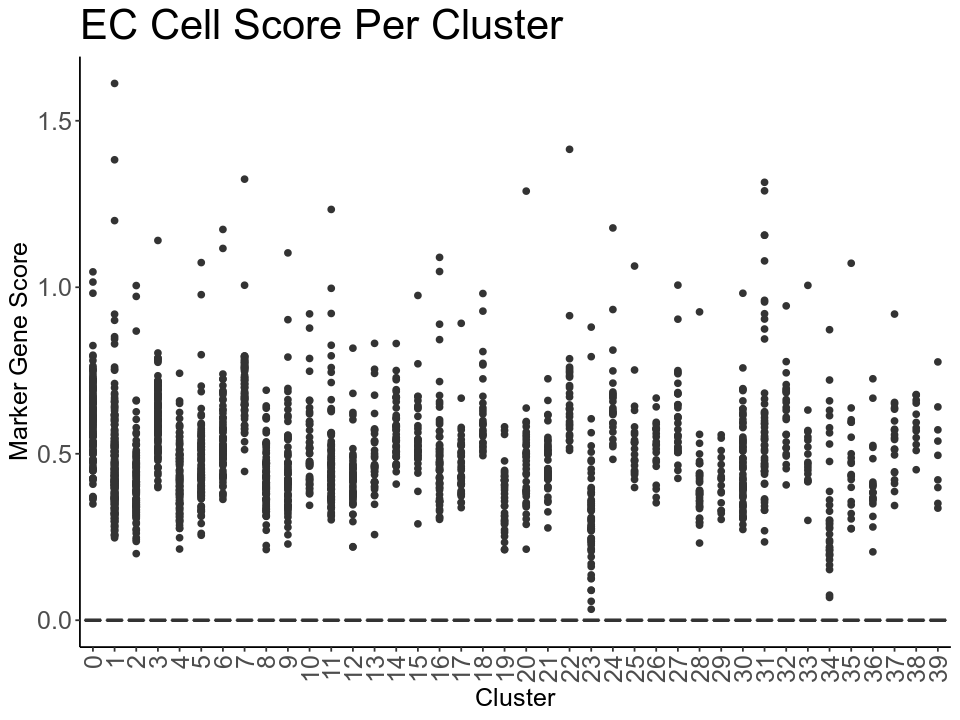

In [70]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = EC)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 25))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'EC Cell Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
ggplot(sc_meta, aes(x = as.character(qc_cluster), y = EC)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 39))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'EC Cell Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

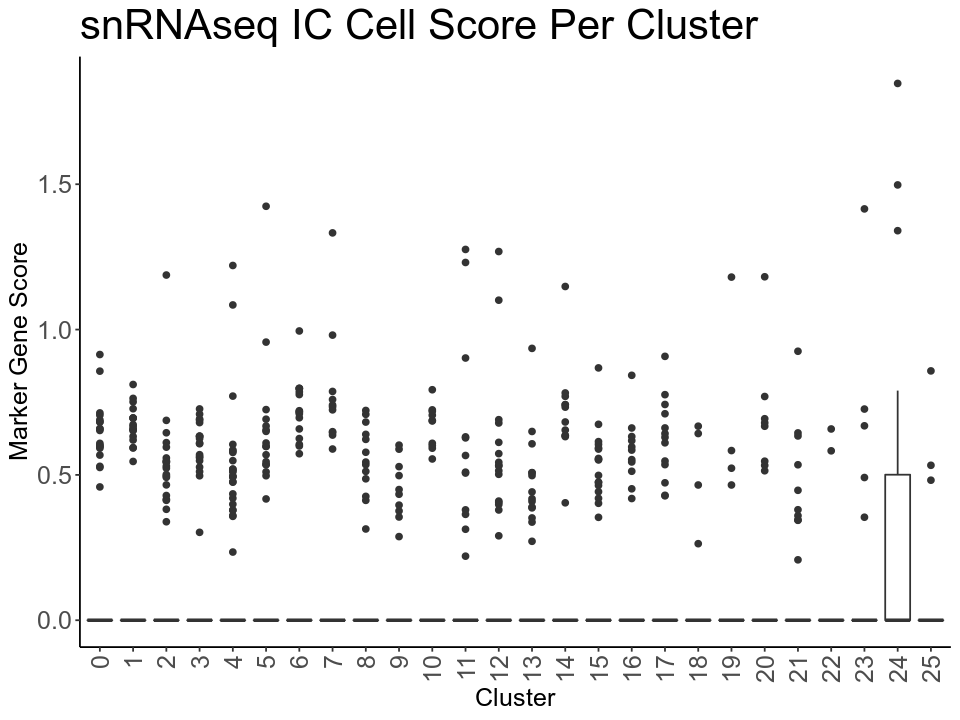

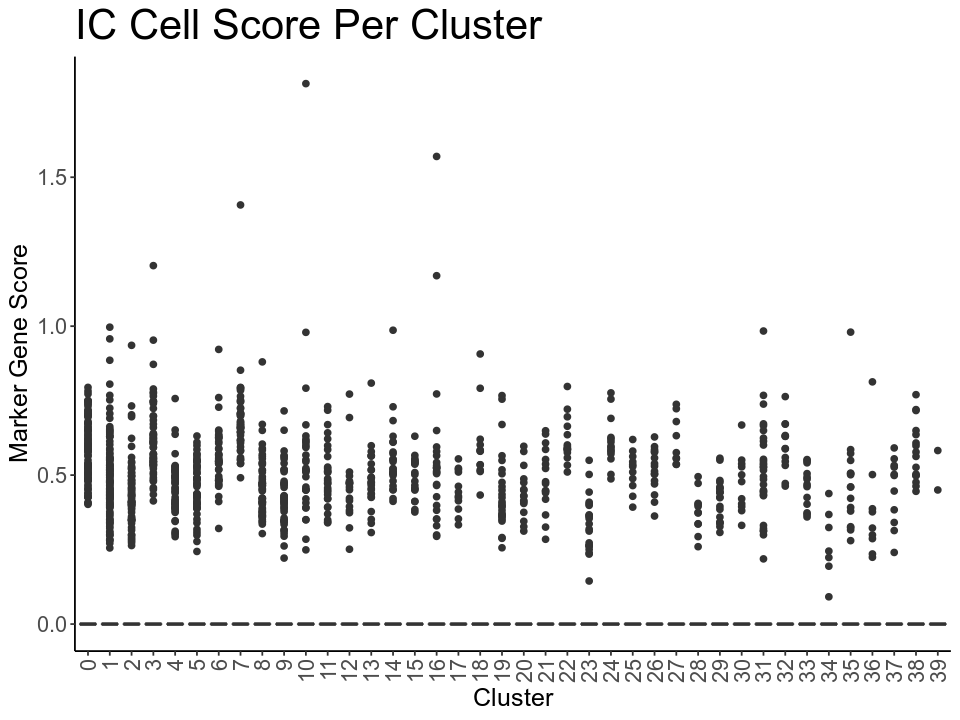

In [81]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = IC)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 25))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'snRNAseq IC Cell Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

ggplot(sc_meta, aes(x = as.character(qc_cluster), y = IC)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 39))) + 
    theme(axis.text = element_text(size = 13), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'IC Cell Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

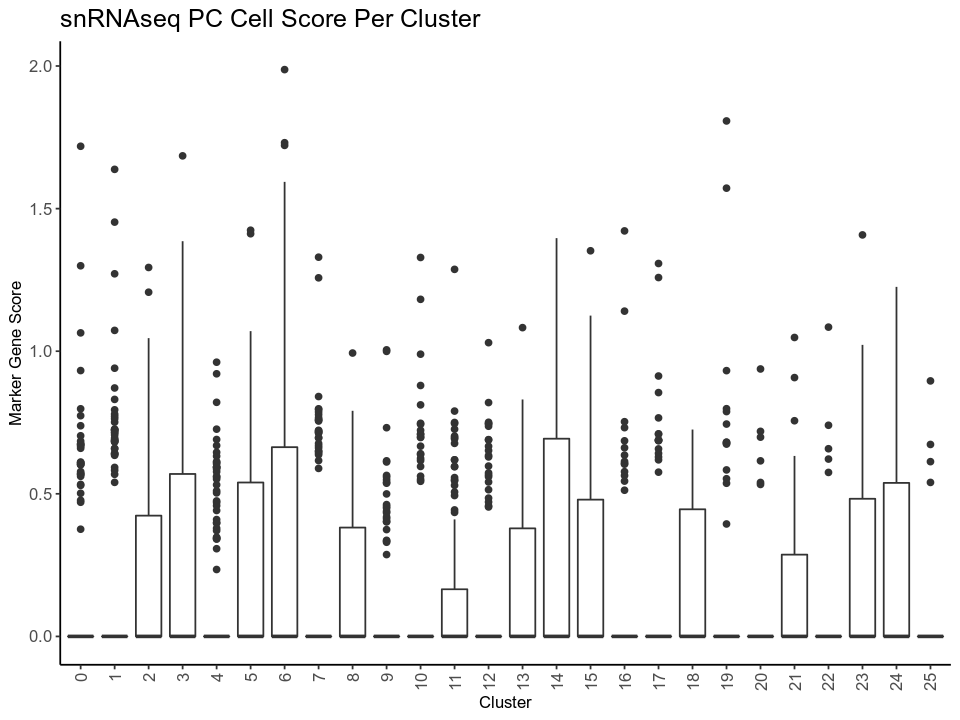

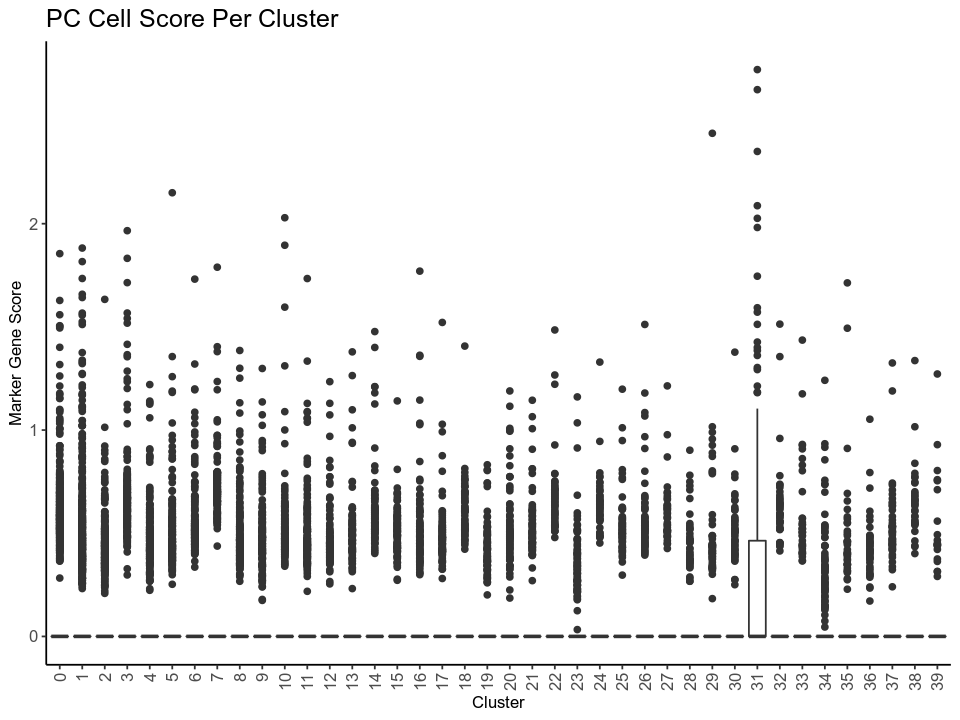

In [88]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = PC)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 25))) + 
    theme(axis.text = element_text(size = 10), axis.title = element_text(size = 10), plot.title = element_text(size = 15)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'snRNAseq PC Cell Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

ggplot(sc_meta, aes(x = as.character(qc_cluster), y = PC)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 39))) + 
    theme(axis.text = element_text(size = 10), axis.title = element_text(size = 10), plot.title = element_text(size = 15)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'PC Cell Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

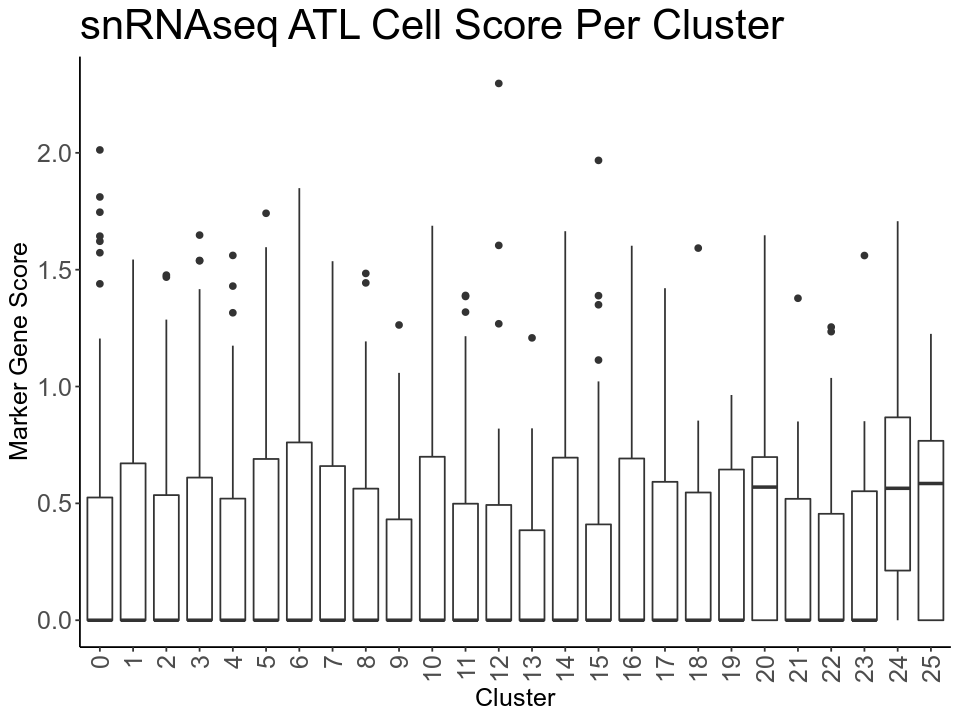

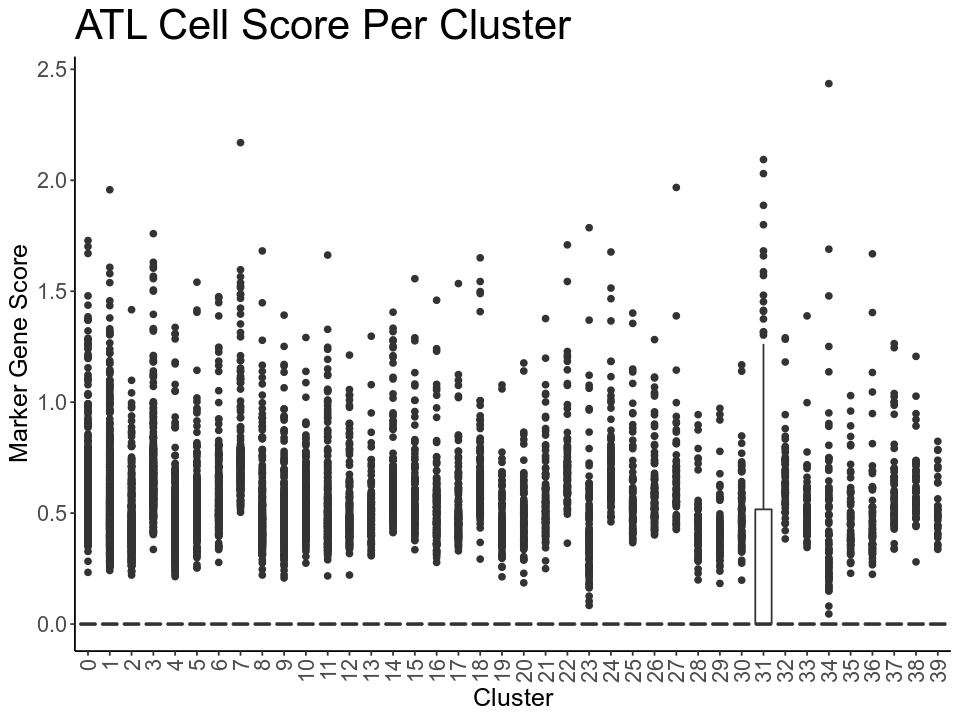

In [83]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = ATL)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 25))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'snRNAseq ATL Cell Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

ggplot(sc_meta, aes(x = as.character(qc_cluster), y = ATL)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 39))) + 
    theme(axis.text = element_text(size = 13), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'ATL Cell Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

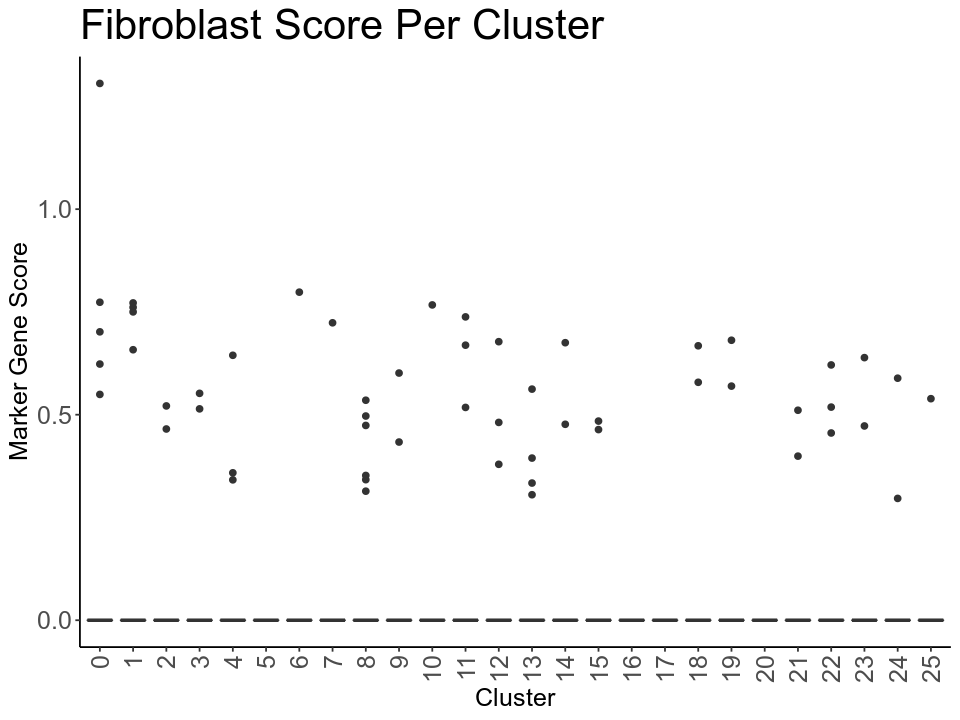

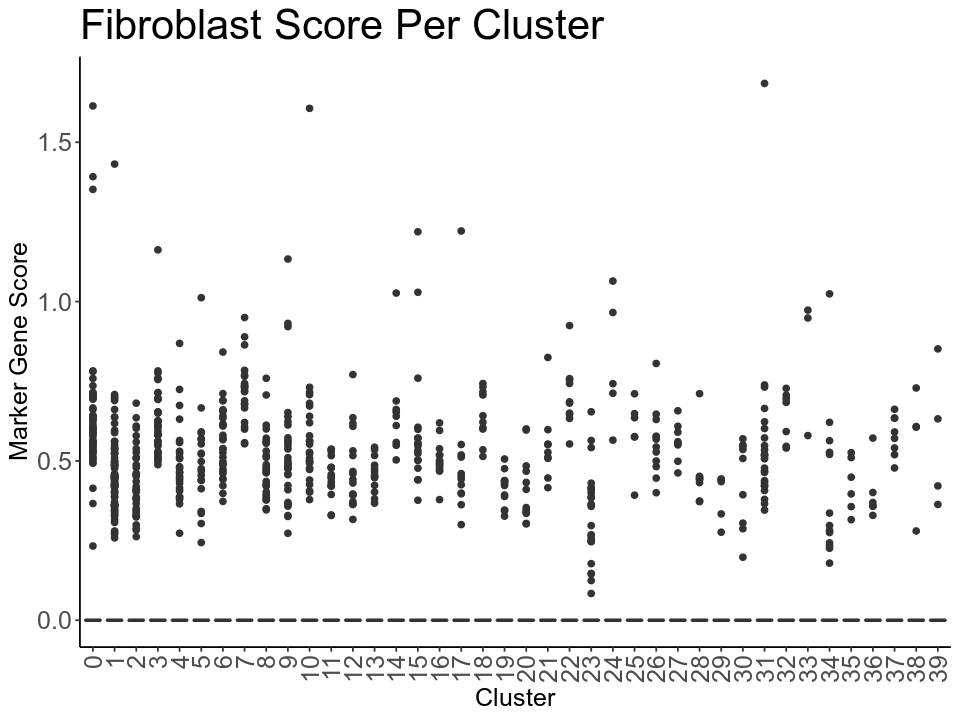

In [76]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = Fib)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 25))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'Fibroblast Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

ggplot(sc_meta, aes(x = as.character(qc_cluster), y = Fib)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 39))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'Fibroblast Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

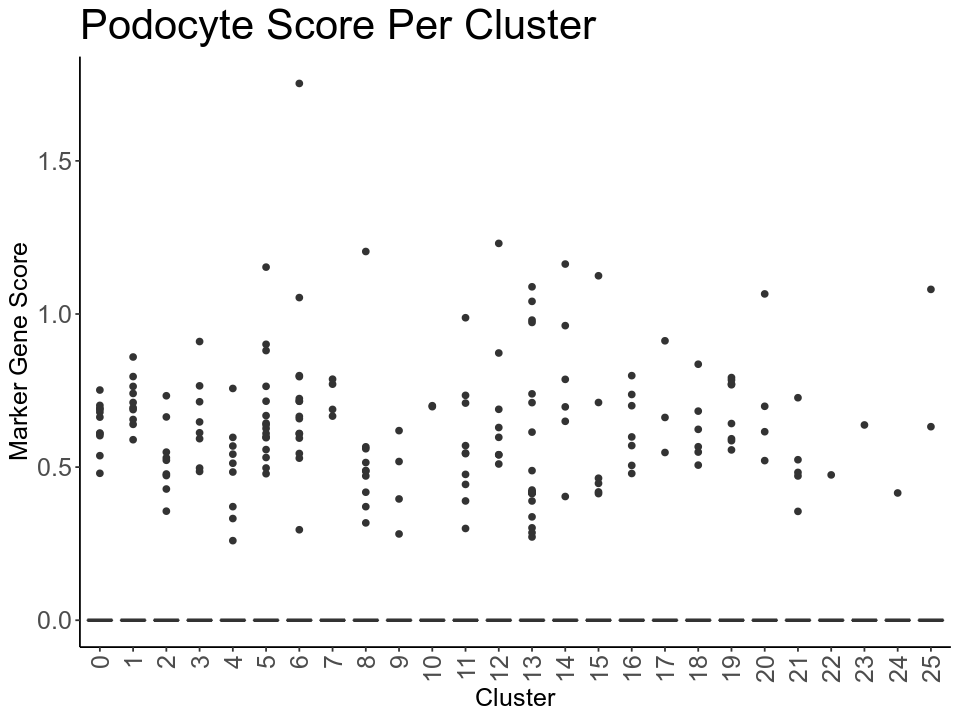

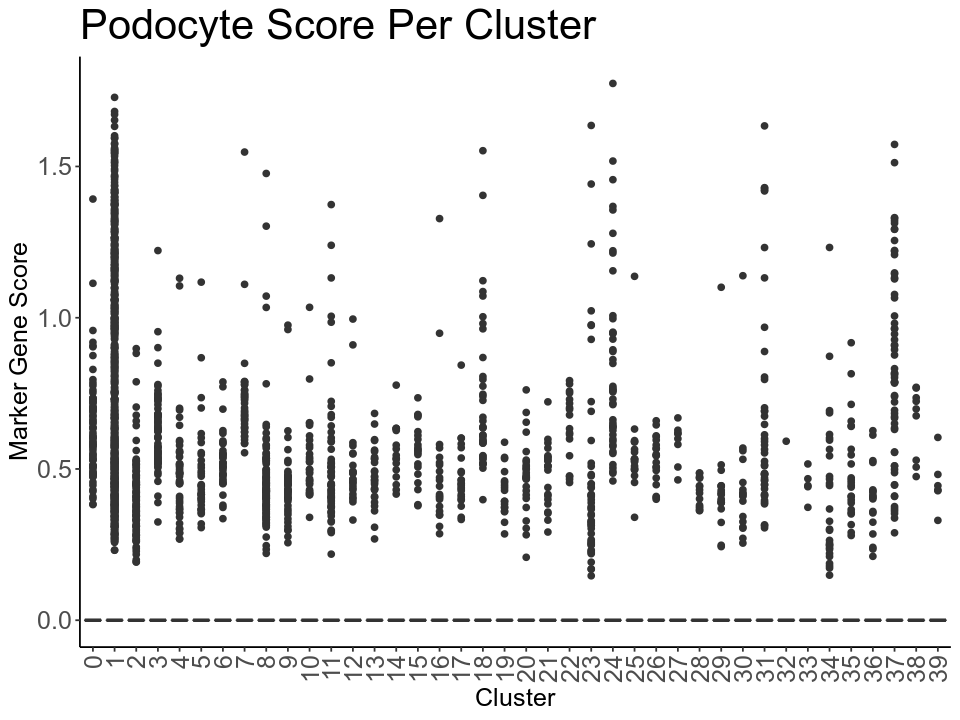

In [78]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = Pod)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 25))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'Podocyte Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

ggplot(sc_meta, aes(x = as.character(qc_cluster), y = Pod)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 39))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'Podocyte Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

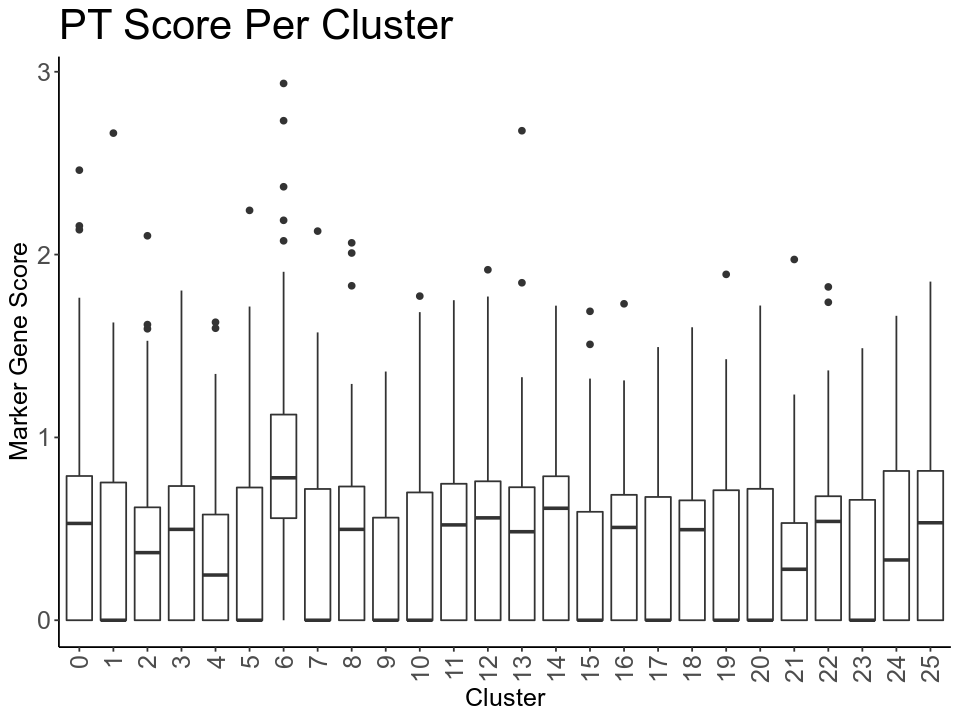

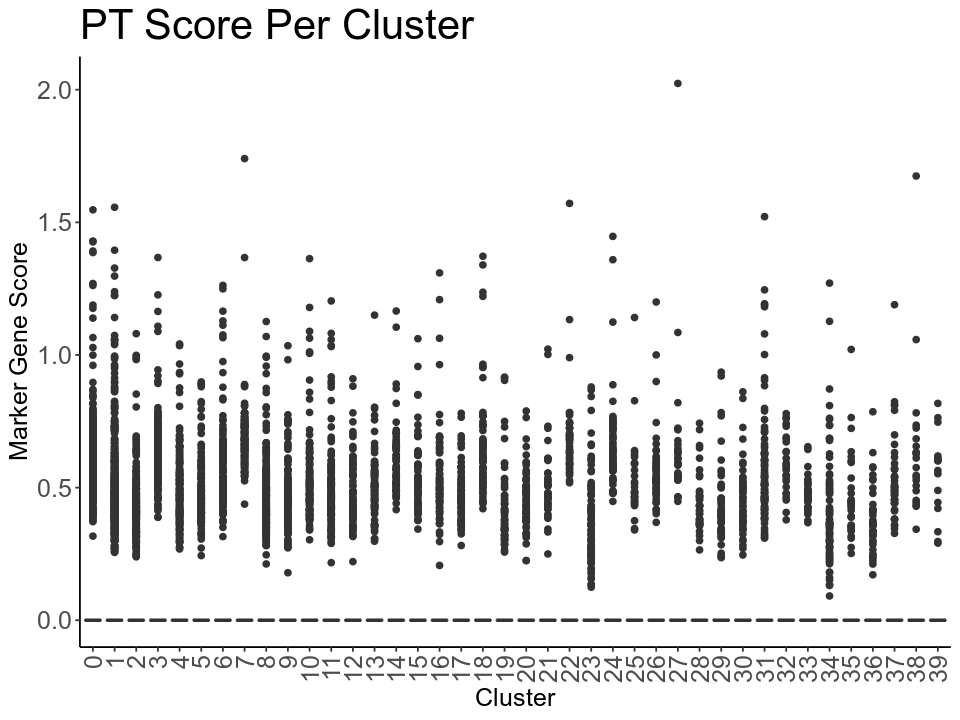

In [80]:
ggplot(nuc_meta, aes(x = as.character(qc_cluster), y = PT)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 25))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'PT Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

ggplot(sc_meta, aes(x = as.character(qc_cluster), y = PT)) + 
    geom_boxplot() + 
    theme_classic() +
    scale_x_discrete(limits = factor(seq(0, 39))) + 
    theme(axis.text = element_text(size = 15), axis.title = element_text(size = 15), plot.title = element_text(size = 25)) +
    labs(x = 'Cluster', y = 'Marker Gene Score', title = 'PT Score Per Cluster') +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

In [111]:
qcd_sc_meta <- sc_meta 
qcd_sc_norm <- sc_norm[, qcd_sc_meta$cell]

qcd_sn_meta <- nuc_meta %>% filter(qc_cluster != 24)
qcd_sn_norm <- nuc_norm[, qcd_sn_meta$cell]

In [122]:
saveRDS(nuc_meta, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_singlenuc_clustered_meta_09092022.rds')
saveRDS(sc_meta, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_singlecell_clustered_meta_09092022.rds')

In [112]:
qcd_sc_norm <- qcd_sc_norm[, match(qcd_sc_meta$cell, colnames(qcd_sc_norm))]
qcd_sn_norm <- qcd_sn_norm[, match(qcd_sn_meta$cell, colnames(qcd_sn_norm))]

In [113]:
qcd_norm <- cbind(qcd_sc_norm, qcd_sn_norm)
qcd_meta <- rbind(qcd_sc_meta, qcd_sn_meta)

In [123]:
saveRDS(qcd_norm, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_norm_09092022.rds')
saveRDS(qcd_meta, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_meta_09092022.rds')

## Single Dataset Embeddings for CNA

In [129]:
genes_exclude <- c(grep("^MT-|^RPL|^RPS|MALAT1|MIR-", row.names(norm), value = TRUE), Seurat::cc.genes$s.genes, Seurat::cc.genes$g2m.genes) 

In [135]:
qcd_sc_meta <- qcd_meta %>% filter(dataset == 'scRNAseq')
qcd_nuc_meta <- qcd_meta %>% filter(dataset == 'snRNAseq')

In [136]:
qcd_sc_norm <- qcd_norm[, qcd_sc_meta$cell]
qcd_nuc_norm <- qcd_norm[, qcd_sn_meta$cell]

### snRNAseq

In [138]:
## Filtering for expressed genes
threshold_genes <- qcd_nuc_norm[rownames(qcd_nuc_norm[rowMeans(qcd_nuc_norm) >= .01, ]), ]

samples_25 <- qcd_nuc_meta %>% group_by(sample) %>% tally() %>% filter(n > 25) %>% pull(sample)

threshold_samples <- threshold_genes[, qcd_nuc_meta %>% filter(sample %in% samples_25) %>% pull(cell)]
 
## Variable gene selection — very inefficiently written, but essentially using VST to select most variable genes from samples with > 10 cells
var_genes_raw <- singlecellmethods::vargenes_vst(object = threshold_samples, groups = qcd_nuc_meta %>% filter(sample %in% samples_25) %>% pull(sample), topn = 500)

In [139]:
## Scale Data
t_nk_scaled_nuc <- qcd_nuc_norm[var_genes_raw[! var_genes_raw %in% genes_exclude], ] %>% scaleData
## PCA
t_nk_pca_res_nuc <- irlba::prcomp_irlba(t(t_nk_scaled_nuc), 20)

use_weights



[1] FALSE


use_weights

use_weights



[1] FALSE


use_weights

Harmony 1/20

Harmony 2/20

Harmony 3/20

Harmony 4/20

Harmony 5/20

Harmony 6/20

Harmony 7/20

Harmony 8/20

Harmony 9/20

Harmony 10/20

Harmony 11/20

Harmony 12/20

Harmony 13/20

Harmony 14/20

Harmony 15/20

Harmony 16/20

Harmony 17/20

Harmony 18/20

Harmony 19/20

Harmony 20/20



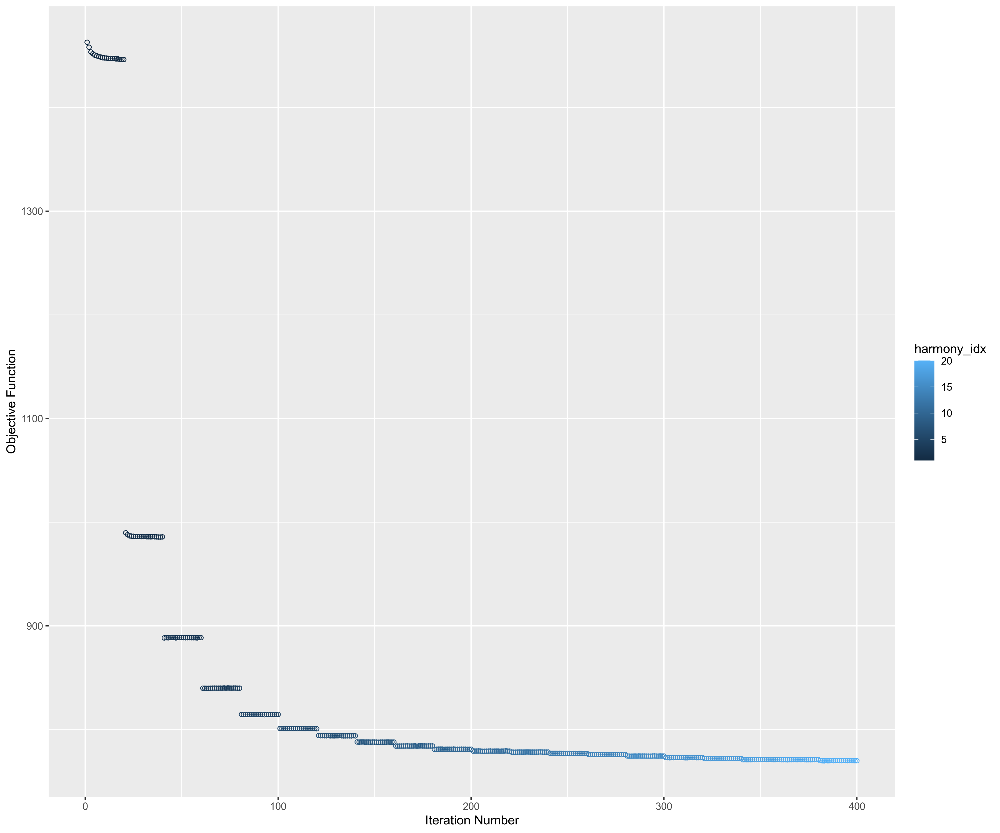

In [166]:
t_nk_harmony_nuc <- HarmonyMatrix(t_nk_pca_res_nuc$x[, 1:20], qcd_nuc_meta, 
                                     vars_use = c("sample", "processing.batch", "Site"), theta = c(1.5, 1, 1),
                        # lambda = 1, 
                        # tau = 0, 
                        epsilon.cluster = -Inf,
                        epsilon.harmony = -Inf,
                        max.iter.cluster = 20,
                        max.iter.harmony = 20,
                        plot_convergence = TRUE,
                        npcs = 20, do_pca = FALSE)

In [168]:
t_nk_humap_res_nuc <- uwot::umap(t_nk_harmony_nuc[, 1:20], n_neighbors = 30L, metric = "euclidean", min_dist = .1)

In [169]:
qcd_nuc_meta_save <- cbind(qcd_nuc_meta, t_nk_harmony_nuc[, 1:20], t_nk_humap_res_nuc)
colnames(qcd_nuc_meta_save)[52:ncol(qcd_nuc_meta_save)] <- c(paste0('snhPC', 1:20), 'schUMAP1', 'schUMAP2')

In [170]:
saveRDS(qcd_nuc_meta_save, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_singlenuc_snRNAseqembeddings_09212022.rds')

In [171]:
t_nk_harmony_nuc <- t_nk_harmony_nuc %>% data.frame()
rownames(t_nk_harmony_nuc) <- qcd_nuc_meta$cell
t_nk_humap_res_nuc <- t_nk_humap_res_nuc %>% data.frame()
rownames(t_nk_humap_res_nuc) <- qcd_nuc_meta$cell
meta <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_chronicity_meta.csv')

In [172]:
t_nk_harmony_nuc <- t_nk_harmony_nuc[meta$cell, ]
t_nk_humap_res_nuc <- t_nk_humap_res_nuc[meta$cell, ]

In [173]:
write.csv(t_nk_harmony_nuc, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_chronicity_harmony_singledataset.csv', row.names = FALSE, quote = FALSE)
write.csv(t_nk_humap_res_nuc, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_chronicity_umap_singledataset.csv', row.names = FALSE, quote = FALSE)

In [335]:
t_nk_harmony_nuc <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_chronicity_harmony_singledataset.csv')
t_nk_harmony_sc <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_chronicity_harmony_singledataset.csv')

In [339]:
umap_nuc <- uwot::umap(t_nk_harmony_nuc)
umap_sc <- uwot::umap(t_nk_harmony_sc)

In [342]:
umaps <- rbind(umap_nuc %>% data.frame() %>% mutate(dataset = 'snRNAseq'), umap_sc %>% data.frame() %>% mutate(dataset = 'scRNAseq'))

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


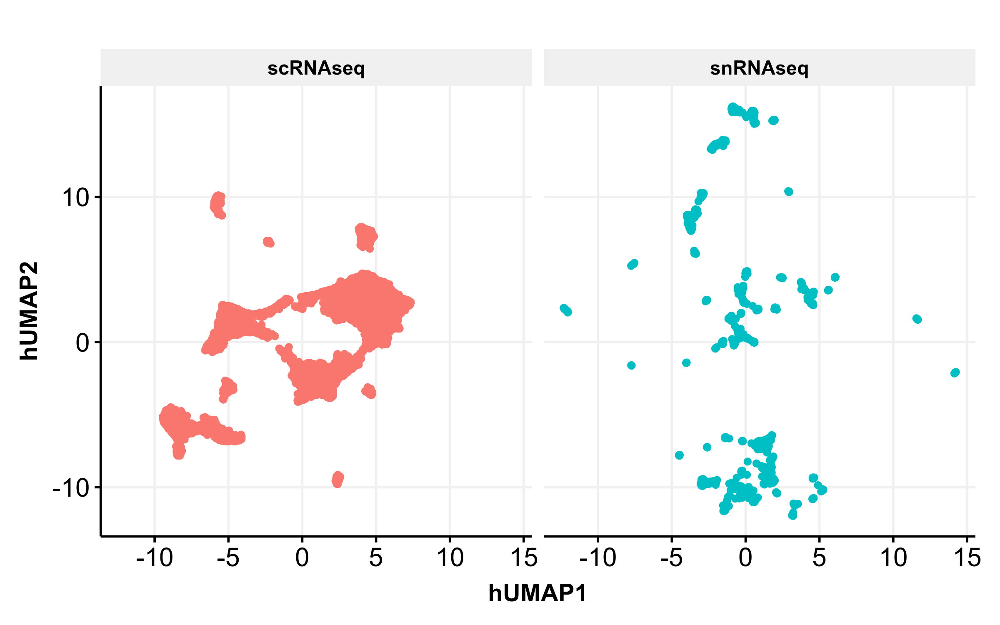

In [348]:
ggplot(umaps, aes(x = X1, y = X2, color = dataset)) + 
    geom_point() + 
    facet_wrap(~ dataset) + 
    theme_Publication() +
    labs(x = 'hUMAP1', y = 'hUMAP2') + 
    theme(legend.position = 'none')

### scRNAseq

In [146]:
## Filtering for expressed genes
threshold_genes <- qcd_sc_norm[rownames(qcd_sc_norm[rowMeans(qcd_sc_norm) >= .01, ]), ]

samples_25 <- qcd_sc_meta %>% group_by(sample) %>% tally() %>% filter(n > 25) %>% pull(sample)

threshold_samples <- threshold_genes[, qcd_sc_meta %>% filter(sample %in% samples_25) %>% pull(cell)]
 
## Variable gene selection — very inefficiently written, but essentially using VST to select most variable genes from samples with > 10 cells
var_genes_raw <- singlecellmethods::vargenes_vst(object = threshold_samples, groups = qcd_sc_meta %>% filter(sample %in% samples_25) %>% pull(sample), topn = 500)

In [147]:
## Scale Data
t_nk_scaled_sc <- qcd_sc_norm[var_genes_raw[! var_genes_raw %in% genes_exclude], ] %>% scaleData
## PCA
t_nk_pca_res_sc <- irlba::prcomp_irlba(t(t_nk_scaled_sc), 20)

use_weights



[1] FALSE


use_weights

use_weights



[1] FALSE


use_weights

Harmony 1/20

Harmony 2/20

Harmony 3/20

Harmony 4/20

Harmony 5/20

Harmony 6/20

Harmony 7/20

Harmony 8/20

Harmony 9/20

Harmony 10/20

Harmony 11/20

Harmony 12/20

Harmony 13/20

Harmony 14/20

Harmony 15/20

Harmony 16/20

Harmony 17/20

Harmony 18/20

Harmony 19/20

Harmony 20/20



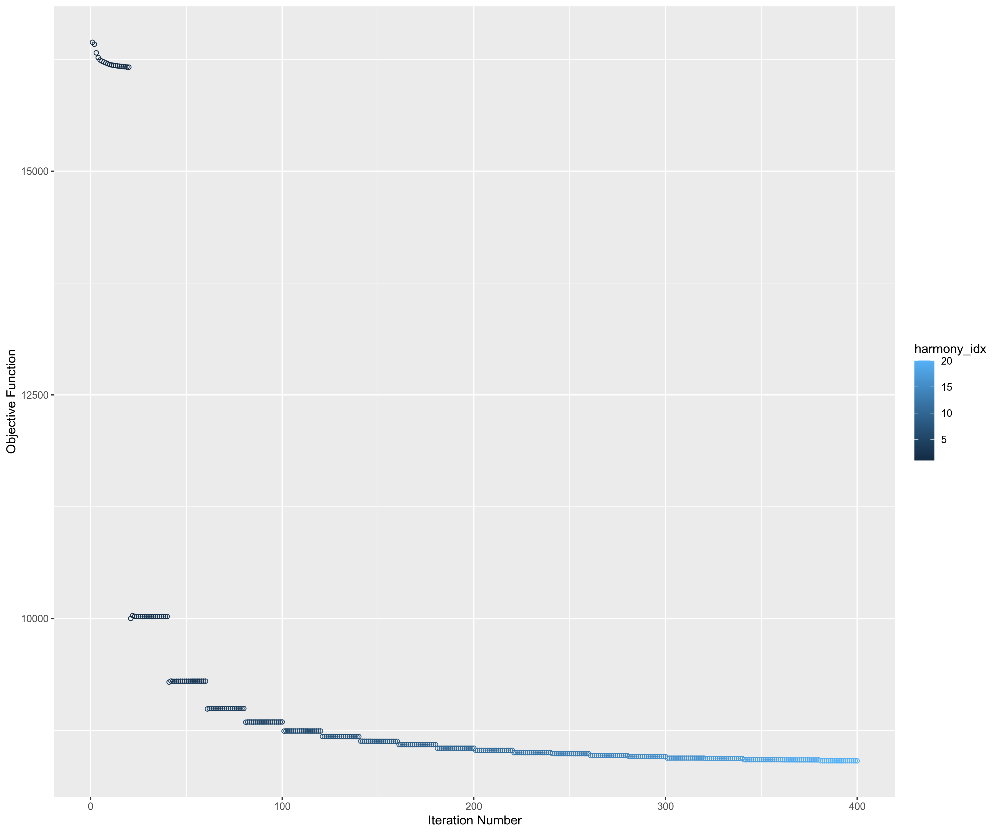

In [148]:
t_nk_harmony_sc <- HarmonyMatrix(t_nk_pca_res_sc$x[, 1:20], qcd_sc_meta, 
                                     vars_use = c("sample", "processing.batch", "Site"), theta = c(1.5, 1, 1),
                        # lambda = 1, 
                        # tau = 0, 
                        epsilon.cluster = -Inf,
                        epsilon.harmony = -Inf,
                        max.iter.cluster = 20,
                        max.iter.harmony = 20,
                        plot_convergence = TRUE,
                        npcs = 20, do_pca = FALSE)

In [149]:
t_nk_humap_res_sc <- uwot::umap(t_nk_harmony_sc[, 1:20], n_neighbors = 30L, metric = "euclidean", min_dist = .1)

In [157]:
qcd_sc_meta_save <- cbind(qcd_sc_meta, t_nk_harmony_sc[, 1:20], t_nk_humap_res_sc)
colnames(qcd_sc_meta_save)[52:ncol(qcd_sc_meta_save)] <- c(paste0('schPC', 1:20), 'schUMAP1', 'schUMAP2')

In [167]:
saveRDS(qcd_sc_meta_save, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_singlecell_scRNAseqembeddings_09212022.rds')

In [162]:
t_nk_harmony_sc <- t_nk_harmony_sc %>% data.frame()
rownames(t_nk_harmony_sc) <- qcd_sc_meta$cell
t_nk_humap_res_sc <- t_nk_humap_res_sc %>% data.frame()
rownames(t_nk_humap_res_sc) <- qcd_sc_meta$cell
meta <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_chronicity.meta.csv')

In [164]:
t_nk_harmony_sc <- t_nk_harmony_sc[meta$cell, ]
t_nk_humap_res_sc <- t_nk_humap_res_sc[meta$cell, ]

In [165]:
write.csv(t_nk_harmony_sc, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_chronicity_harmony_singledataset.csv', row.names = FALSE, quote = FALSE)
write.csv(t_nk_humap_res_sc, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_chronicity_umap_singledataset.csv', row.names = FALSE, quote = FALSE)

## Weighted PCA

In [1]:
qcd_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_meta_09092022.rds')
qcd_norm <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_norm_09092022.rds')

In [2]:
library(harmony)
library(singlecellmethods)
library(dplyr)
library(RSpectra)
library(ggplot2)
library(presto)

Loading required package: Rcpp

Loading required package: data.table


Attaching package: ‘singlecellmethods’


The following object is masked from ‘package:base’:

    rowMeans



Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [3]:
# weighted PCA is in immunogenomics/singlecellmethods, function weighted_pca
weighted_pca <- function(X, weights, genes_use=NULL, npc=20, do_corr=TRUE, scale_thresh=10) {
    if (!identical(length(weights), ncol(X))) {
        stop('Columns in X must match length of weights')
    }
    
#     y <- factor(y)
#     weights <- as.numeric((1 / prop.table(table(y)))[y]) / nlevels(y)
    if (any(is.na(weights))) {
        idx_keep <- which(is.na(weights))
#         y <- y[idx_keep]
        weights <- weights[idx_keep]
        X <- X[, idx_keep]
    }
    if (is.null(genes_use)) {
        genes_use <- row.names(X)
    } else if (length(genes_use) < nrow(X)) {
        if (any(!genes_use %in% row.names(X))) {
            stop('genes_use not in rownames of X')
        }
        X <- X[genes_use, ]
    }
    
    ## weighted z-scores
#     mu <- X %>% apply(1, function(x) {SDMTools:::wt.mean(x, weights)})
#     sig <- X %>% apply(1, function(x) {SDMTools:::wt.sd(x, weights)})
    mu <- singlecellmethods::rowMeans(X, weights = weights)
    sig <- singlecellmethods::rowSDs(X, weights = weights)
    
    # Added 12/9/19: save weighted scaling means and std devs
    vargenes_means_sds <- tibble(
        symbol = genes_use,
        mean = mu
    )
    vargenes_means_sds$stddev <- sig
    # finish added 12/9/19
    
    X <- scaleDataWithStats(X, mu, sig) 
    X <- X[which(is.na(rowSums(X)) == 0), ]
    if (do_corr) {
        X <- X %>% scale() %>% pmin(scale_thresh) %>% pmax(-scale_thresh)
    }
    
    ## weighted SVD
#     pres <- rsvd::rsvd(X %*% Matrix::Diagonal(x = sqrt(weights)), k = npc)
    pres <- RSpectra::svds(X %*% Matrix::Diagonal(x = sqrt(weights)), npc)
    V <- (Matrix::Diagonal(x = 1 / sqrt(weights)) %*% pres$v) %*% diag(pres$d)
    V <- as.matrix(V)
    colnames(V) <- paste0('PC', 1:npc)
    row.names(V) <- colnames(X)
    colnames(pres$u) <- paste0('PC', 1:npc)
    row.names(pres$u) <- row.names(X)
    return(list(loadings = pres$u, embeddings = V, vargenes = vargenes_means_sds))
}

# Cosine normalize values
cosine_normalize <- function(X, MARGIN = 1, do_safe = TRUE) {
    if (do_safe) {
        X <- sweep(X, MARGIN, apply(X, MARGIN, max), "/")
    }
    sweep(X, MARGIN, apply(X, MARGIN, function(x) sqrt(sum(x^2))), "/")
}
                           
                                                    
do_pca <- function(X, weights, genes_use=NULL, npc=10, do_corr=TRUE) {
    if (is.null(genes_use)) {
        genes_use <- row.names(X)
    }
    mu <- X[genes_use, ] %>% apply(1, function(x) {SDMTools:::wt.mean(x, weights)})
    sig <- X[genes_use, ] %>% apply(1, function(x) {SDMTools:::wt.sd(x, weights)})
    
    X <- X[genes_use, ] %>% scaleDataWithStats(mu, sig) 
    X <- X[which(is.na(rowSums(X)) == 0), ]
    if (do_corr) {
        X <- scale(X)
    }
    pres <- rsvd::rsvd(X, k = npc)
    V <- pres$v %*% diag(pres$d)
    V <- data.table(V)
    colnames(V) <- paste0('PC', 1:npc)
    return(V)    
}
                           
get_stats <- function(X, weights, genes_use=NULL) {
    if (is.null(genes_use)) {
        genes_use <- row.names(X)
    }
    mu <- X[genes_use, ] %>% apply(1, function(x) {SDMTools:::wt.mean(x, weights)})
    sig <- X[genes_use, ] %>% apply(1, function(x) {SDMTools:::wt.sd(x, weights)})
    return(list(mu = mu, sig = sig))
}
                           
                           
plot_shuffled_features <- function(ab, umap, exprs, pct) {
    library(viridis)
    max.cutoff = quantile(exprs[ab,], pct)
    min.cutoff = quantile(exprs[ab,], 1-pct)
    
    tmp <- sapply(X = exprs[ab,], FUN = function(x) {
        return(ifelse(test = x > max.cutoff, yes = max.cutoff,
            no = x))
    })
    tmp <- sapply(X = tmp, FUN = function(x) {
        return(ifelse(test = x < min.cutoff, yes = min.cutoff,
            no = x))
    })
    umap_res_plot <- cbind(umap, tmp)
    return(ggplot(data = as.data.frame(umap_res_plot)[sample(nrow(umap_res_plot)),] , aes(x = V1, y = V2)) +
      geom_point(mapping = aes(color = tmp), size = 0.75) +
      scale_color_viridis(option = "inferno", end = pct) +
      theme_classic() +
      theme(plot.title = element_text(size = 15), legend.position = "none") +
      labs(title = ab, x = 'hUMAP1', y = 'hUMAP2', color = "Normalized Expression"))
}
                           fig.size <- function (height, width) {
    options(repr.plot.height = height, repr.plot.width = width, repr.plot.res = 300)
}
                           
                           
vargenes_vst <- function(object, groups, topn, loess.span = 0.3) {
    clip.max <- sqrt(ncol(object))

    N <- ncol(object)
    if (missing(groups)) {
        groups <- rep('A', N)
    }
    
    res <- split(seq_len(N), groups) %>% lapply(function(idx) {
        object_group <- object[, idx]
        ## row means
        hvf.info <- data.frame(
          symbol = rownames(object_group), 
          mean = Matrix::rowMeans(object_group)
        )

        ## row vars
        hvf.info$variance <- rowVars(object_group, hvf.info$mean)

        ## initialize
        hvf.info$variance.expected <- 0
        hvf.info$variance.standardized <- 0

        not.const <- hvf.info$variance > 0

        ## loess curve fit 
        suppressWarnings({
            fit <- loess(formula = log10(variance) ~ log10(mean), 
                data = hvf.info[not.const, ], span = loess.span)            
        })

        ## extract fitted variance 
        hvf.info$variance.expected[not.const] <- 10^fit$fitted

        ## get row standard deviations after clipping
        hvf.info$variance.standardized <- rowVarsStd(
            object_group, 
            hvf.info$mean, 
            sqrt(hvf.info$variance.expected), 
            clip.max
        )

        hvf.info <- hvf.info %>% 
#             tibble::rownames_to_column('symbol') %>% 
            arrange(-variance.standardized) %>% 
            tibble::rowid_to_column('rank') %>% 
            transform(group = unique(groups[idx]))

        return(hvf.info)        
    })
    
    
    if (missing(topn)) {
        ## MODE 1: return table 
        res <- Reduce(rbind, res) %>% 
            dplyr::select(group, symbol, rank, everything())

        if (length(unique(res$group)) == 1) {
            res$group <- NULL
        }
    } else {
        ## MODE 2: return genes
        res <- lapply(res, function(x) head(x, topn)$symbol)
    }
    return(res)
}

In [4]:
genes_exclude <- c(grep("^MT-|^RPL|^RPS|MALAT1|MIR-", row.names(norm), value = TRUE), 
                   Seurat::cc.genes$s.genes, Seurat::cc.genes$g2m.genes)

In [5]:
## Filtering for expressed genes
threshold_genes <- qcd_norm[rownames(qcd_norm[rowMeans(qcd_norm) >= .01, ]), ]

samples_25 <- qcd_meta %>% group_by(sample) %>% tally() %>% filter(n > 25) %>% pull(sample)

threshold_samples <- threshold_genes[, qcd_meta %>% filter(sample %in% samples_25) %>% pull(cell)]

## Variable gene selection — very inefficiently written, but essentially using VST to select most variable genes from samples with > 100 cells
var_genes_raw <- vargenes_vst(object = threshold_samples, groups = qcd_meta %>% filter(sample %in% samples_25) %>% pull(sample), topn = 500)

In [6]:
#Separate variable genes by Dataset
var_genes_raw_nuc <- vector()
var_genes_raw_sc <- vector()

for (i in 1:length(var_genes_raw)) {
    if (grepl('nuc', names(var_genes_raw)[i])) {
        var_genes_raw_nuc <- c(var_genes_raw_nuc, var_genes_raw[[i]])
    }
    else {
        var_genes_raw_sc <- c(var_genes_raw_sc, var_genes_raw[[i]])   
    }

}

var_genes_raw_nuc <- var_genes_raw_nuc %>% unique()
var_genes_raw_sc <- var_genes_raw_sc %>% unique() 
#Find intersection
var_genes <- intersect(var_genes_raw_nuc, var_genes_raw_sc)

In [7]:
var_genes %>% length()

[1] 5548

In [8]:
## Scale Data
t_nk_scaled <- qcd_norm[var_genes[!var_genes %in% genes_exclude], ] %>% scaleData()

In [9]:
table(qcd_meta$dataset)
y <- factor(qcd_meta$dataset)
weights <- as.numeric((1 / prop.table(table(y)))[y]) / nlevels(y)
length(weights)
table(weights)


scRNAseq snRNAseq 
   36131     2483 

[1] 38614

weights
0.534361074977166  7.77567458719291 
            36131              2483 

In [10]:
t_nk_scaled <- as(t_nk_scaled, 'dgCMatrix')

In [11]:
weighted_pca_res <- weighted_pca(t_nk_scaled, weights, rownames(t_nk_scaled), 20, TRUE, 10)$embeddings

In [ ]:
set.seed(0)
harmony_weighted2 <- HarmonyMatrix(weighted_pca_res, qcd_meta, 
                            c('sample', 'processing.batch', 'Site', 'dataset'), 
                            c(1.5, 1, 1, 1.5),
                            do_pca = FALSE, 
                            epsilon.harmony = -Inf, 
                            epsilon.cluster = -Inf,
                            weights = weights, 
                            max.iter.cluster = 20,
                            max.iter.harmony = 20, 
                            plot_convergence = TRUE, 
                            return_object = TRUE,
                            verbose = TRUE)

use_weights



[1] TRUE


use_weights

use_weights



[1] TRUE


use_weights



In [135]:
harmony_umap2 <- uwot::umap(harmony_weighted2, n_neighbors = 30L, metric = "euclidean", min_dist = .1)
weighted_umap <- uwot::umap(weighted_pca_res, n_neighbors = 30L, metric = "euclidean", min_dist = .1)

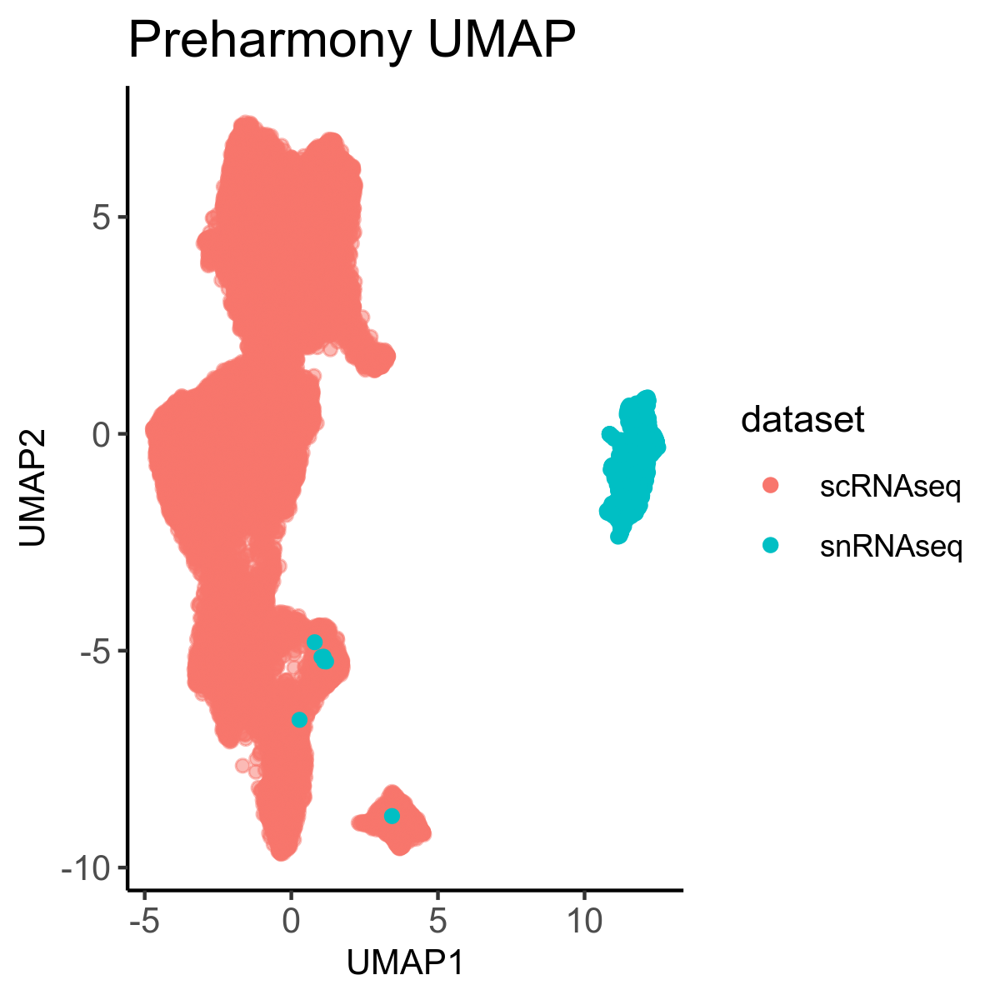

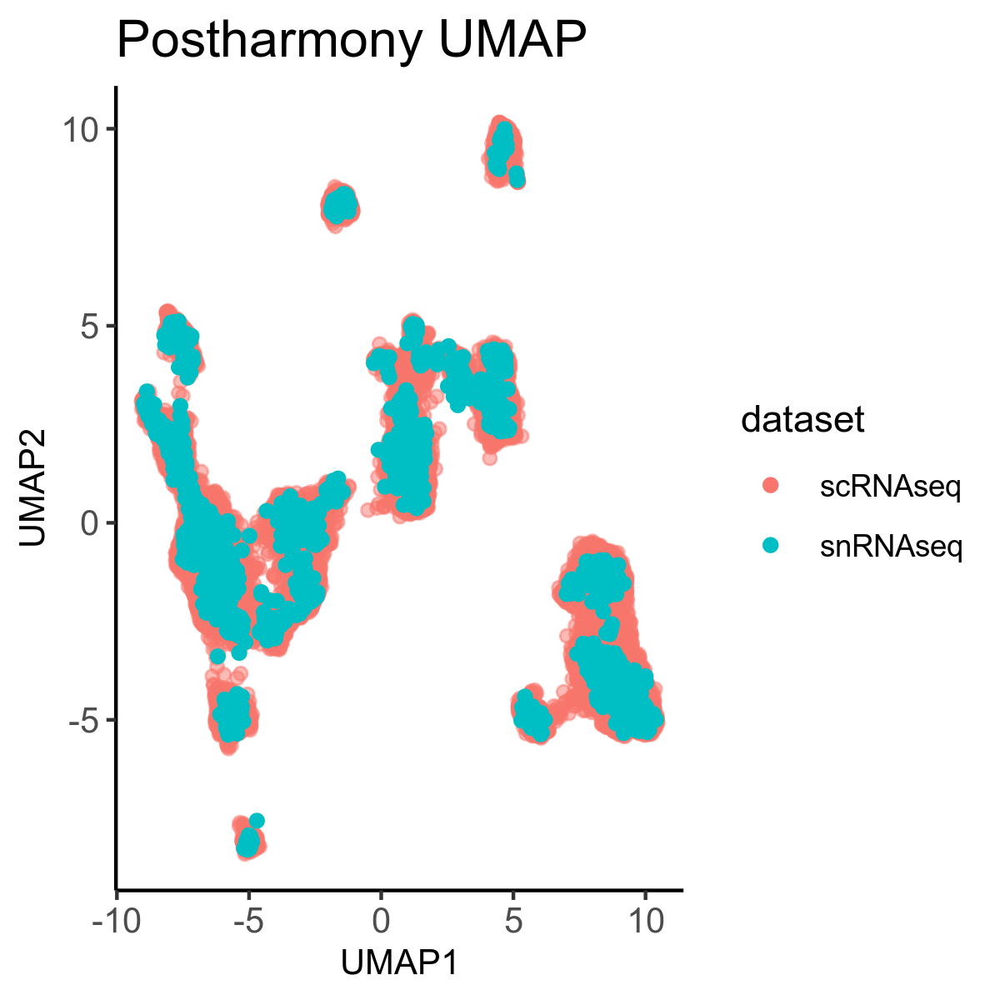

In [139]:
fig.size(4, 4)

df <- weighted_umap %>% data.frame() %>% mutate(dataset = qcd_meta$dataset)
df <- df[sample(nrow(df)), ]
ggplot(df, aes(x = X1, y = X2, color = dataset)) +
    geom_point(data = df %>% filter(dataset == 'scRNAseq'), alpha = 0.5, size = 1.5) +
    geom_point(data = df %>% filter(dataset == 'snRNAseq'), alpha = 2, size = 1.5) +
    theme_classic() + 
    theme(axis.text = element_text(size = 10), axis.title = element_text(size = 10), plot.title = element_text(size = 15)) +
    labs(title = 'Preharmony UMAP', x = 'UMAP1', y = 'UMAP2')

df <- harmony_umap2 %>% data.frame() %>% mutate(dataset = qcd_meta$dataset)
df <- df[sample(nrow(df)), ]
fig.size(4, 4)
ggplot(df, aes(x = X1, y = X2, color = dataset)) +
    geom_point(data = df %>% filter(dataset == 'scRNAseq'), alpha = 0.5, size = 1.5) +
    geom_point(data = df %>% filter(dataset == 'snRNAseq'), alpha = 2, size = 1.5) +
    theme_classic() + 
    theme(axis.text = element_text(size = 10), axis.title = element_text(size = 10), plot.title = element_text(size = 15)) +
    labs(title = 'Postharmony UMAP', x = 'UMAP1', y = 'UMAP2')

In [143]:
snn_ref <- BuildSNNSeurat(harmony_weighted2[,1:20], nn.eps = 0)


resolution_list <- c(0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0)
ids_ref <- Reduce(cbind, mclapply(resolution_list, function(res_use) {
    Seurat:::RunModularityClustering(SNN = snn_ref, modularity = 1,
        resolution = res_use, algorithm = 1, n.start = 20,
        n.iter = 20, random.seed = 100, print.output = FALSE,
        temp.file.location = NULL, edge.file.name = NULL)
}, mc.preschedule = FALSE, mc.cores = min(20, length(resolution_list)))) 

In [144]:
harmony_umap2 <- cbind(harmony_weighted2[, 1:20], harmony_umalot2, ids_ref)
colnames(harmony_umap2) <- c(paste0('hPC', 1:20), 'hUMAP1', 'hUMAP2', 'hres0.2', 'hres0.4', 'hres0.6', 'hres0.8', 'hres1.0', 'hres1.2', 'hres1.4', 'hres1.6', 'hres1.8', 'hres2.0')

In [146]:
qcd_meta <- cbind(qcd_meta %>% 
                  select(-c(colnames(qcd_meta)[grep('hres', colnames(qcd_meta))], 
                             colnames(qcd_meta)[grep('hPC', colnames(qcd_meta))],
                             huwotUMAP1, huwotUMAP2, T, B , Myeloid, EC, 
                             IC, PC, ATL, Fib, Pod, PT, MAST)),
                                                harmony_umap2) 

In [149]:
qcd_meta <- qcd_meta %>% select(-pDC)

In [150]:
saveRDS(qcd_meta, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_meta_harmonizedPCUMAPclusters_09092022.rds')

## Cell Type Clustering

In [2]:
qcd_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_meta_harmonizedPCUMAPclusters_09092022.rds')
qcd_norm <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_norm_09092022.rds')

In [15]:
arnon_annot <- readRDS('/data/srlab2/jmears/jupyter/SLE_Phase2_Kidney_Analysis/Final-Arnon-Output/all_T+NK_cells.w_clustering.rds')

In [16]:
arnon_annotations <- c('0. Res. Mem. CD4', '1. GZMK CD8', '2. CD56dim NK', '3. Non Res. Mem. CD4', '4. GZMK CD8 (low quality)',
                       '5. CTLs', '6. Res. Mem CD8', '7. Non. Res. Mem CD4', '8. DP T', '9. Th17', '10. Tregs', '11. CD56brightNK' , 
                       '12. Th1', '13. GZMK CD8', '14. TFH', '15. CTLs', '16. CD4 (low quality)', '17. ILCs', '18. GZMK CD8', 
                       '19. gamma/delta', '20. GZMK CD8', '21. ISG High', '22. Th1', '23. gamma/delta', '24. CD56bright NK', 
                       '25. High Producers')

In [17]:
arnon_clusters <- data.frame(cell = names(arnon_annot@active.ident), 
                             arnon_cluster = arnon_annot@active.ident)

arnon_clusters <- left_join(arnon_clusters, data.frame(arnon_cluster = as.factor(0:25), arnon_annotations = arnon_annotations))

Joining, by = "arnon_cluster"


In [19]:
left_join(arnon_clusters, qcd_meta) %>% filter(arnon_cluster == 9)

Joining, by = "cell"


cell,arnon_cluster,arnon_annotations,sample,Annot.separate,dataset,uwotUMAP1,uwotUMAP2,Site,Type,⋯,hres0.2,hres0.4,hres0.6,hres0.8,hres1.0,hres1.2,hres1.4,hres1.6,hres1.8,hres2.0
<chr>,<fct>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ACCCTTGTCTAGTGAC-1-AMPSLEkid_cells_0134,9,9. Th17,AMPSLEkid_cells_0134,T,scRNAseq,2.31888896,-14.37767,Rochester,LN,⋯,6,8,8,7,7,7,7,8,8,9
ACCGTTCTCGCACGAC-1-AMPSLEkid_cells_0134,9,9. Th17,AMPSLEkid_cells_0134,T,scRNAseq,1.52558893,-14.91712,Rochester,LN,⋯,6,8,8,7,7,7,7,8,8,9
CACAGGCTCCAGCCTT-1-AMPSLEkid_cells_0134,9,9. Th17,AMPSLEkid_cells_0134,T,scRNAseq,-0.04153999,-14.85688,Rochester,LN,⋯,6,8,8,7,7,7,7,8,8,9
CCTCATGGTGCGGTAA-1-AMPSLEkid_cells_0134,9,9. Th17,AMPSLEkid_cells_0134,T,scRNAseq,1.63667792,-14.54224,Rochester,LN,⋯,2,2,2,2,2,2,2,1,1,0
CTAACTTGTGACAGCA-1-AMPSLEkid_cells_0134,9,9. Th17,AMPSLEkid_cells_0134,T,scRNAseq,0.75935942,-15.05910,Rochester,LN,⋯,6,8,8,7,7,7,7,8,8,9
GAAGGGTTCAAACCCA-1-AMPSLEkid_cells_0134,9,9. Th17,AMPSLEkid_cells_0134,T,scRNAseq,2.33805686,-14.74380,Rochester,LN,⋯,6,8,8,7,7,7,7,8,8,9
GACCTTCCAAGTATCC-1-AMPSLEkid_cells_0134,9,9. Th17,AMPSLEkid_cells_0134,T,scRNAseq,2.92972809,-14.42298,Rochester,LN,⋯,6,8,8,7,7,7,7,8,8,9
GGAGGATCAGACCATT-1-AMPSLEkid_cells_0134,9,9. Th17,AMPSLEkid_cells_0134,T,scRNAseq,1.11584502,-14.90389,Rochester,LN,⋯,1,0,0,0,0,0,0,2,2,1
GTGCTTCTCACTTATC-1-AMPSLEkid_cells_0134,9,9. Th17,AMPSLEkid_cells_0134,T,scRNAseq,1.70026260,-15.06233,Rochester,LN,⋯,6,8,8,7,7,7,7,8,8,9


In [7]:
qcd_meta <- left_join(qcd_meta, qcd_meta %>% 
            group_by(hres0.6) %>% 
            summarize(umap_mean = mean(hUMAP1)) %>% 
            arrange(desc(umap_mean)) %>% 
            mutate(new_cluster_number = 0:22) %>% select(- umap_mean))

Joining, by = "hres0.6"


In [13]:
plot_clusters3(qcd_meta$hres0.4, qcd_meta$hres0.4, umap_use = qcd_meta %>% select(hUMAP1, hUMAP2), 
               do_labels = TRUE) +
    scale_color_manual(values = as.vector(polychrome(28))) +
    scale_fill_manual(values = as.vector(polychrome(28))) +
    labs(title = 'Clustering Resolution: 0.2') + 
    theme(plot.title = element_text(size = 20))

plot_clusters3(qcd_meta$new_cluster_number, qcd_meta$new_cluster_number, umap_use = qcd_meta %>% select(hUMAP1, hUMAP2), 
               do_labels = TRUE) +
    scale_color_manual(values = as.vector(polychrome(28))) +
    scale_fill_manual(values = as.vector(polychrome(28))) + 
    labs(title = 'Current Clustering Resolution: 0.6') +
    theme(plot.title = element_text(size = 20))


ERROR: Error in plt_df %<>% cbind(cluster_label = labels): could not find function "%<>%"


Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


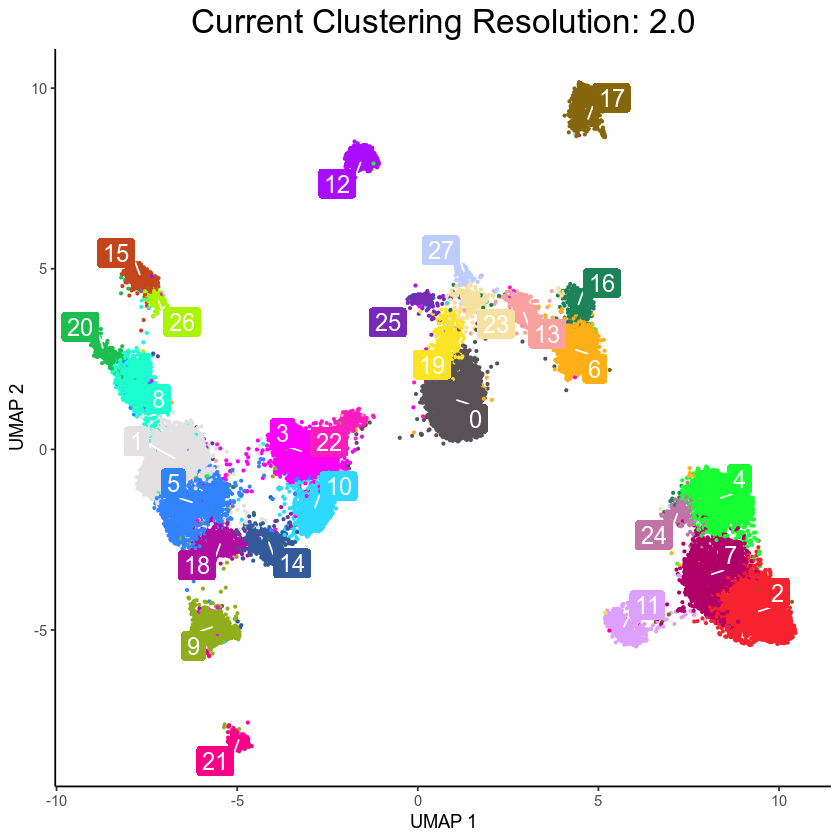

In [27]:
plot_clusters3(qcd_meta$hres2.0, qcd_meta$hres2.0, umap_use = qcd_meta %>% select(hUMAP1, hUMAP2), 
               do_labels = TRUE) +
    scale_color_manual(values = as.vector(polychrome(28))) +
    scale_fill_manual(values = as.vector(polychrome(28))) + 
    labs(title = 'Current Clustering Resolution: 2.0') +
    theme(plot.title = element_text(size = 20))

In [243]:
wilcox <- wilcoxauc(qcd_norm, qcd_meta$new_cluster_number)

ERROR: Error in group_by(., new_cluster_number): object 'tmp_meta' not found


Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“Removed 1 rows containing missing values (geom_label_repel).”


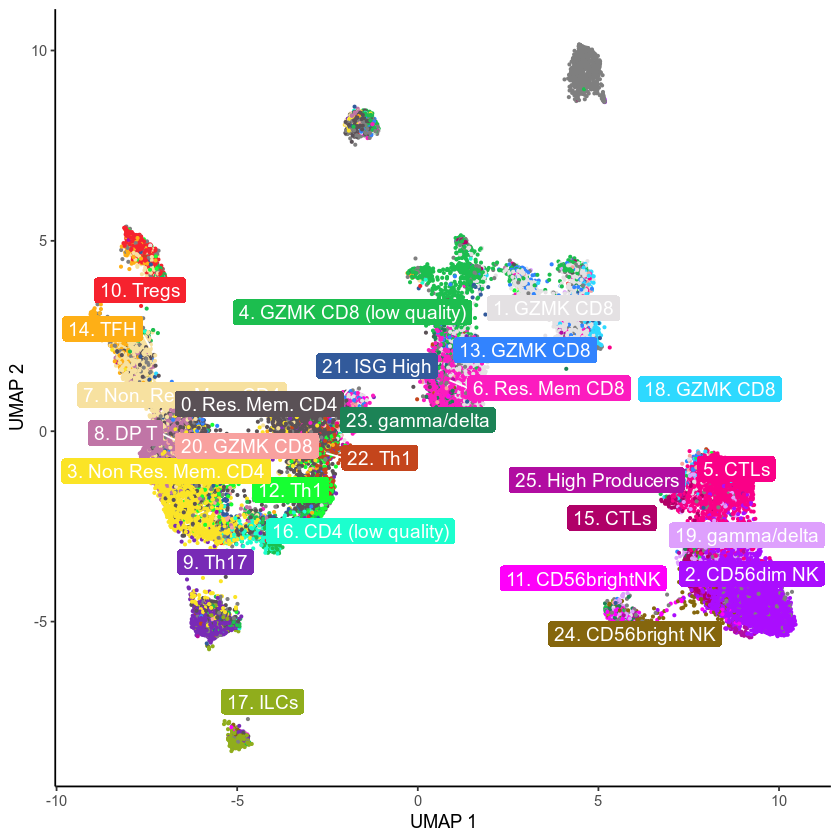

In [19]:
df <- qcd_meta[sample(nrow(qcd_meta)), ]
plot_clusters3(df$arnon_annotations, 
               df$arnon_annotations, 
               umap_use = df %>% select(hUMAP1, hUMAP2), 
               do_labels = TRUE) +
    scale_color_manual(values = as.vector(polychrome(26))) +
    scale_fill_manual(values = as.vector(polychrome(26)))

### MARKER GENES

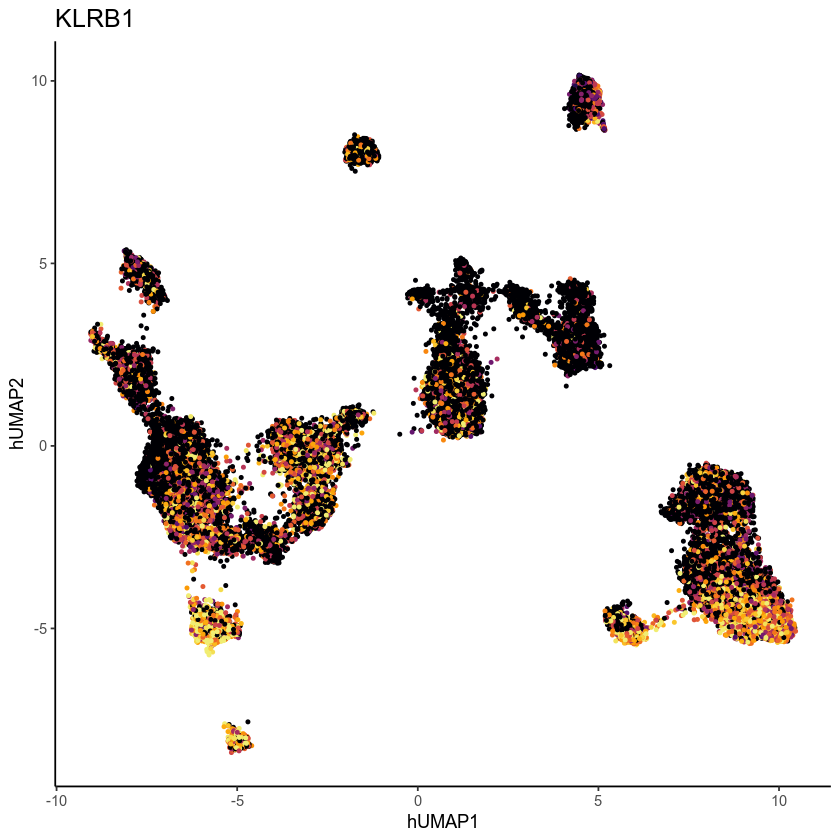

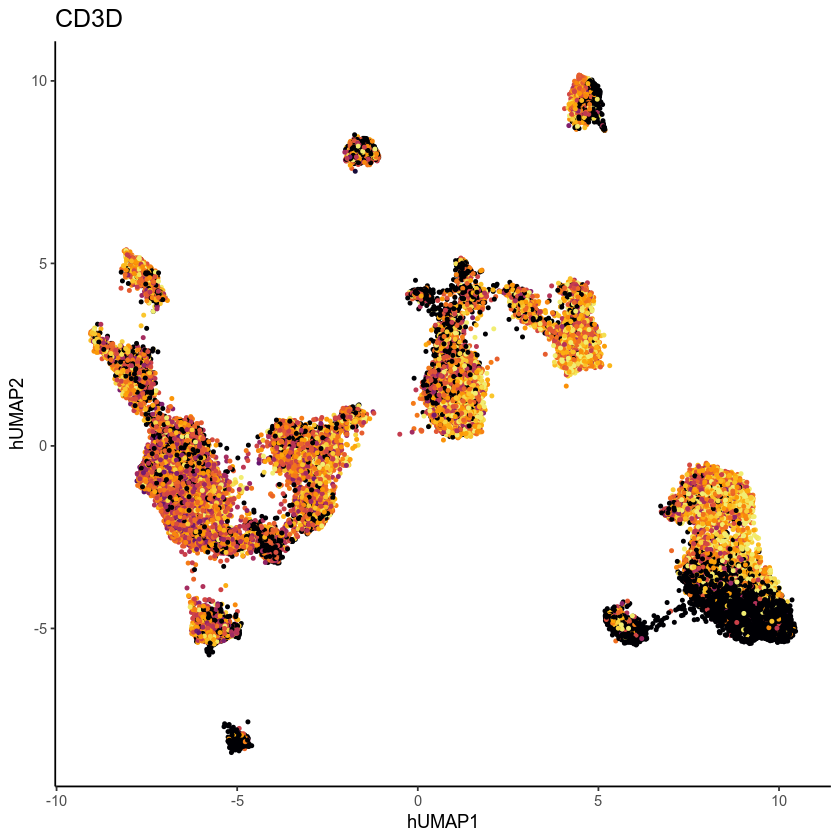

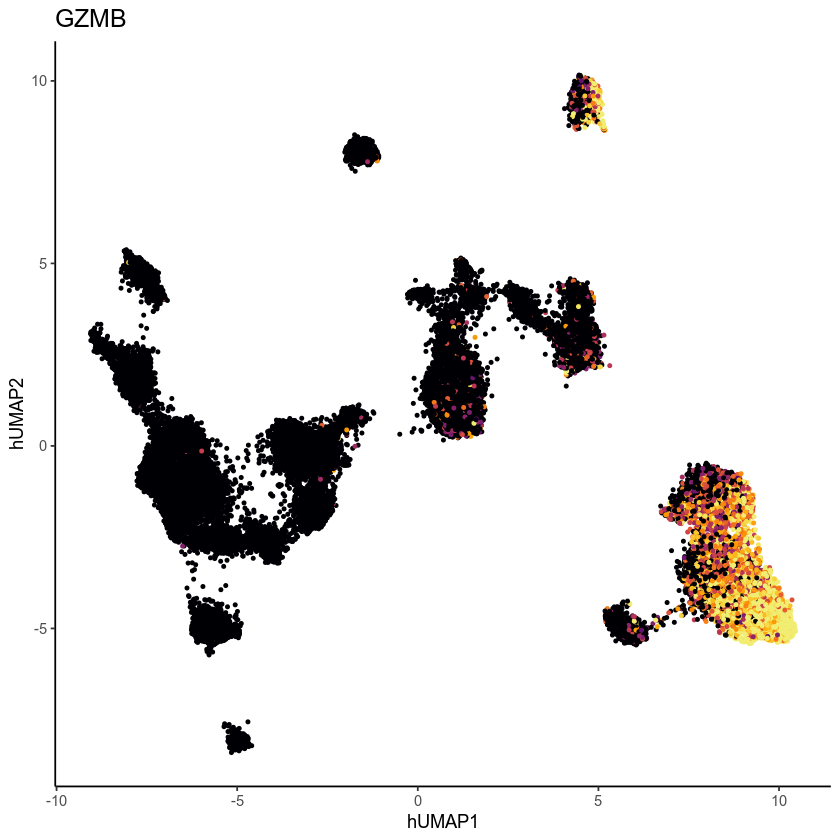

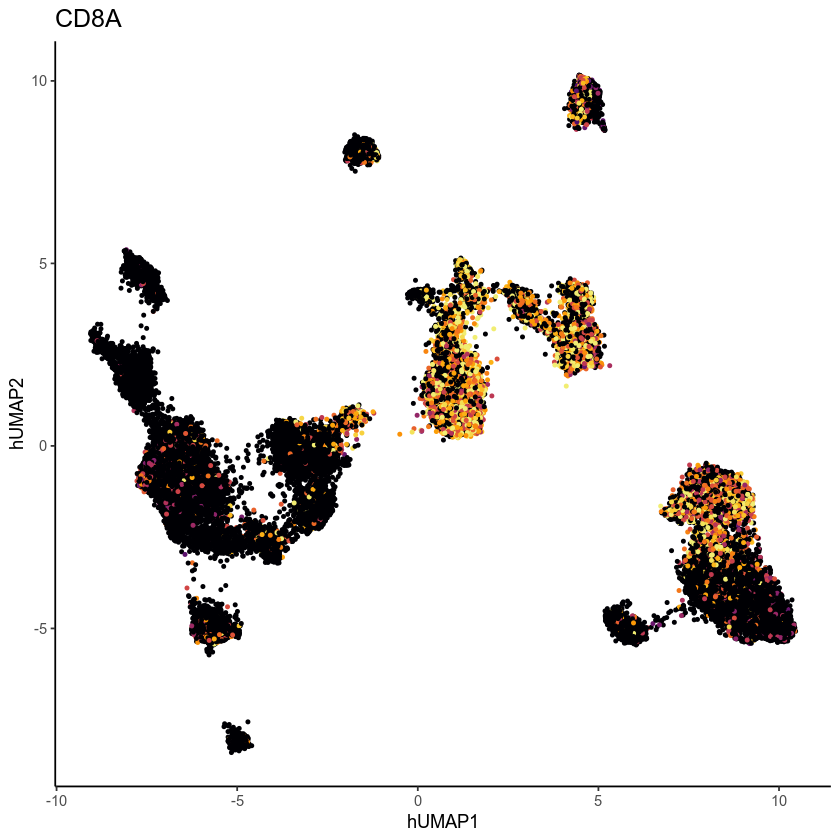

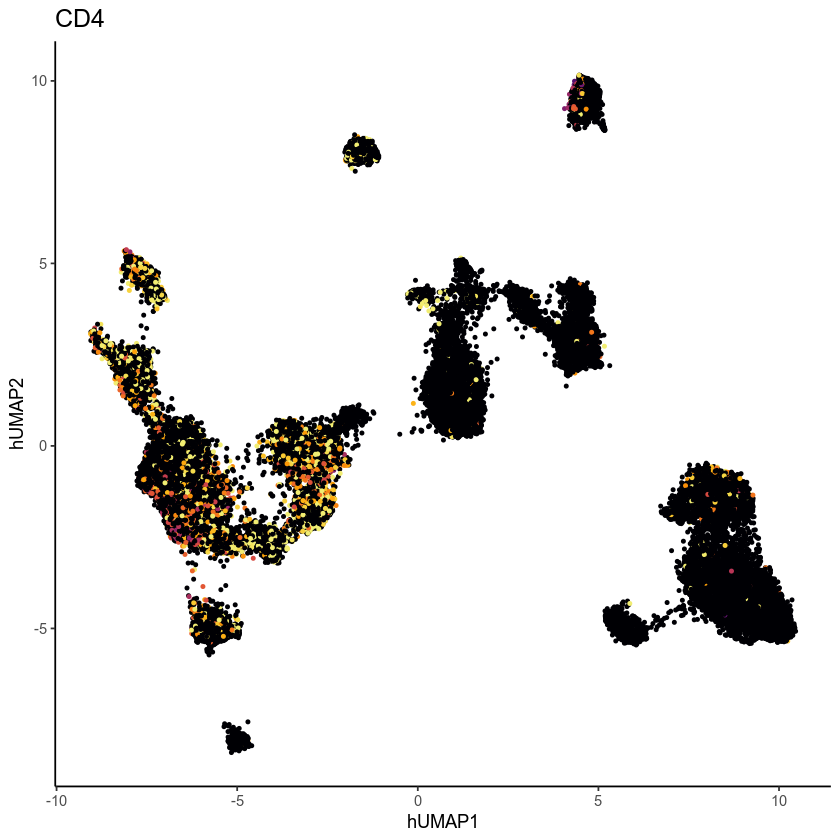

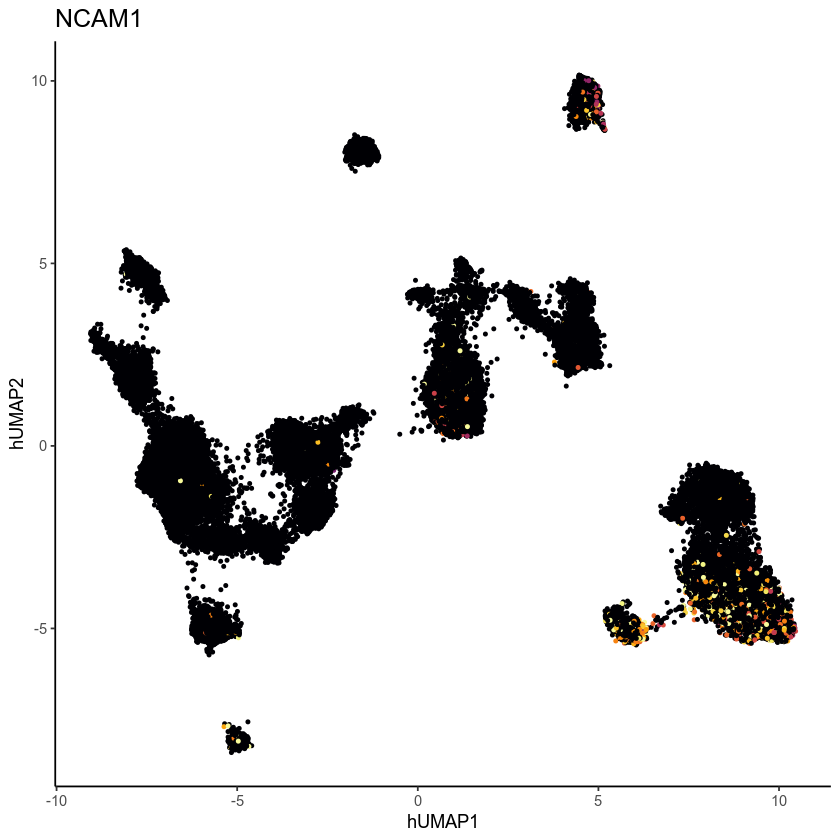

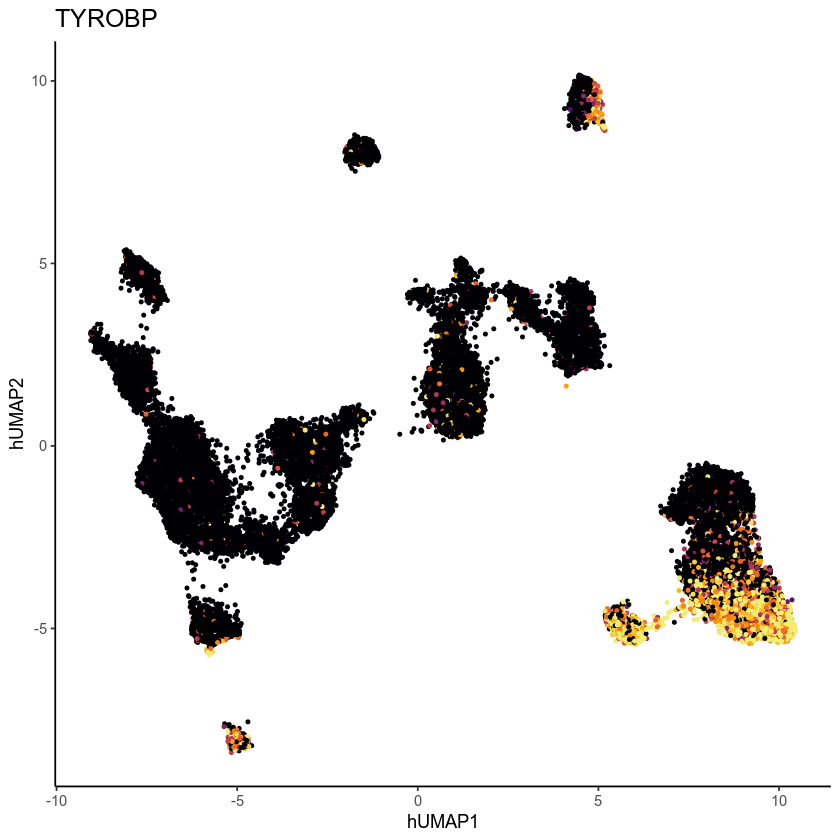

In [34]:
plot_shuffled_features('KLRB1', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95) + 
    theme_P
plot_shuffled_features('CD3D', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95)
plot_shuffled_features('GZMB', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95)
plot_shuffled_features('CD8A', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95)
plot_shuffled_features('CD4', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95)
plot_shuffled_features('NCAM1', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.99)
plot_shuffled_features('TYROBP', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95)

Warning message:
“`legend.margin` must be specified using `margin()`. For the old behavior use legend.spacing”


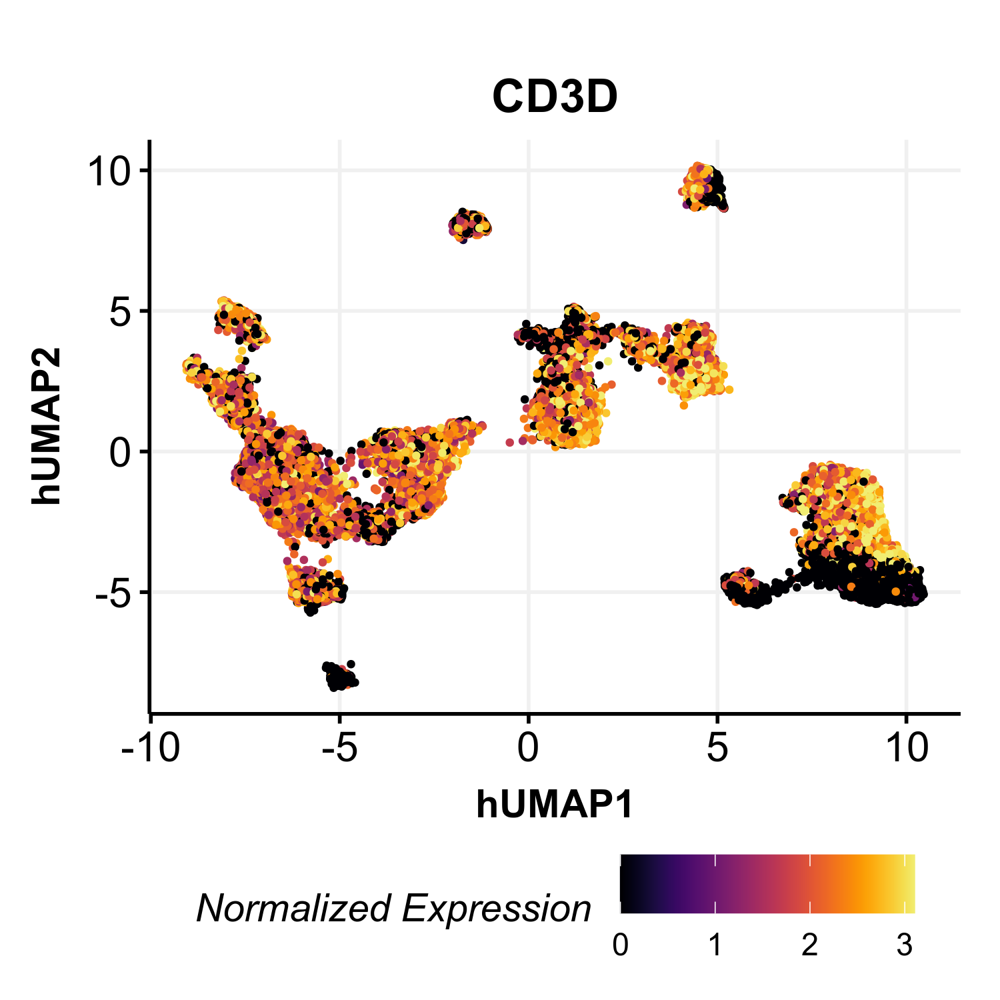

In [70]:
fig.size(5, 5)
plot_shuffled_features('CD3D', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95) +
    theme_Publication() 

In [ ]:
plot_shuffled_features('NCAM1', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.99)

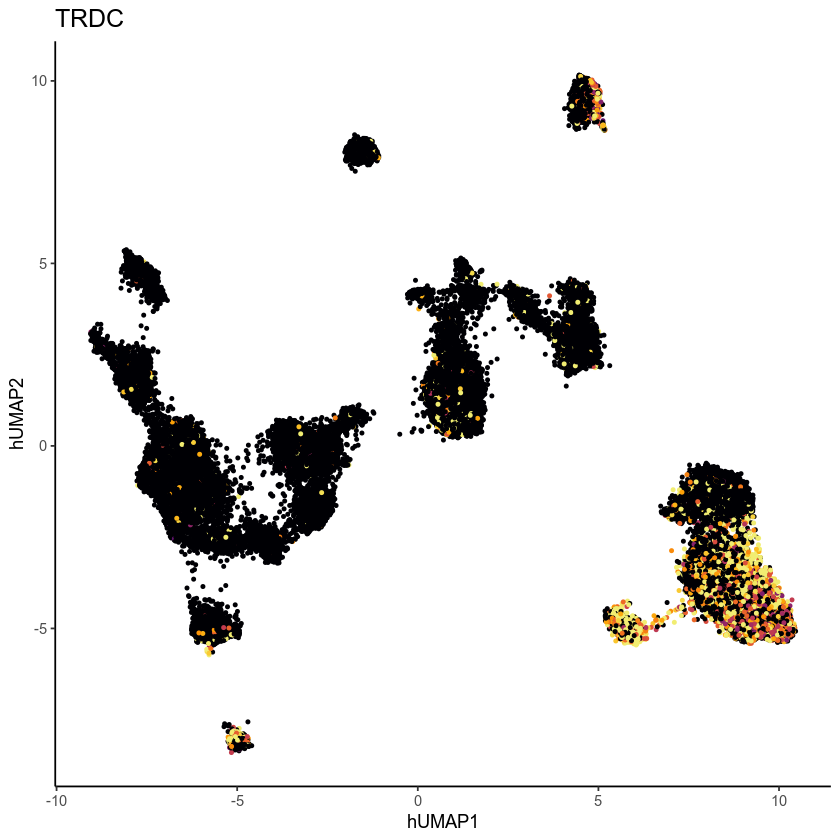

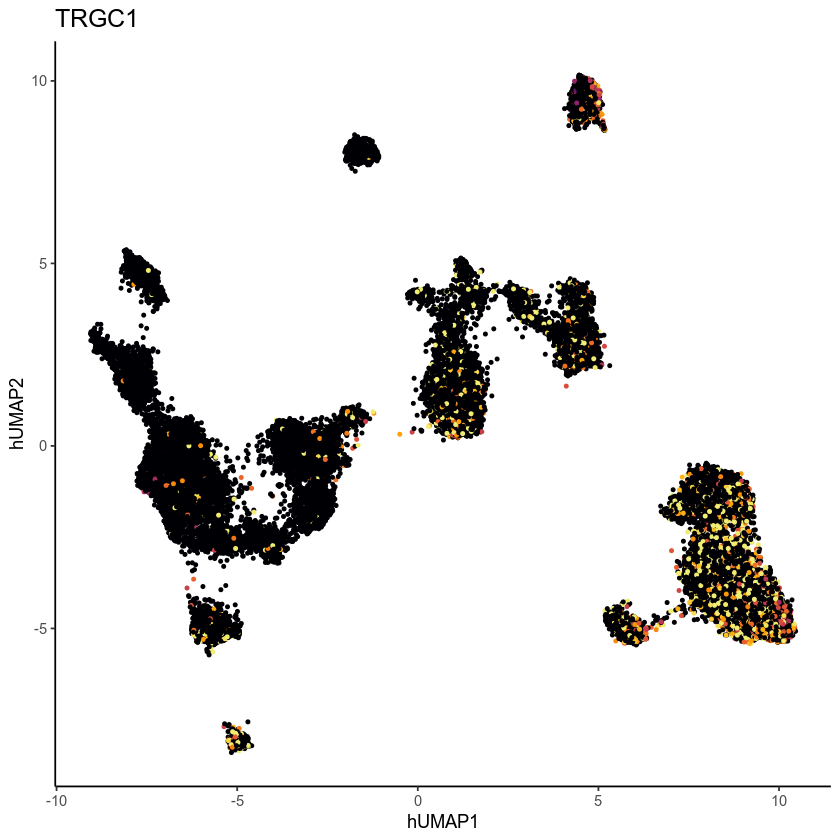

In [35]:
plot_shuffled_features('TRDC', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95)
plot_shuffled_features('TRGC1', qcd_meta %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm, 0.95)

### DE

In [355]:
pivot_wilcox_expr <- function(wilcox_obj) {
    df <- wilcox_obj %>% select(group, feature, avgExpr) %>% 
                    pivot_wider(names_from = 'feature', values_from = 'avgExpr') %>% data.frame()
    rownames(df) <- df$group
    df <- df %>% select(-group) %>% as.matrix()
    return(df)
}

pivot_wilcox_logFC <- function(wilcox_obj) {
    df <- wilcox_obj %>% select(group, feature, logFC) %>% 
                    pivot_wider(names_from = 'feature', values_from = 'logFC') %>% data.frame()
    rownames(df) <- df$group
    df <- df %>% select(-group) %>% as.matrix()
    return(df)
}

In [4]:
wilcox <- wilcoxauc(qcd_norm, qcd_meta$new_cluster_number)

In [12]:
wilcox %>% filter(group == 15) %>% arrange(desc(logFC))

feature,group,avgExpr,logFC,statistic,auc,pval,padj,pct_in,pct_out
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
IL7R,15,1.7925795,0.7364759,59709459,0.6480948,4.231885e-168,1.290760e-164,72.60274,41.72883
CD40LG,15,0.8469294,0.6467347,63278622,0.6868350,0.000000e+00,0.000000e+00,48.88454,12.40190
CD52,15,2.5743801,0.5892148,59488716,0.6456989,1.644845e-135,2.617520e-132,92.05479,77.59783
CD2,15,2.2776237,0.5887352,60044289,0.6517291,1.171861e-147,2.382849e-144,91.07632,73.78186
JUN,15,1.6986649,0.5407448,56467550,0.6129067,4.383448e-91,2.864974e-88,67.27984,51.16060
RPS29,15,4.2452090,0.4791112,62622873,0.6797174,3.805594e-203,1.989836e-199,97.18200,94.07083
KLRB1,15,1.3286878,0.4750761,54876227,0.5956342,1.394798e-77,6.898785e-75,53.26810,36.14632
TPT1,15,4.0315663,0.4750451,62217392,0.6753163,2.039220e-193,9.329685e-190,97.14286,94.19008
RPL30,15,3.9644323,0.4700310,61129674,0.6635100,1.540491e-168,5.125774e-165,96.55577,92.80901


In [358]:
sn_wilcox <- wilcoxauc(qcd_norm[, qcd_meta %>% filter(dataset == 'snRNAseq') %>% pull(cell)], 
                       qcd_meta %>% filter(dataset == 'snRNAseq') %>% pull(new_cluster_number))
sc_wilcox <- wilcoxauc(qcd_norm[, qcd_meta %>% filter(dataset == 'scRNAseq') %>% pull(cell)], 
                       qcd_meta %>% filter(dataset == 'scRNAseq') %>% pull(new_cluster_number))

In [364]:
sn_expr <- sn_wilcox %>% filter(feature %in% c('CD4', 'CD8', 'GZMK', 'GZMB', 'CD28', 'NKG7', 'NEAT1',
                                         'CD28', 'CCR7', 'ITGAE', 'IL2RA', 'FOXP3', 'RORC', 'PDCD1',
                                         'SELL', 'S1PR1', 'NCAM1', 'TYROBP', 'CD69', 'CXCR5', 'CENPF', 'MKI67')) %>% pivot_wilcox_expr() %>% data.frame()
sc_expr <- sc_wilcox %>% filter(feature %in% c('CD4', 'CD8', 'GZMK', 'GZMB', 'CD28', 'NKG7', 'NEAT1',
                                         'CD28', 'CCR7', 'ITGAE', 'IL2RA', 'FOXP3', 'RORC', 'PDCD1',
                                         'SELL', 'S1PR1', 'NCAM1', 'TYROBP', 'CD69', 'CXCR5', 'CENPF', 'MKI67')) %>% pivot_wilcox_expr() %>% data.frame()

In [372]:
sn_de <- sn_wilcox %>% filter(feature %in% c('CD4', 'CD8', 'GZMK', 'GZMB', 'CD28', 'NKG7', 'NEAT1',
                                         'CD28', 'CCR7', 'ITGAE', 'IL2RA', 'FOXP3', 'RORC', 'PDCD1',
                                         'SELL', 'S1PR1', 'NCAM1', 'TYROBP', 'CD69', 'CXCR5', 'CENPF', 'MKI67')) %>% pivot_wilcox_logFC() %>% data.frame()
sc_de <- sc_wilcox %>% filter(feature %in% c('CD4', 'CD8', 'GZMK', 'GZMB', 'CD28', 'NKG7', 'NEAT1',
                                         'CD28', 'CCR7', 'ITGAE', 'IL2RA', 'FOXP3', 'RORC', 'PDCD1',
                                         'SELL', 'S1PR1', 'NCAM1', 'TYROBP', 'CD69', 'CXCR5', 'CENPF', 'MKI67')) %>% pivot_wilcox_logFC() %>% data.frame()

In [321]:
t_de <- wilcox %>% filter(feature %in% c('CD4', 'CD8', 'GZMK', 'GZMB', 'CD28', 'NKG7', 'NEAT1',
                                         'CD28', 'CCR7', 'ITGAE', 'IL2RA', 'FOXP3', 'RORC', 'PDCD1',
                                         'SELL', 'S1PR1', 'NCAM1', 'TYROBP', 'CD69', 'CXCR5', 'CENPF', 'MKI67')) %>% pivot_wilcox_logFC() %>% data.frame()

In [402]:
t_de <- wilcox %>% filter(feature %in% c('CD4', 'CD8', 'GZMK', 'GZMB', 'CD28', 'NKG7', 'NEAT1',
                                         'CD28', 'CCR7', 'ITGAE', 'IL2RA', 'FOXP3', 'RORC', 'PDCD1',
                                         'SELL', 'S1PR1', 'NCAM1', 'TYROBP', 'CD69', 'CXCR5', 'CENPF', 'MKI67')) %>% pivot_wilcox_logFC() %>% data.frame()
t_expr <- wilcox %>% filter(feature %in% c('CD4', 'CD8', 'GZMK', 'GZMB', 'CD28', 'NKG7', 'NEAT1',
                                         'CD28', 'CCR7', 'ITGAE', 'IL2RA', 'FOXP3', 'RORC', 'PDCD1',
                                         'SELL', 'S1PR1', 'NCAM1', 'TYROBP', 'CD69', 'CXCR5', 'CENPF', 'MKI67')) %>% pivot_wilcox_expr() %>% data.frame()

In [365]:
for(i in 1:ncol(sn_expr)) {
    col_mean <- mean(sn_expr[, i])
    col_sd <- sd(sn_expr[, i])
    sn_expr[, i] <- (sn_expr[, i] - col_mean) / col_sd
}

for(i in 1:ncol(sc_expr)) {
    col_mean <- mean(sc_expr[, i])
    col_sd <- sd(sc_expr[, i])
    sc_expr[, i] <- (sc_expr[, i] - col_mean) / col_sd
}

In [403]:
for(i in 1:ncol(t_expr)) {
    col_mean <- mean(t_expr[, i])
    col_sd <- sd(t_expr[, i])
    t_expr[, i] <- (t_expr[, i] - col_mean) / col_sd
}

In [408]:
max(t_de)

[1] 2.777188

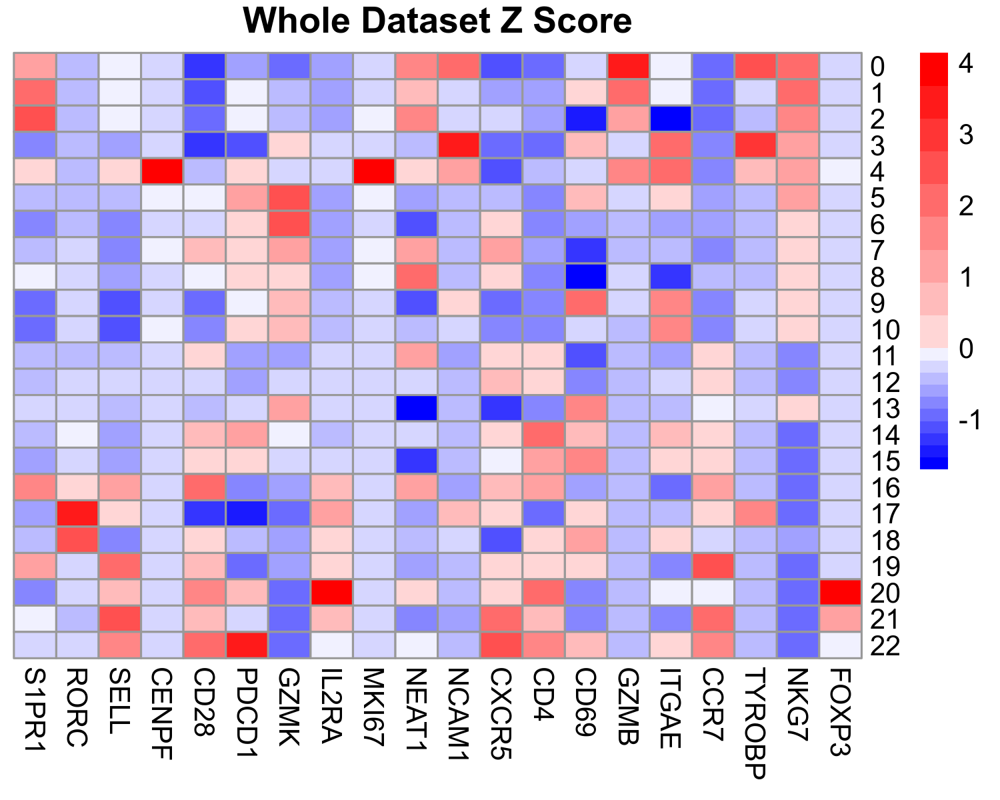

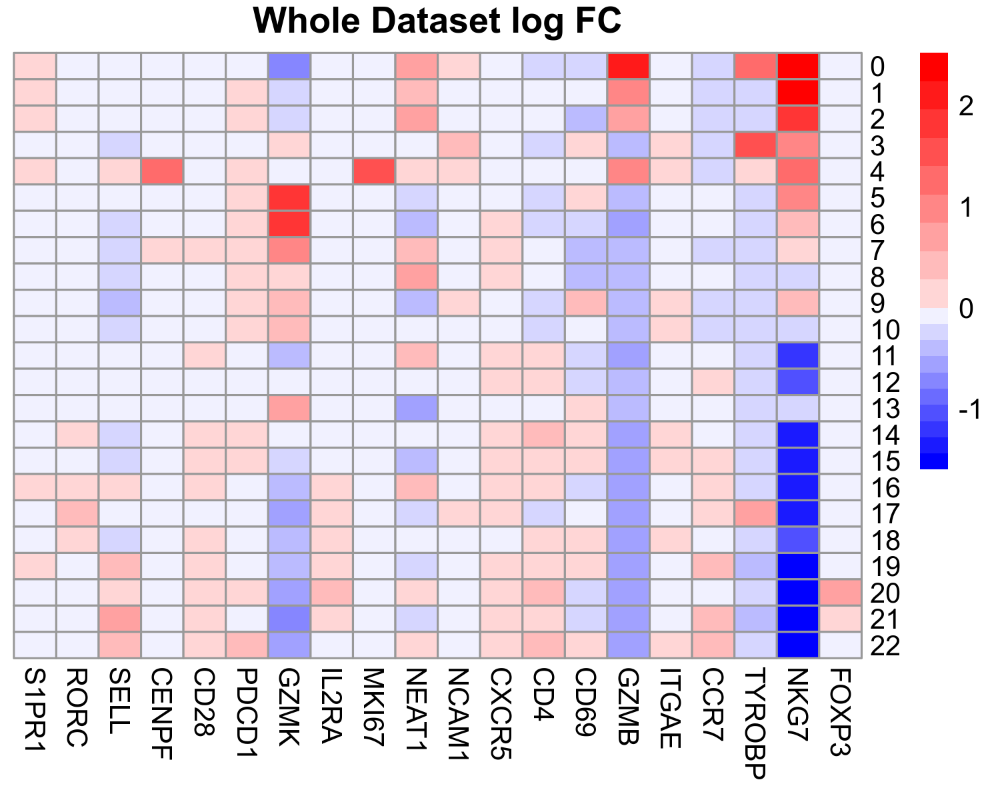

In [409]:
pheatmap(t_expr, cluster_rows = FALSE, cluster_cols = FALSE, scale_row = FALSE, scale_col = FALSE,
         color=colorRampPalette(c("blue", "white", "red"))(20), 
                         breaks = c(seq(-1.7, 0, 0.17), seq(0.001, 4.6, 0.46)),
         main = 'Whole Dataset Z Score')

pheatmap(t_de, cluster_rows = FALSE, cluster_cols = FALSE, scale_row = FALSE, scale_col = FALSE,
         color=colorRampPalette(c("blue", "white", "red"))(20), 
                         breaks = c(seq(-1.6, 0, 0.16), seq(0.001, 2.8, 0.28)),
         main = 'Whole Dataset log FC')

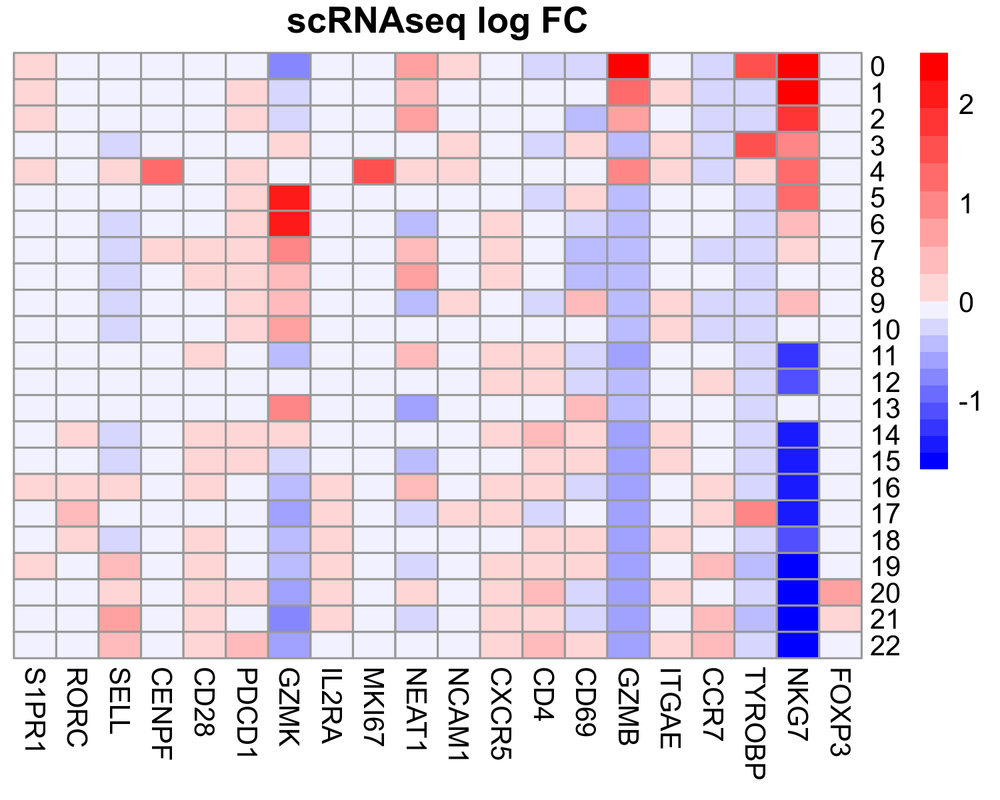

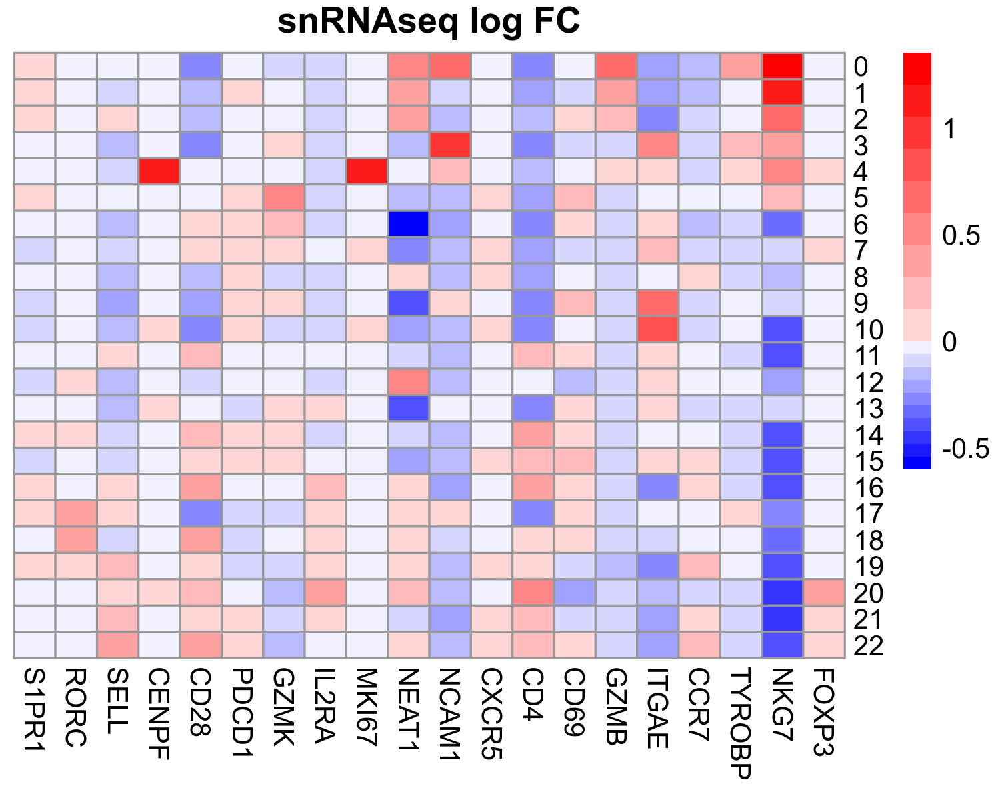

In [390]:
pheatmap(sc_de, cluster_rows = FALSE, cluster_cols = FALSE, scale_row = FALSE, scale_col = FALSE,
         color=colorRampPalette(c("blue", "white", "red"))(20), 
                         breaks = c(seq(-1.7, 0, 0.17), seq(0.001, 2.8, 0.28)),
         main = 'scRNAseq log FC')

pheatmap(sn_de, cluster_rows = FALSE, cluster_cols = FALSE, scale_row = FALSE, scale_col = FALSE,
         color=colorRampPalette(c("blue", "white", "red"))(20), 
                         breaks = c(seq(-0.6, 0, 0.06), seq(0.001, 1.5, 0.15)),
         main = 'snRNAseq log FC')

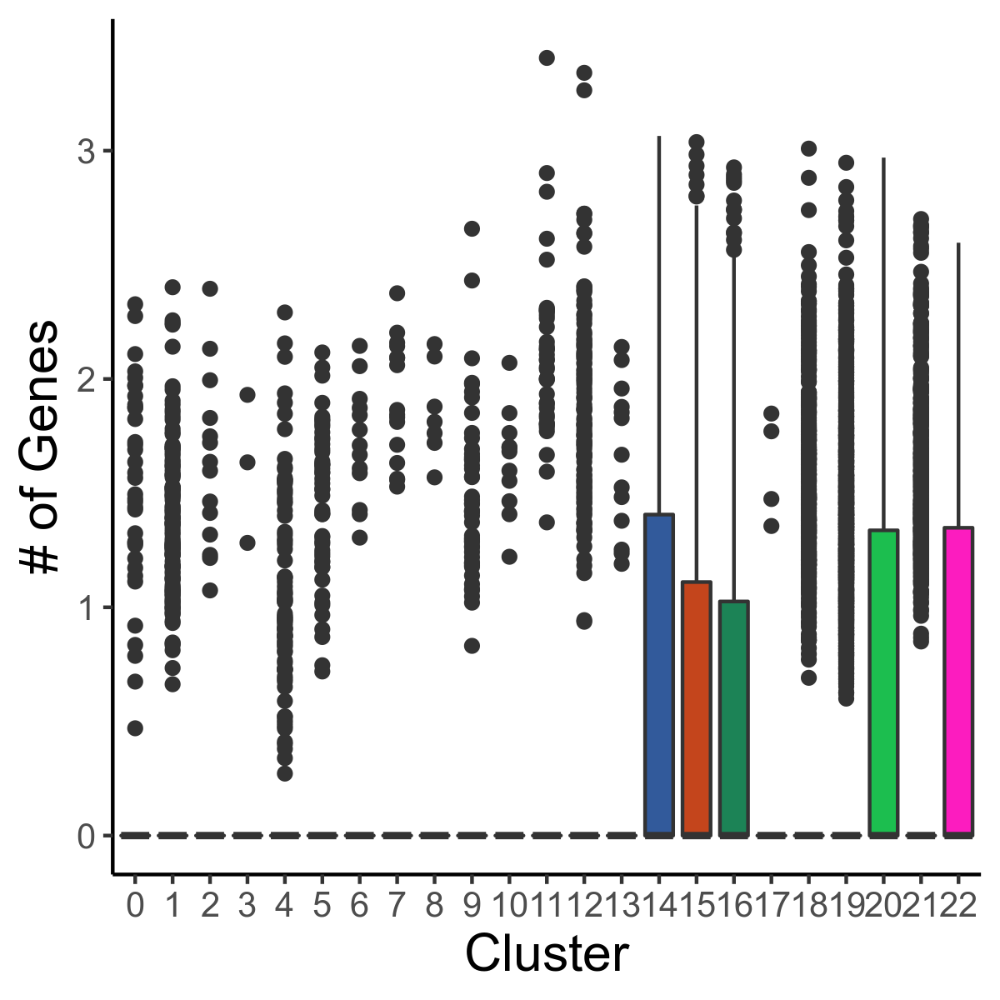

In [218]:
ggplot(cbind(qcd_meta, CD4 = qcd_norm['CD4', ]), aes(x = as.factor(new_cluster_number), 
                                                                             y = CD4, 
                                                                             fill = as.factor(new_cluster_number))) +
    geom_boxplot() +
    theme_classic() + 
    theme(plot.title = element_text(size = 20), 
          axis.text = element_text(size = 10), 
          axis.title = element_text(size = 15),
          legend.position = 'none') + 
    labs(x = 'Cluster', y = '# of Genes') + 
    scale_fill_manual(values = as.vector(polychrome(23)))

In [40]:
ggplot(qcd_meta, aes(x = as.factor(new_cluster_number), 
                                                                             y = nFeature_RNA, 
                                                                             fill = as.factor(new_cluster_number))) +
    geom_boxplot() +
    theme_classic() + 
    theme(plot.title = element_text(size = 20), 
          axis.text = element_text(size = 10), 
          axis.title = element_text(size = 15),
          legend.position = 'none') + 
    labs(x = 'Cluster', y = '# of Genes') + 
    scale_fill_manual(values = as.vector(polychrome(23)))
ggplot(qcd_meta, aes(x = as.factor(new_cluster_number), 
                                                                             y = nCount_RNA, 
                                                                             fill = as.factor(new_cluster_number))) +
    geom_boxplot() +
    theme_classic() + 
    theme(plot.title = element_text(size = 20), 
          axis.text = element_text(size = 10), 
          axis.title = element_text(size = 15),
          legend.position = 'none') + 
    labs(x = 'Cluster', y = '# of UMIs') + 
    scale_fill_manual(values = as.vector(polychrome(23)))

ERROR: Error in parse(text = x, srcfile = src): <text>:12:1: unexpected symbol
11:     scale_fill_manual(values = as.vector(polychrome(23)))
12: ggplot
    ^


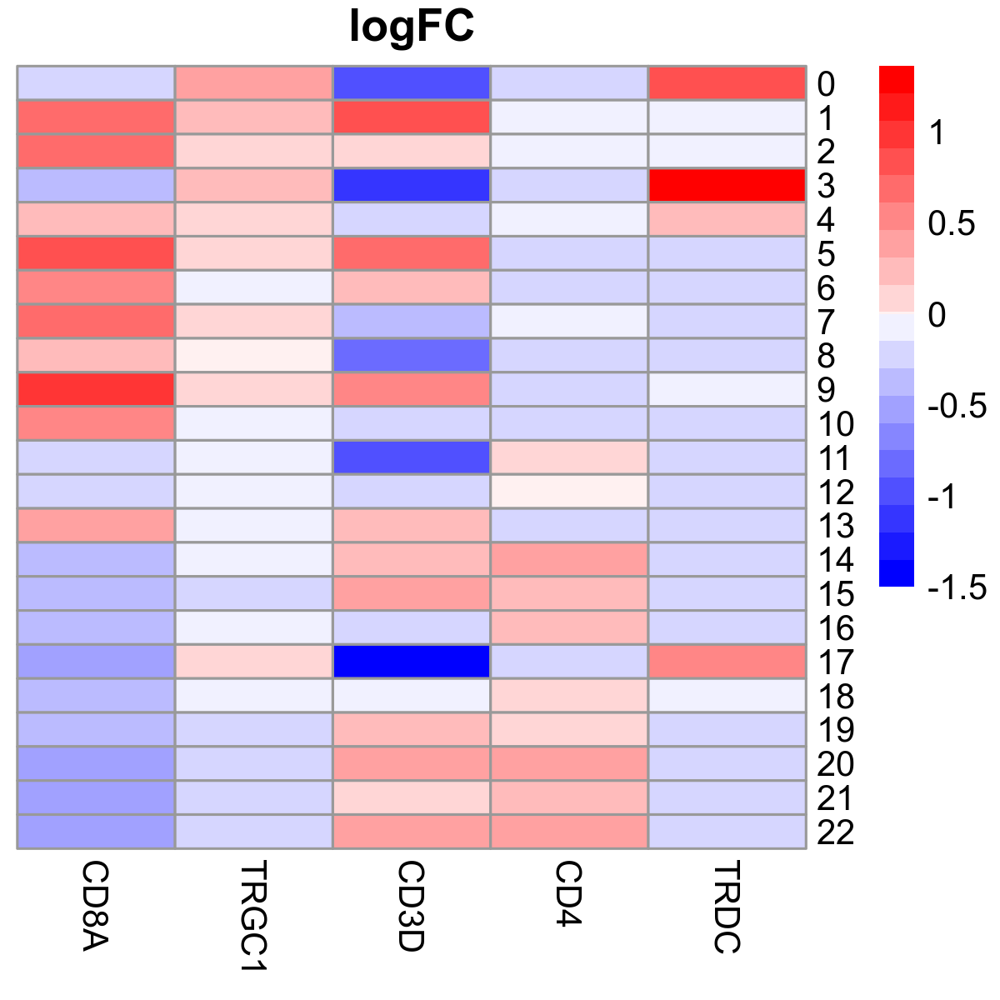

In [409]:
fig.size(4, 4)
pheatmap(t_de, scale = 'none', cluster_rows = FALSE, cluster_cols = FALSE,
         fontsize_row = 10, fontsize_col= 10, main = 'logFC',
         color=colorRampPalette(c("blue", "white", "red"))(20), 
         breaks = c(seq(-1.5, 0, 0.15), seq(0.01, 1.5, 0.15)))

In [408]:
max(t_de)

[1] 1.461836

### CLUSTER NK AND CTL SEPARATELY?

In [40]:
nk_ctl <- qcd_meta %>% filter(annotation %in% c('0.CD56lo NK', '1. CTL', '3. CD56bright NK', '2. SYNEhi CTL'))

In [37]:
snn_ref <- BuildSNNSeurat(nk_ctl[,paste0('hPC', 1:20)], nn.eps = 0)


resolution_list <- c(0.2, 0.4, 0.6, 0.8, 1.0)
ids_ref <- Reduce(cbind, mclapply(resolution_list, function(res_use) {
    Seurat:::RunModularityClustering(SNN = snn_ref, modularity = 1,
        resolution = res_use, algorithm = 1, n.start = 20,
        n.iter = 20, random.seed = 100, print.output = FALSE,
        temp.file.location = NULL, edge.file.name = NULL)
}, mc.preschedule = FALSE, mc.cores = min(20, length(resolution_list)))) 

In [41]:
nk_ctl <- cbind(nk_ctl, ids_ref)

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


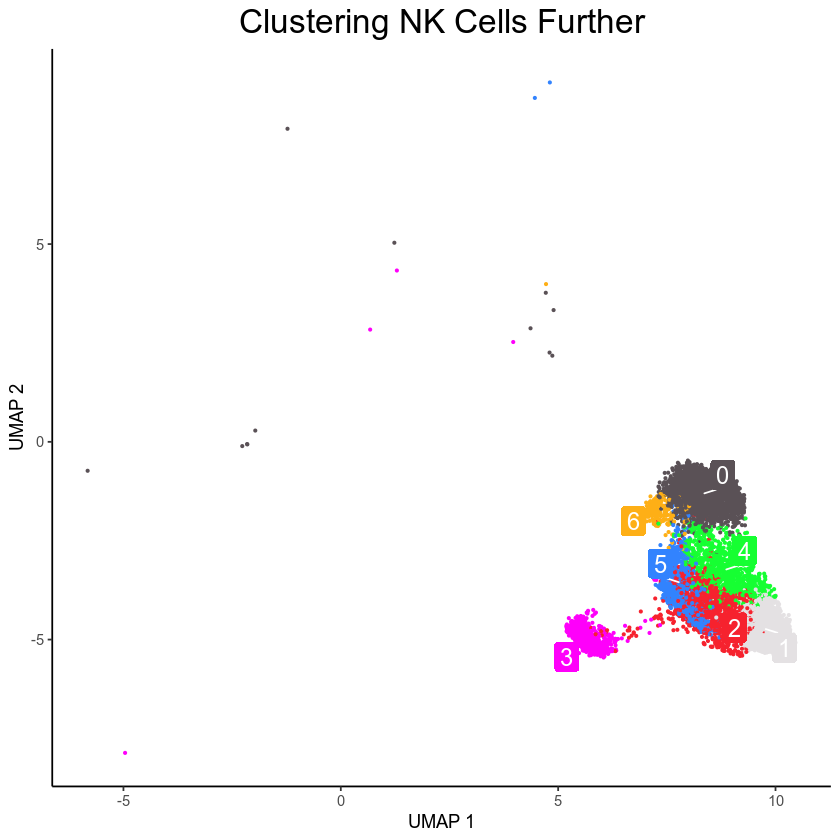

In [49]:
plot_clusters3(nk_ctl$V5, nk_ctl$V5, umap_use = nk_ctl %>% select(hUMAP1, hUMAP2), 
               do_labels = TRUE) +
    scale_color_manual(values = as.vector(polychrome(28))) +
    scale_fill_manual(values = as.vector(polychrome(28))) + 
    labs(title = 'Clustering NK Cells Further') +
    theme(plot.title = element_text(size = 20))

In [50]:
wilcox <- wilcoxauc(qcd_norm[, nk_ctl$cell], nk_ctl$V5)

In [53]:
wilcox %>% filter(feature %in% c('TRDC', 'CD3D', 'TYROBP', 'GZMB'))

feature,group,avgExpr,logFC,statistic,auc,pval,padj,pct_in,pct_out
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CD3D,0,2.34087247,1.5837432,13200706.5,0.8200362,0.000000e+00,0.000000e+00,93.355621,30.83098
TRDC,0,0.21627228,-0.8927609,4733616.5,0.2940553,3.458764e-251,9.738016e-248,8.859173,51.06288
GZMB,0,1.51729987,-0.4239160,6441415.5,0.4001448,1.657974e-49,3.409186e-47,65.691601,67.93519
TYROBP,0,0.10146527,-1.3709702,3272087.5,0.2032641,0.000000e+00,0.000000e+00,5.850397,63.14851
CD3D,1,0.27464842,-1.1045344,3521514.5,0.2785441,5.989911e-210,1.289628e-206,10.909091,55.59002
TRDC,1,1.07398274,0.2450057,7199405.0,0.5694572,4.614546e-24,2.852990e-22,58.123167,35.81929
GZMB,1,3.19102767,1.6740007,10737893.5,0.8493439,0.000000e+00,0.000000e+00,98.240469,60.24275
TYROBP,1,2.15178839,1.2780081,9848697.5,0.7790104,0.000000e+00,0.000000e+00,90.439883,38.38166
CD3D,2,0.44565674,-0.8834813,3898324.5,0.3216287,2.365593e-131,8.658309e-127,18.513932,53.41772


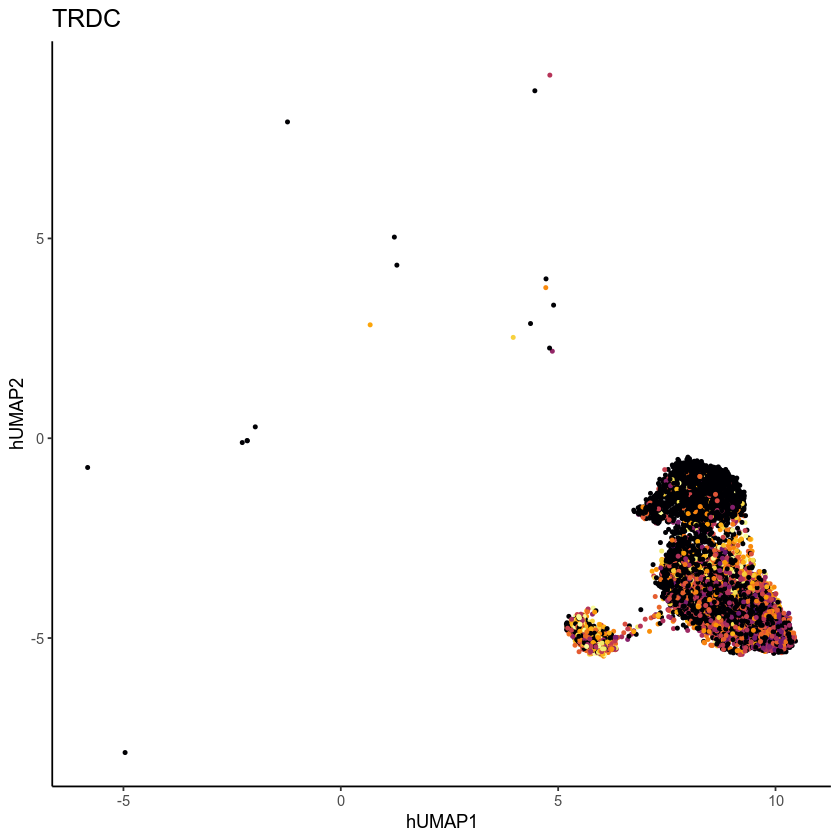

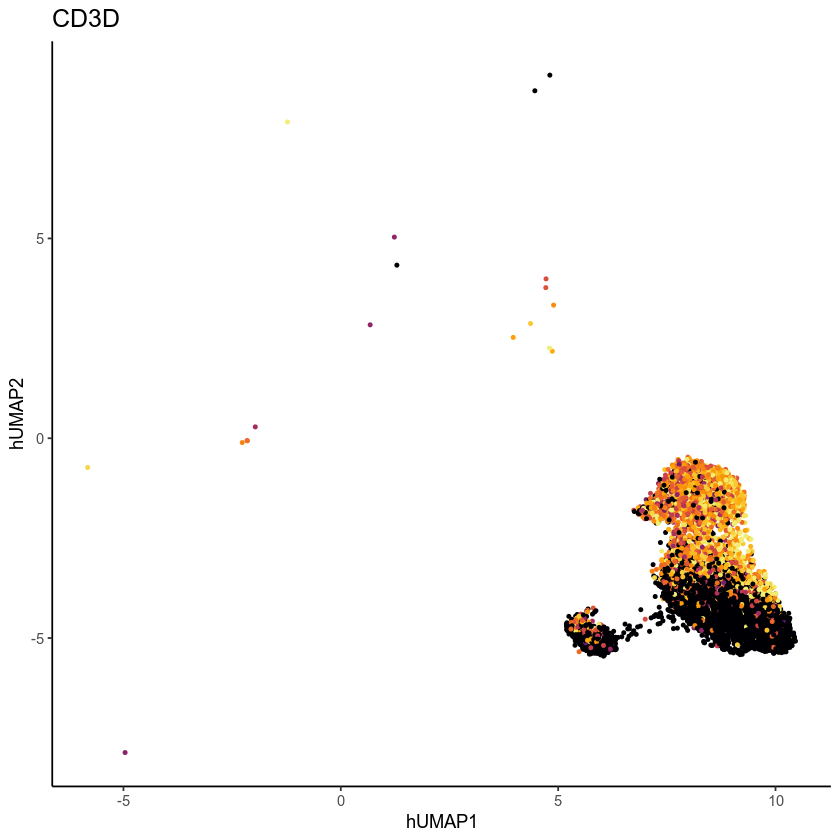

In [48]:
plot_shuffled_features('TRDC', nk_ctl %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm[, nk_ctl$cell], 0.99)
plot_shuffled_features('CD3D', nk_ctl %>% select(hUMAP1, hUMAP2) %>% rename(V1 = hUMAP1, V2 = hUMAP2), 
                       qcd_norm[, nk_ctl$cell], 0.95)

### Final Annotation

In [85]:
rawcounts <- readRDS('/data/srlab2/qxiao/AMP-SLE/sc_nuc_data/2022-08-09_ScNuc_cell_QCed_RawCounts.rds')
mito_genes_subset <- c("MT-ND5", "MT-ND6")
percent_mito <- colSums(rawcounts[mito_genes_subset, ]) / colSums(rawcounts) * 100
percent_mito <- data.frame(cell = names(percent_mito), percent.mt = percent_mito)

In [198]:
clusters <- c('0.CD56lo NK', '1. CTL', '2. SYNEhi CTL', '3. CD56bright NK', '4. Proliferating', '5. GZMK+ CD8+ NKG7lo',
              '6. GZMK+ CD8 NKG7hi', '7. GZMK+ CD8+ CD28+ CCR7- SELL-', '8. GZMK+ CD8+ NEAT1+', '9. GZMK+ CD8+ CD69+ ITGAE+ S1P1-', 
              '10. GZMK+ CD8+ ITGAE+', '11. CD4+ CD28+ CCR7- SELL-', '12. CD4?', '13. GZMK+ CD8+ CD69+', 
              '14. CD4+ CD69+ ITGAE+ S1P1- JUNhi', '15. CD4+ CD69+ ITGAE+ S1P1- JUNlo', 
              '16. CD4+ CD28+ SELL+ CCR7+', '17. ILCs', '18. CD4+ RORC+ KLRB1+ CCR6+', '19. CD4+ CCR7+ CD28+ SELL+ Ribohi',
              '20. CD4+ IL2RA++ FOXP3++', '21. CD4+ SELL+ CD28+ CCR7+ IL2RA+ FOXP3+', '22. CD4+ PDCD1+ CXCR5+')
annotations <- data.frame(new_cluster_number = seq(0, 22), annotation = clusters)

In [52]:
qcd_meta <- left_join(qcd_meta %>% select(- annotation), annotations)

Joining, by = "new_cluster_number"


Joining, by = "cell"
Joining, by = "cell"


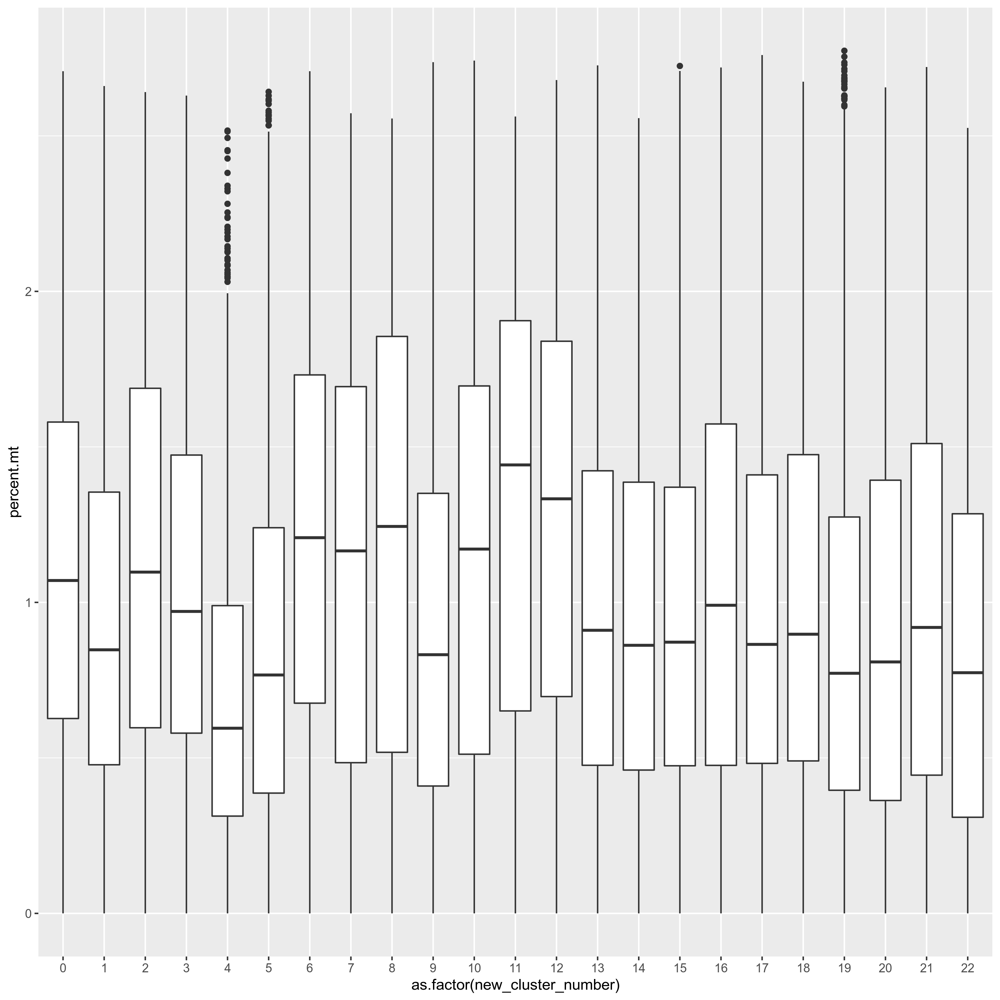

Joining, by = "cell"


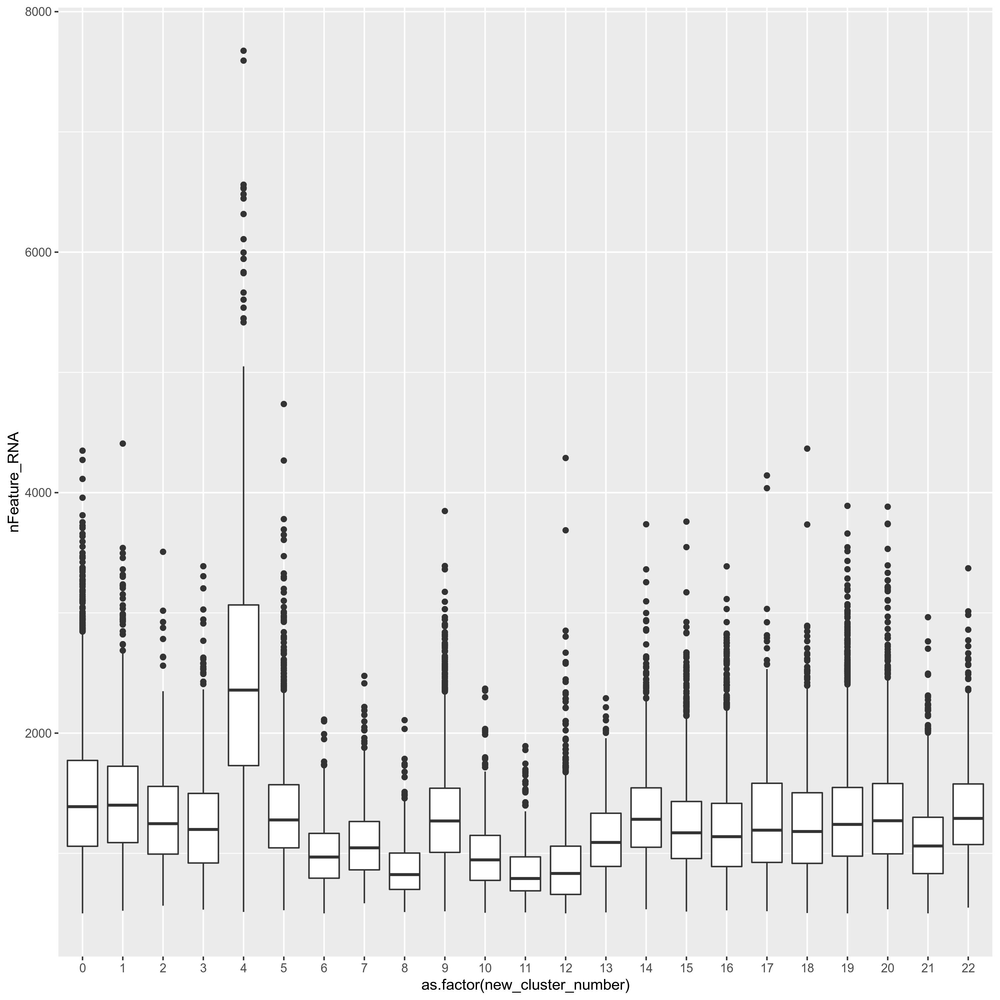

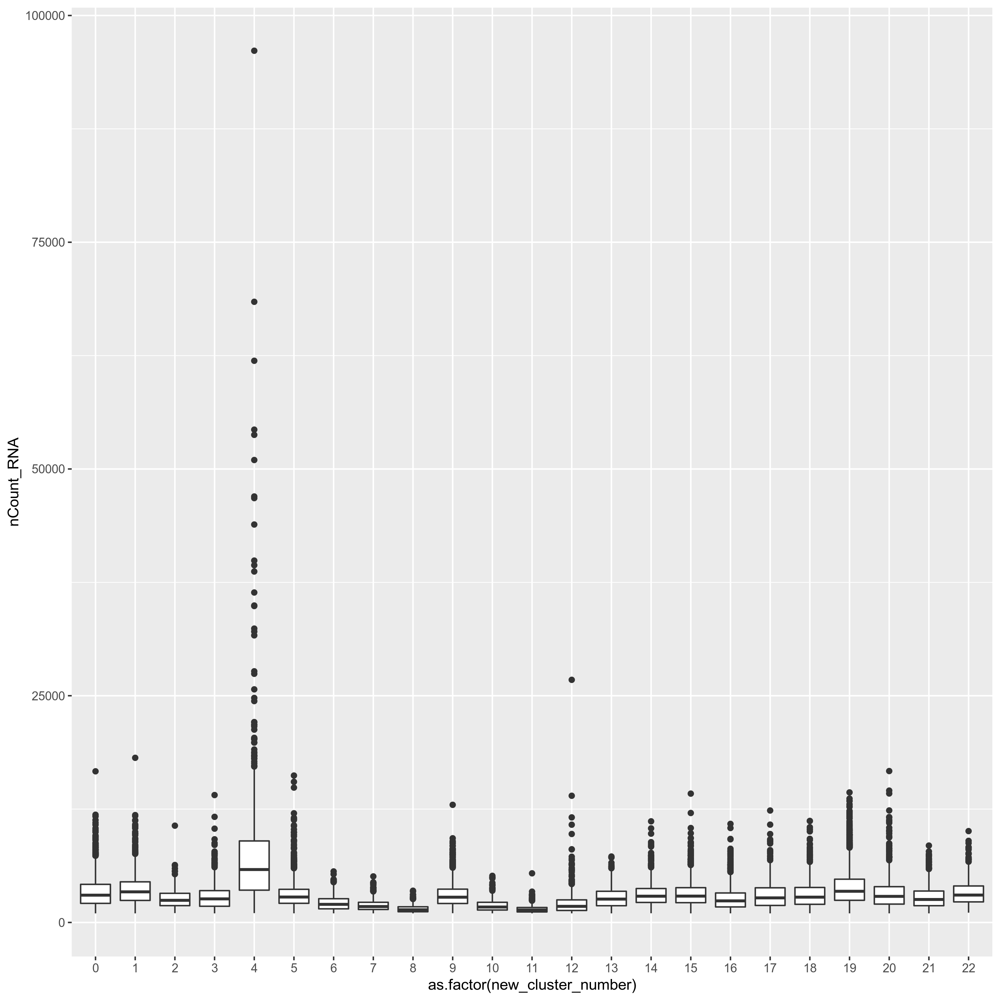

In [91]:
ggplot(qcd_meta %>% left_join(percent_mito), aes(x = as.factor(new_cluster_number), y = percent.mt)) + 
    geom_boxplot()
ggplot(qcd_meta %>% left_join(percent_mito), aes(x = as.factor(new_cluster_number), y = nFeature_RNA)) + 
    geom_boxplot()
ggplot(qcd_meta %>% left_join(percent_mito), aes(x = as.factor(new_cluster_number), y = nCount_RNA)) + 
    geom_boxplot()

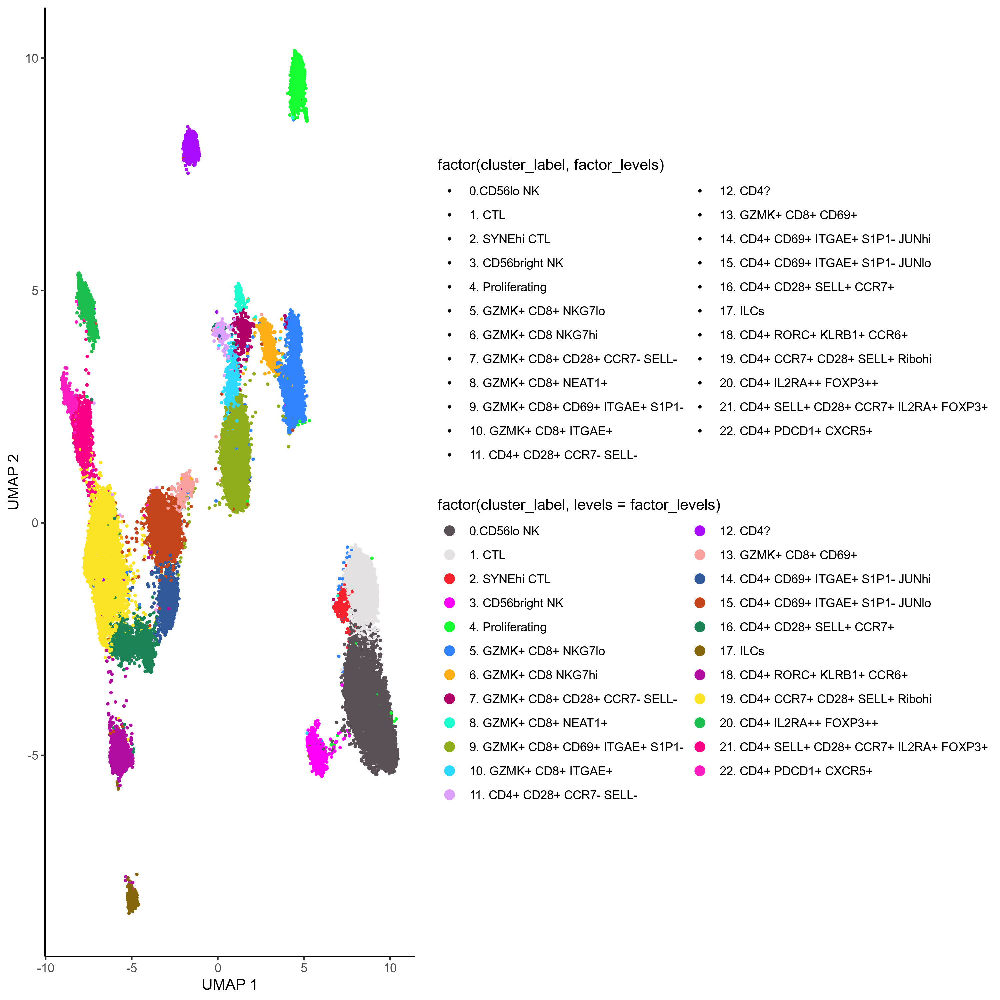

In [84]:
fig.size(10, 10)
plot_clusters3(qcd_meta$new_cluster_number, qcd_meta$annotation, umap_use = qcd_meta %>% select(hUMAP1, hUMAP2), 
               do_labels = FALSE) +
    scale_color_manual(values = as.vector(polychrome(26))) +
    scale_fill_manual(values = as.vector(polychrome(26))) 

In [53]:
arnon_vs_sid <- qcd_meta %>% filter(dataset == 'scRNAseq') %>% select(annotation, arnon_annotations) %>% na.omit() %>% 
                                            group_by(annotation, arnon_annotations) %>% tally()

In [45]:
arnon_vs_sid <- qcd_meta %>% select(hres1.6, arnon_annotations) %>% rename(annotation = hres1.6) %>% na.omit() %>% group_by(annotation, arnon_annotations) %>% tally()

In [46]:
arnon_vs_sid$annotation %>% unique()

[1]  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
[26] 25 26

In [54]:
df <- ungroup(arnon_vs_sid)
statistic <- vector()
for (i in 1:nrow(df)) {
        inAandB <- df %>% filter(annotation == arnon_vs_sid$annotation[i], 
                                           arnon_annotations == arnon_vs_sid$arnon_annotations[i]) %>% pull(n) %>% sum()
        inAnotB <- df %>% filter(annotation == arnon_vs_sid$annotation[i], 
                                           arnon_annotations != arnon_vs_sid$arnon_annotations[i]) %>% pull(n) %>% sum()
        inBnotA <- df %>% filter(annotation != arnon_vs_sid$annotation[i], 
                                           arnon_annotations == arnon_vs_sid$arnon_annotations[i]) %>% pull(n) %>% sum()
        notBnotA <- df %>% filter(annotation != arnon_vs_sid$annotation[i], 
                                            arnon_annotations != arnon_vs_sid$arnon_annotations[i]) %>% pull(n) %>% sum()
        contin <- data.frame(c(inAandB, inAnotB), c(inBnotA, notBnotA))
        or <- (contin[1, 1] * contin[2, 2]) / (contin[1, 2] * contin[2, 1])
        statistic <- c(statistic, sign(log(or)) * sqrt(chisq.test(contin, simulate.p.value = TRUE)$statistic))        
}

In [55]:
df$stat <- statistic

In [56]:
or_plot <- df %>% select(-n) %>% pivot_wider(names_from = 'annotation', values_from = 'stat') 
cols <- colnames(or_plot)
or_plot[is.na(or_plot)] <- 0 
or_plot <- or_plot %>% data.frame()
rownames(or_plot) <- or_plot$arnon_annot
colnames(or_plot) <- cols
or_plot <- or_plot[, -1]

In [378]:
library(dendsort)
sort_hclust <- function(...) as.hclust(dendsort(as.dendrogram(...)))

mat_cluster_cols <- hclust(dist(t(or_plot)))

mat_cluster_cols <- sort_hclust(mat_cluster_cols)

In [38]:
library(dendsort)
sort_hclust <- function(...) as.hclust(dendsort(as.dendrogram(...)))

mat_cluster_rows <- hclust(dist(or_plot))

mat_cluster_rows <- sort_hclust(mat_cluster_rows)

In [62]:
colnames(or_plot)[-which(colnames(or_plot) %in% col.order)]

[1] "18. CD4+ RORC+ KLRB1+ CCR6+" "4. Proliferating"

In [66]:
col.order <- c('13. GZMK+ CD8+ CD69+', '6. GZMK+ CD8 NKG7hi', '5. GZMK+ CD8+ NKG7lo', '3. CD56bright NK',
               '2. SYNEhi CTL', '16. CD4+ CD28+ SELL+ CCR7+', '19. CD4+ CCR7+ CD28+ SELL+ Ribohi','14. CD4+ CD69+ ITGAE+ S1P1- JUNhi',
               '15. CD4+ CD69+ ITGAE+ S1P1- JUNlo', '12. CD4?', '11. CD4+ CD28+ CCR7- SELL-', '10. GZMK+ CD8+ ITGAE+',
               '7. GZMK+ CD8+ CD28+ CCR7- SELL-', '8. GZMK+ CD8+ NEAT1+', '22. CD4+ PDCD1+ CXCR5+', '21. CD4+ SELL+ CD28+ CCR7+ IL2RA+ FOXP3+', 
               '18. CD4+ RORC+ KLRB1+ CCR6+','20. CD4+ IL2RA++ FOXP3++', '9. GZMK+ CD8+ CD69+ ITGAE+ S1P1-', '1. CTL', '17. ILCs', '0.CD56lo NK', '4. Proliferating')

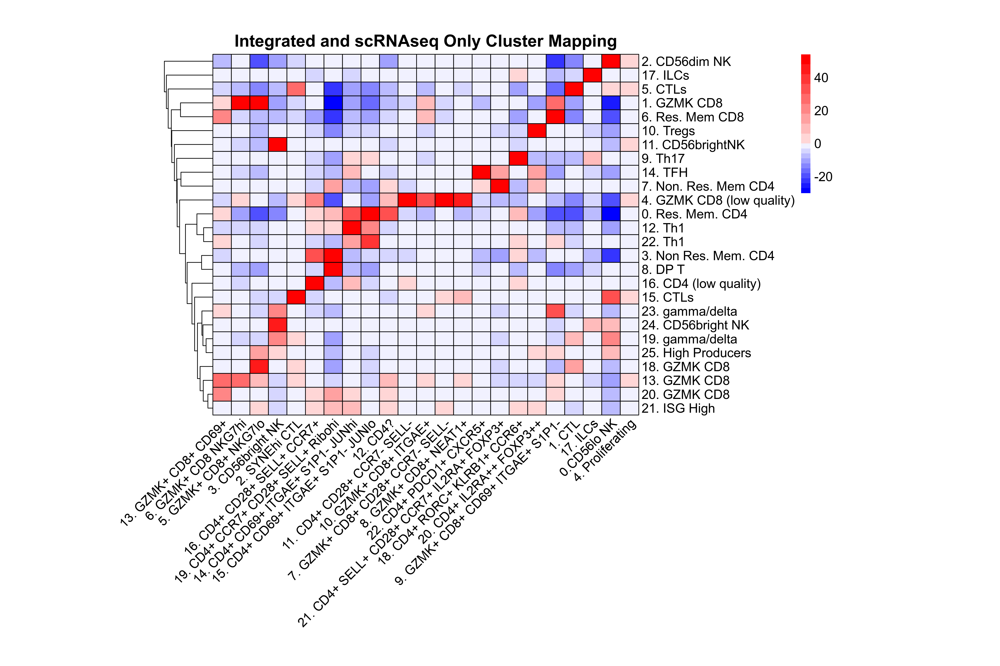

In [69]:
fig.size(10, 15)
pheatmap::pheatmap(or_plot[, col.order], cellwidth = 20, cellheight = 15, 
                   color=colorRampPalette(c("blue", "white", "red"))(20), 
                   breaks = c(seq(-30, 0, 3), seq(0.001, 60, 6)), 
                   border_color = 'black', scale = 'none',
                   cluster_rows = TRUE, cluster_cols = FALSE, main = 'Integrated and scRNAseq Only Cluster Mapping', fontsize = 14, angle_col = 45)

In [110]:
saveRDS(qcd_meta, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_meta_harmonizedPCUMAPclusters_annotations09212022.rds')

In [5]:
qcd_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_meta_harmonizedPCUMAPclusters_annotations09212022.rds')
qcd_norm <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_norm_09092022.rds')

In [4]:
wilcox <- wilcoxauc(qcd_norm, qcd_meta$annotation)

In [6]:
saveRDS(wilcox %>% filter(padj < 0.05), '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/t_nk_cluster_de_wilcoxauc_pad0.05.rds')

In [7]:
top_bottom_100 <- rbind(wilcox %>% filter(padj < 0.05) %>% group_by(group) %>% arrange(desc(logFC)) %>% slice(1:100),
                       wilcox %>% filter(padj < 0.05) %>% group_by(group) %>% arrange(logFC) %>% slice(1:100))

In [8]:
saveRDS(top_bottom_100, '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/t_nk_cluster_de_wilcoxauc_pad0.05_topbottom100.rds')

## Symphony

In [3]:
qcd_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_meta_harmonizedPCUMAPclusters_annotations09212022.rds')
qcd_norm <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_norm_09092022.rds')

In [3]:
library(symphony)


Attaching package: ‘symphony’


The following objects are masked from ‘package:singlecellmethods’:

    findVariableGenes, rowSDs, scaleDataWithStats, vargenes_vst




In [1]:
ref <- readRDS("/data/srlab1/public/srcollab/AMP_Phase_2/singlecell_result/T_reference_2020-11-25.rds")
ref$save_uwot_path <- '/data/srlab1/public/srcollab/AMP_Phase_2/singlecell_result/T_uwot_model_2020-11-25'

In [2]:
summary(ref)

               Length  Class      Mode     
meta_data           13 data.frame list     
vargenes             3 tbl_df     list     
loadings        103580 -none-     numeric  
R              9405600 -none-     numeric  
Z_orig         1881120 -none-     numeric  
Z_corr         1881120 -none-     numeric  
betas           164000 -none-     numeric  
centroids         2000 -none-     numeric  
cache                2 -none-     list     
umap                 1 -none-     list     
save_uwot_path       1 -none-     character

In [3]:
ref$save_uwot_path

[1] "/data/srlab2/anathan/AMP/data/2020.11.25_Phase2RA_Tcells_cca_400_raw_postHarmony_Tfilter2_refumap.rds"

In [5]:
remove_cells <-which(is.na(ref$meta_data[, 'cluster_name']))

In [6]:
ref$meta_data[remove_cells, 'cluster_name'] = 'NaN'

In [96]:
query = mapQuery(qcd_norm[, qcd_meta %>% filter(dataset == 'scRNAseq', new_cluster_number != 0, new_cluster_number != 3) %>% pull(cell)], # query gene expression (genes x cells)
                    qcd_meta %>% filter(dataset == 'scRNAseq', new_cluster_number != 0, new_cluster_number != 3),        # query metadata (cells x attributes)
                    ref, # Symphony reference object
                    do_normalize = FALSE,  # perform log(CP10k) normalization on query
                    vars = c("sample", "processing.batch"),
                    do_umap = TRUE)        # project query cells into reference UMAP

Scaling and synchronizing query gene expression

Found 5061 out of 5179 reference variable genes in query dataset

Project query cells using reference gene loadings

Clustering query cells to reference centroids

Correcting query batch effects

UMAP

All done!



In [97]:
query = knnPredict(query, ref, ref$meta_data[ ,"cluster_name"], k = 5, confidence=TRUE)

In [457]:
saveRDS(query$meta_data, '/data/srlab/ssg34/SLE_kidney_v2/data/t_new_symphony_res.rds')

In [98]:
plot_df <- query$meta_data
plot_df <- cbind(plot_df, data.frame(query$umap))
plot_df <- plot_df %>% filter(cell_type_pred_knn_prob > 0.6) 

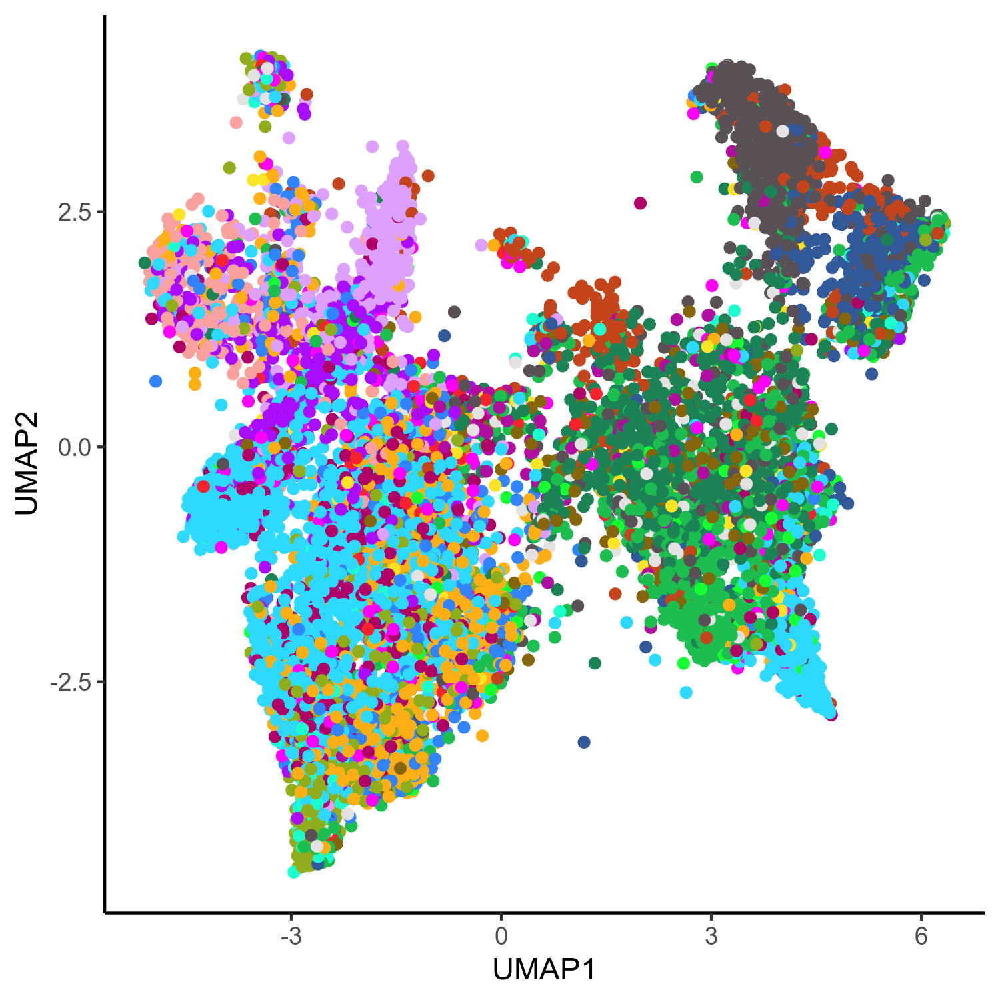

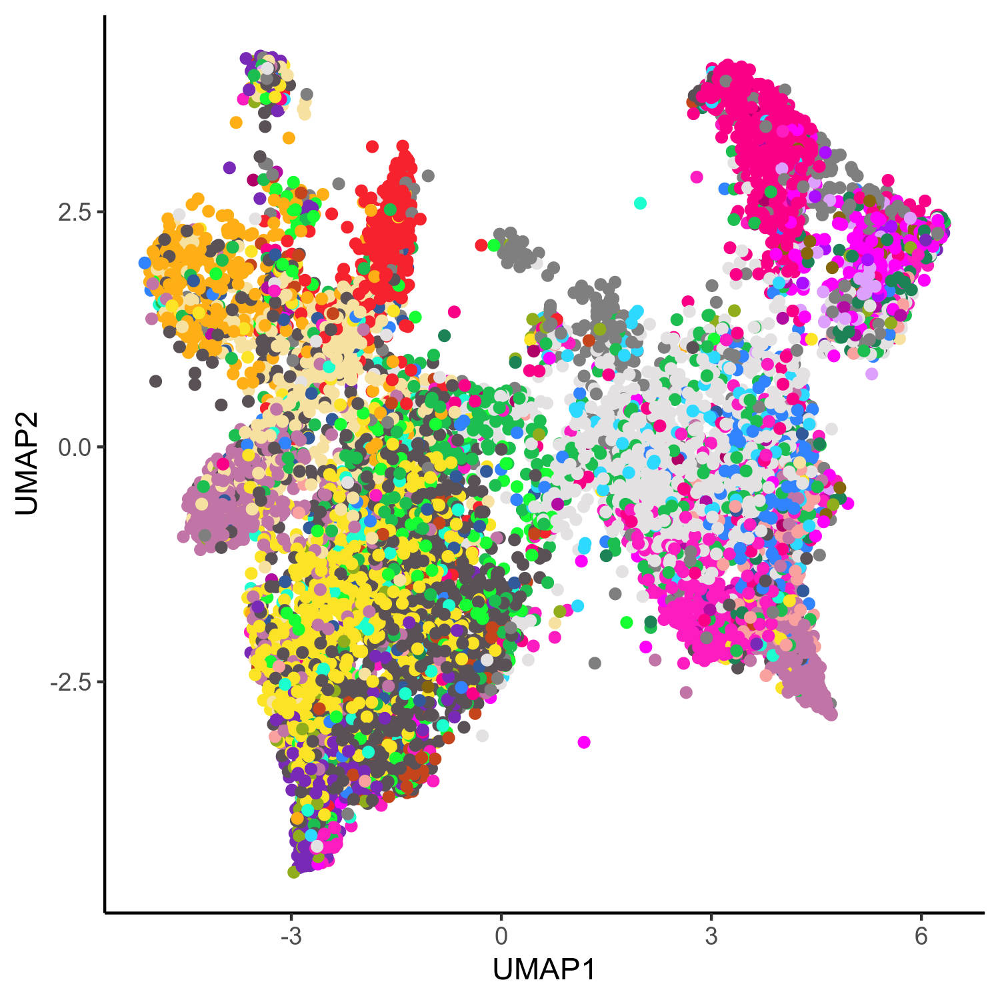

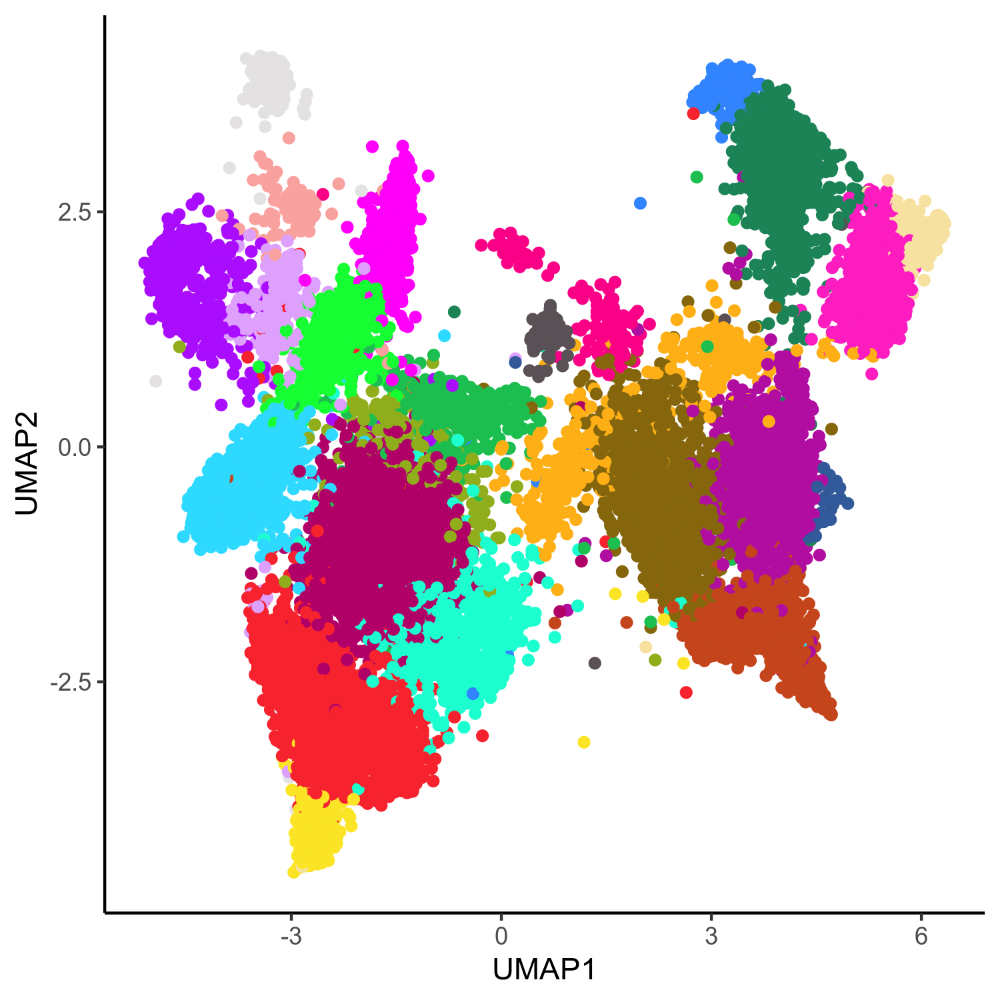

In [396]:
fig.size(5, 5)
ggplot(plot_df, aes(x = UMAP1, y = UMAP2, color = factor(annotation))) + 
    geom_point() + 
    theme_classic() +
    scale_color_manual(values = as.vector(polychrome(26)), drop = FALSE) +
    guides(colour = guide_legend(override.aes = list(size=3), text = element_text(size = 5), title="Cluster")) +
    theme(legend.position = 'none')
ggplot(plot_df, aes(x = UMAP1, y = UMAP2, color = factor(arnon_annotations))) + 
    geom_point() + 
    theme_classic() +
    scale_color_manual(values = as.vector(polychrome(26)), drop = FALSE) +
    guides(colour = guide_legend(override.aes = list(size=3), text = element_text(size = 5), title="Cluster")) +
    theme(legend.position = 'none')

ggplot(plot_df, aes(x = UMAP1, y = UMAP2, color = factor(cell_type_pred_knn))) + 
    geom_point() + 
    theme_classic() +
    scale_color_manual(values = as.vector(polychrome(26)), drop = FALSE) +
    guides(colour = guide_legend(override.aes = list(size=3), text = element_text(size = 5), title="Cluster")) +
    theme(legend.position = 'none')

In [99]:
cell_type <- plot_df %>%  select(annotation, cell_type_pred_knn) %>% 
                                group_by(annotation, cell_type_pred_knn) %>% tally()

In [100]:
df <- ungroup(cell_type)
or <- vector()
statistic <- vector() 
for (i in 1:nrow(df)) {
        inAandB <- df %>% filter(annotation == df$annotation[i], 
                                           cell_type_pred_knn == df$cell_type_pred_knn[i]) %>% pull(n) %>% sum()
        inAnotB <- df %>% filter(annotation == df$annotation[i], 
                                           cell_type_pred_knn != df$cell_type_pred_knn[i]) %>% pull(n) %>% sum()
        inBnotA <- df %>% filter(annotation != df$annotation[i], 
                                           cell_type_pred_knn == df$cell_type_pred_knn[i]) %>% pull(n) %>% sum()
        notBnotA <- df %>% filter(annotation != df$annotation[i], 
                                           cell_type_pred_knn != df$cell_type_pred_knn[i]) %>% pull(n) %>% sum()
        contin <- data.frame(c(inAandB, inAnotB), c(inBnotA, notBnotA))
        or <- (contin[1, 1] * contin[2, 2]) / (contin[1, 2] * contin[2, 1])
        statistic <- c(statistic, sign(log(or)) * sqrt(chisq.test(contin, simulate.p.value = TRUE)$statistic))        
}

df$stat <- statistic

or_plot <- df %>% select(-n) %>% pivot_wider(names_from = 'annotation', values_from = 'stat') 
cols <- colnames(or_plot)
or_plot[is.na(or_plot)] <- 0 
or_plot <- or_plot %>% data.frame()
rownames(or_plot) <- or_plot$cell_type_pred_knn
colnames(or_plot) <- cols
or_plot <- or_plot[, -1]

In [79]:
library(dendsort)
sort_hclust <- function(...) as.hclust(dendsort(as.dendrogram(...)))

mat_cluster_cols <- hclust(dist(t(or_plot)))

mat_cluster_cols <- sort_hclust(mat_cluster_cols)

In [103]:
colnames(or_plot)

[1] "1. CTL"                                  
 [2] "10. GZMK+ CD8+ ITGAE+"                   
 [3] "11. CD4+ CD28+ CCR7- SELL-"              
 [4] "12. CD4?"                                
 [5] "13. GZMK+ CD8+ CD69+"                    
 [6] "14. CD4+ CD69+ ITGAE+ S1P1- JUNhi"       
 [7] "15. CD4+ CD69+ ITGAE+ S1P1- JUNlo"       
 [8] "16. CD4+ CD28+ SELL+ CCR7+"              
 [9] "17. ILCs"                                
[10] "18. CD4+ RORC+ KLRB1+ CCR6+"             
[11] "19. CD4+ CCR7+ CD28+ SELL+ Ribohi"       
[12] "2. SYNEhi CTL"                           
[13] "20. CD4+ IL2RA++ FOXP3++"                
[14] "21. CD4+ SELL+ CD28+ CCR7+ IL2RA+ FOXP3+"
[15] "22. CD4+ PDCD1+ CXCR5+"                  
[16] "4. Proliferating"                        
[17] "5. GZMK+ CD8+ NKG7lo"                    
[18] "6. GZMK+ CD8 NKG7hi"                     
[19] "7. GZMK+ CD8+ CD28+ CCR7- SELL-"         
[20] "8. GZMK+ CD8+ NEAT1+"                    
[21] "9. GZMK+ CD8+ CD69+ ITGAE+ S1P1-"

In [108]:
col.order <- c('15. CD4+ CD69+ ITGAE+ S1P1- JUNlo', '1. CTL',  '16. CD4+ CD28+ SELL+ CCR7+', '14. CD4+ CD69+ ITGAE+ S1P1- JUNhi',
               '19. CD4+ CCR7+ CD28+ SELL+ Ribohi', '22. CD4+ PDCD1+ CXCR5+', '9. GZMK+ CD8+ CD69+ ITGAE+ S1P1-','2. SYNEhi CTL',
               '5. GZMK+ CD8+ NKG7lo', '6. GZMK+ CD8 NKG7hi', '18. CD4+ RORC+ KLRB1+ CCR6+', '17. ILCs', '7. GZMK+ CD8+ CD28+ CCR7- SELL-','8. GZMK+ CD8+ NEAT1+', 
                '8. GZMK+ CD8+ NEAT1+','20. CD4+ IL2RA++ FOXP3++', '21. CD4+ SELL+ CD28+ CCR7+ IL2RA+ FOXP3+', '4. Proliferating',
               '12. CD4?', '13. GZMK+ CD8+ CD69+',  '10. GZMK+ CD8+ ITGAE+')

In [91]:
colnames(or_plot)[-which(colnames(or_plot) %in% col.order)]

[1] "10. GZMK+ CD8+ ITGAE+"      "11. CD4+ CD28+ CCR7- SELL-"
[3] "12. CD4?"                   "13. GZMK+ CD8+ CD69+"      
[5] "6. GZMK+ CD8 NKG7hi"        "8. GZMK+ CD8+ NEAT1+"

In [80]:
row.order <- c('CD38+','CD4+ CD146+ memory','CD4+ CD161+ memory','CD4+ GNLY+','CD4+ GZMK+ memory','CD4+ IL7R+ memory','CD4+ IL7R+CCR5+ memory','CD4+ memory','CD4+ naive','CD4+ Tfh/Tph','CD8+ CD45ROlow/naive','CD8+ GZMB+/TEMRA','CD8+ GZMK/B+ memory','CD8+ GZMK+ memory','Innate-like','MT-high (low quality)','Vdelta1','Vdelta2','CD4+ CD25-high Treg','CD4+ CD25-low Treg','CD4+ OX40+NR3C1+','CD4+ Tph','CD8+ activated/NK-like','Proliferating')

In [85]:
max(or_plot)

[1] 86.00874

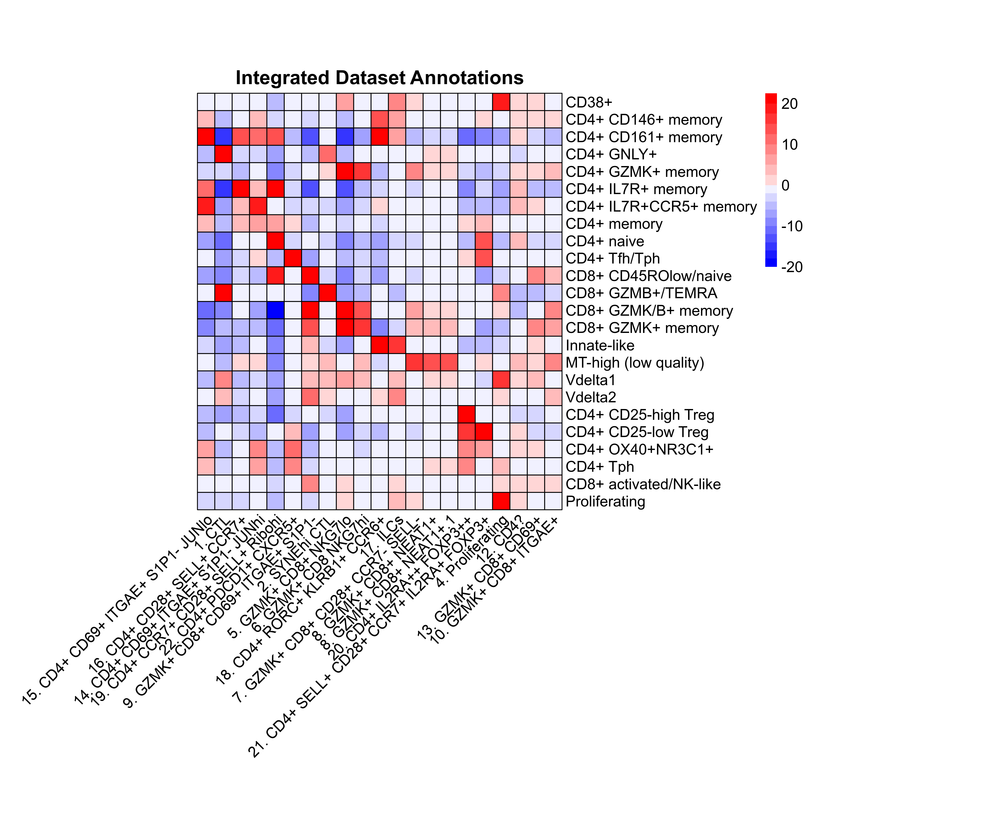

In [109]:
fig.size(10, 12)
pheatmap::pheatmap(or_plot[row.order, col.order], cellwidth = 15, cellheight = 15, 
                   color=colorRampPalette(c("blue", "white", "red"))(20), 
                   breaks = c(seq(-20, 0, 2), seq(0.001, 25, 2.5)), border_color = 'black', scale = 'none',
                   cluster_cols = FALSE, cluster_rows = FALSE, main = 'Integrated Dataset Annotations', fontsize = 13, angle_col = 45)

## IDENTIFY NK CELLS

In [2]:
ref <- readRDS("/data/srlab1/public/srcollab/AMP_Phase_2/singlecell_result/all_cells_reference_2021-05-20.rds")
ref$save_uwot_path <- '/data/srlab1/public/srcollab/AMP_Phase_2/singlecell_result/all_cells_uwot_model_2021-05-20'

In [3]:
qcd_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_meta_harmonizedPCUMAPclusters_annotations09212022.rds')
qcd_norm <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_norm_09092022.rds')

In [6]:
query = mapQuery(qcd_norm, # query gene expression (genes x cells)
                    qcd_meta,        # query metadata (cells x attributes)
                    ref, # Symphony reference object
                    do_normalize = FALSE,  # perform log(CP10k) normalization on query
                    vars = c("sample", "processing.batch", "dataset"),
                    do_umap = TRUE)        # project query cells into reference UMAP

Scaling and synchronizing query gene expression

Found 5635 out of 5751 reference variable genes in query dataset

Project query cells using reference gene loadings

Clustering query cells to reference centroids

Correcting query batch effects

UMAP

All done!



In [34]:
query = knnPredict(query, ref, ref$meta_data[ ,"cell_type"], k = 10, confidence=TRUE)

In [55]:
query_meta <- cbind(query$umap, query$meta)

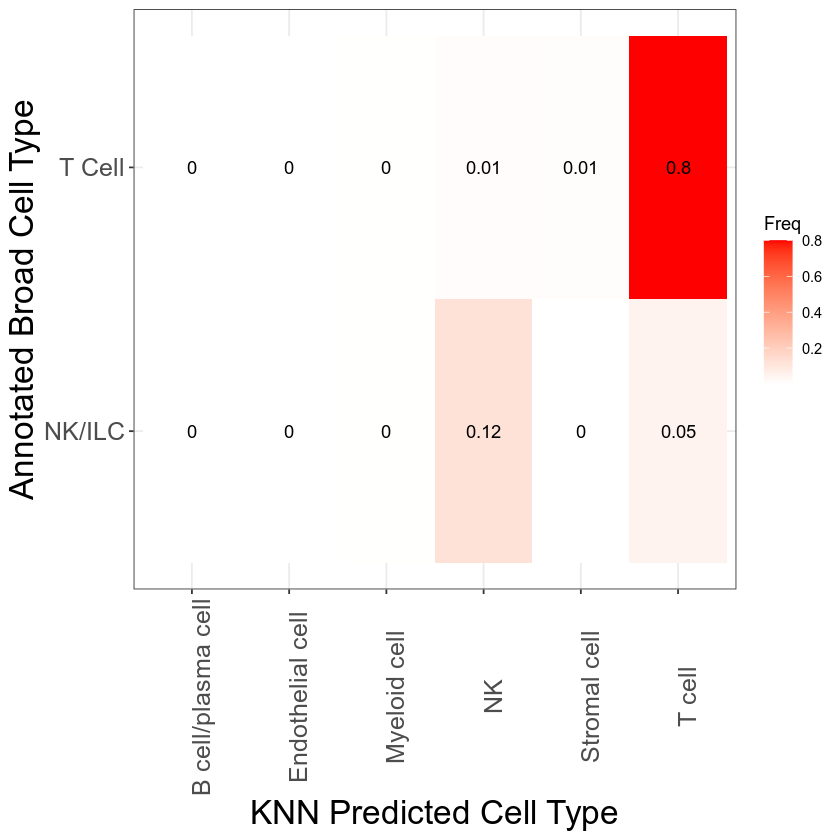

In [86]:
ggplot(query_meta %>% mutate(broad_annot = ifelse(new_cluster_number %in% c(0, 3, 17), 'NK/ILC', 'T Cell')) %>% 
                select(cell_type_pred_knn, broad_annot) %>% 
                table() %>% prop.table() %>% data.frame(), aes(x = as.character(cell_type_pred_knn), 
                                                               y = as.character(broad_annot), fill = Freq)) + 
        geom_tile() +
        scale_fill_gradient(low = 'white', high = 'red') +
        geom_text(aes(label = round(Freq, 2))) +
        theme_bw() + 
        labs(x = 'KNN Predicted Cell Type', y = 'Annotated Broad Cell Type') + 
        theme(axis.text.x = element_text(angle = 90),
              axis.text = element_text(size = 15),
              axis.title = element_text(size = 20))

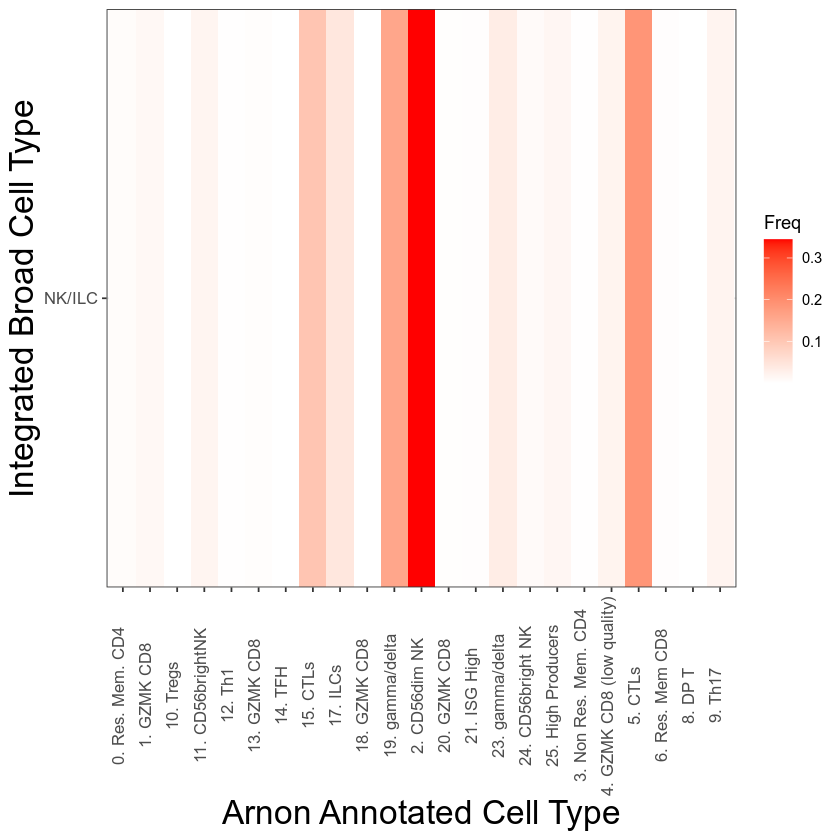

In [137]:
ggplot(query_meta %>% mutate(broad_annot = ifelse(new_cluster_number %in% c(0, 3, 17), 'NK/ILC', 'T Cell')) %>% 
                filter(broad_annot == 'NK/ILC', cell_type_pred_knn == 'T cell') %>% 
                select(broad_annot, arnon_annotations) %>% table() %>% prop.table() %>% 
                data.frame(), aes(x = arnon_annotations, y  = broad_annot, fill = Freq)) + 
        geom_tile(height = 4) +
        scale_fill_gradient(low = 'white', high = 'red') +
        theme_bw() + 
        labs(x = 'Arnon Annotated Cell Type', y = 'Integrated Broad Cell Type') + 
        theme(axis.text.x = element_text(angle = 90, vjust = 0.1),
              axis.text = element_text(size = 10),
              axis.title = element_text(size = 20))
    

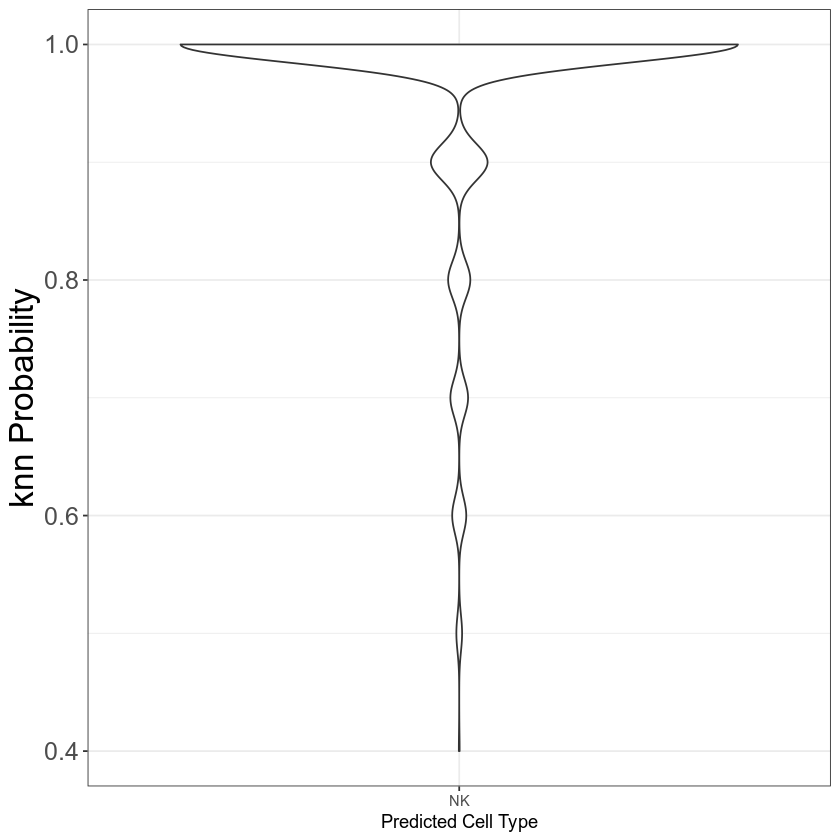

In [146]:
ggplot(query_meta %>% filter(cell_type_pred_knn == 'NK'), aes(x = cell_type_pred_knn, y = cell_type_pred_knn_prob)) + 
    geom_violin() + 
    theme_bw() + 
    labs(y = 'knn Probability', x = 'Predicted Cell Type') + 
    theme(axis.text.y = element_text(size = 15),
          axis.title.y  = element_text(size = 20))

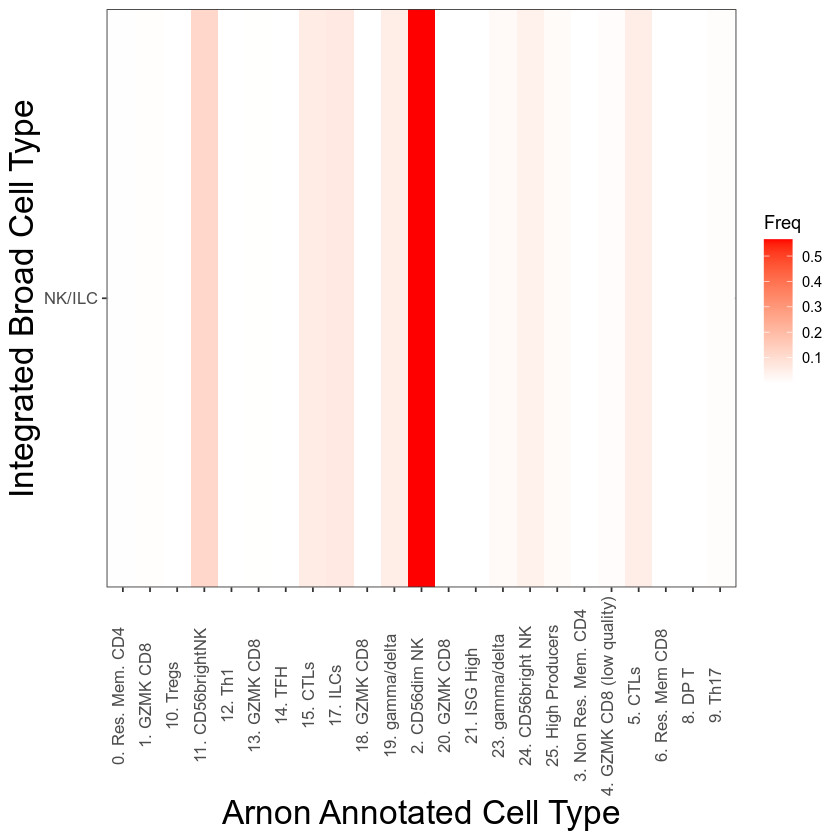

In [138]:
ggplot(query_meta %>% mutate(broad_annot = ifelse(new_cluster_number %in% c(0, 3, 17), 'NK/ILC', 'T Cell')) %>% 
                filter(broad_annot == 'NK/ILC') %>% 
                select(broad_annot, arnon_annotations) %>% table() %>% prop.table() %>% 
                data.frame(), aes(x = arnon_annotations, y  = broad_annot, fill = Freq)) + 
        geom_tile(height = 4) +
        scale_fill_gradient(low = 'white', high = 'red') +
        theme_bw() + 
        labs(x = 'Arnon Annotated Cell Type', y = 'Integrated Broad Cell Type') + 
        theme(axis.text.x = element_text(angle = 90, vjust = 0.1),
              axis.text = element_text(size = 10),
              axis.title = element_text(size = 20))

In [147]:
nk_meta <- query_meta %>% filter(cell_type_pred_knn == 'NK')

In [149]:
t_meta <- query_meta %>% filter(cell_type_pred_knn != 'NK')

In [153]:
query_meta %>% mutate(broad_annot = ifelse(new_cluster_number %in% c(0, 3, 17), 'NK/ILC', 'T Cell')) %>% select(broad_annot) %>% table()

.
NK/ILC T Cell 
  6797  31817 

In [161]:
saveRDS(nk_meta[, 1:17], '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/NK_refmapped_RA_preqc_10252022.rds')
saveRDS(t_meta[, 1:17], '/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_refmapped_RA_preqc_10252022.rds')

## CNA Prep

In [4]:
library(readxl)
library(stringr)
qcd_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_meta_harmonizedPCUMAPclusters_annotations09212022.rds')
clinical <- read_xlsx("/data/srlab2/jmears/jupyter/SLE_Phase2_Kidney_Analysis/cell-seq-output/FinalClinical/final_clinical_data_8-10-21_ResponderNA.xlsx")
clinical <- clinical %>% 
                        mutate(individual = str_split(Sample, '-')) %>% 
                        rowwise() %>% 
                        mutate(individual = unlist(individual)[2])

Warning message:
“package ‘readxl’ was built under R version 4.1.3”


### Case/Control

In [53]:
sn_cna_meta <- qcd_meta %>% 
                        filter(dataset == 'snRNAseq') %>% 
                        mutate(individual = str_split(sample, '_')) %>% 
                        rowwise() %>% 
                        mutate(individual = unlist(individual)[3]) %>% left_join(clinical %>% 
                                                                                 select(-c('sample', 'Sample', 'Site', 'Type', 'processing.batch')), 
                                                                                 by = 'individual')
sc_cna_meta <- qcd_meta %>% 
                        filter(dataset == 'scRNAseq') %>% 
                        mutate(individual = str_split(sample, '_')) %>% 
                        rowwise() %>% 
                        mutate(individual = unlist(individual)[3]) %>% left_join(clinical %>% 
                                                                                 select(-c('sample', 'Sample', 'Site', 'Type', 'processing.batch')), 
                                                                                 by = 'individual')

In [16]:
meta <- sn_cna_meta %>% select(-c(colnames(sn_cna_meta[grep('hPC', colnames(sn_cna_meta))]), 
                          colnames(sn_cna_meta[grep('UMAP', colnames(sn_cna_meta))])))
harmony <- sn_cna_meta %>% select(colnames(sn_cna_meta)[grep('hPC', colnames(sn_cna_meta))])

umap <- sn_cna_meta %>% select(c(hUMAP1, hUMAP2))


ind <- meta$Type == "NA"
sum(ind)
meta <- meta[!ind,]
umap <- umap[!ind,]
harmony <- harmony[!ind,]


meta$Type_numeric <- as.numeric(as.factor(meta$Type))
#meta$Site <- as.numeric(as.factor(meta$Site))
meta$Responder_Status <- as.numeric(as.factor(meta$Responder.Status))
meta$processing_batch <- as.numeric(as.factor(meta$processing.batch))
meta$Sex <- as.numeric(as.factor(meta$Sex))
#meta$Race <- as.numeric(as.factor(meta$Race))
meta$Ethnicity <- as.numeric(as.factor(meta$Ethnicity))
meta$ISN <- as.numeric(as.factor(meta$ISN))
meta$Chronicity <- as.numeric(as.factor(meta$Chronicity))
meta$Activity <- as.numeric(factor(meta$Activity, levels = c(0,1,2,3,4,5,6,7,8,9,10,11,13,14,15,16,18)))

write.csv(meta, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_casecontrol_meta.csv', row.names = FALSE, quote = FALSE)
write.csv(harmony, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_casecontrol_harmony.csv', row.names = FALSE, quote = FALSE)
write.csv(umap, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_casecontrol_umap.csv', row.names = FALSE, quote = FALSE)

[1] 0

In [17]:
meta <- sc_cna_meta %>% select(-c(colnames(sn_cna_meta[grep('hPC', colnames(sn_cna_meta))]), 
                          colnames(sn_cna_meta[grep('UMAP', colnames(sn_cna_meta))])))
harmony <- sc_cna_meta %>% select(colnames(sn_cna_meta)[grep('hPC', colnames(sn_cna_meta))])

umap <- sc_cna_meta %>% select(c(hUMAP1, hUMAP2))


ind <- meta$Type == "NA"
sum(ind)
meta <- meta[!ind,]
umap <- umap[!ind,]
harmony <- harmony[!ind,]


meta$Type_numeric <- as.numeric(as.factor(meta$Type))
#meta$Site <- as.numeric(as.factor(meta$Site))
meta$Responder_Status <- as.numeric(as.factor(meta$Responder.Status))
meta$processing_batch <- as.numeric(as.factor(meta$processing.batch))
meta$Sex <- as.numeric(as.factor(meta$Sex))
#meta$Race <- as.numeric(as.factor(meta$Race))
meta$Ethnicity <- as.numeric(as.factor(meta$Ethnicity))
meta$ISN <- as.numeric(as.factor(meta$ISN))
meta$Chronicity <- as.numeric(as.factor(meta$Chronicity))
meta$Activity <- as.numeric(factor(meta$Activity, levels = c(0,1,2,3,4,5,6,7,8,9,10,11,13,14,15,16,18)))

write.csv(meta, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_casecontrol_meta.csv', row.names = FALSE, quote = FALSE)
write.csv(harmony, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_casecontrol_harmony.csv', row.names = FALSE, quote = FALSE)
write.csv(umap, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_casecontrol_umap.csv', row.names = FALSE, quote = FALSE)

[1] 0

### Chronicity

In [112]:
sn_cna_meta <- qcd_meta %>% 
                        filter(dataset == 'snRNAseq') %>% 
                        mutate(individual = str_split(sample, '_')) %>% 
                        rowwise() %>% 
                        mutate(individual = unlist(individual)[3]) %>% left_join(clinical %>% 
                                                                                 select(-c('sample', 'Sample', 'Site', 'Type', 'processing.batch')), 
                                                                                 by = 'individual')
sc_cna_meta <- qcd_meta %>% 
                        filter(dataset == 'scRNAseq') %>% 
                        mutate(individual = str_split(sample, '_')) %>% 
                        rowwise() %>% 
                        mutate(individual = unlist(individual)[3]) %>% left_join(clinical %>% 
                                                                                 select(-c('sample', 'Sample', 'Site', 'Type', 'processing.batch')), 
                                                                                 by = 'individual')

In [124]:
meta <- sn_cna_meta %>% select(-c(colnames(sn_cna_meta[grep('hPC', colnames(sn_cna_meta))]), 
                          colnames(sn_cna_meta[grep('UMAP', colnames(sn_cna_meta))])))
harmony <- sn_cna_meta %>% select(colnames(sn_cna_meta)[grep('hPC', colnames(sn_cna_meta))])

umap <- sn_cna_meta %>% select(c(hUMAP1, hUMAP2))


ind <- meta$Chronicity == "NA"
sum(ind)
meta <- meta[!ind,]
umap <- umap[!ind,]
harmony <- harmony[!ind,]


meta$Type <- as.numeric(as.factor(meta$Type))
#meta$Site <- as.numeric(as.factor(meta$Site))
meta$Responder_Status <- as.numeric(as.factor(meta$Responder.Status))
meta$processing_batch <- as.numeric(as.factor(meta$processing.batch))
meta$Sex <- as.numeric(as.factor(meta$Sex))
#meta$Race <- as.numeric(as.factor(meta$Race))
meta$Ethnicity <- as.numeric(as.factor(meta$Ethnicity))
meta$ISN <- as.numeric(as.factor(meta$ISN))
meta$Chronicity <- as.numeric(as.factor(meta$Chronicity))
meta$Activity <- as.numeric(factor(meta$Activity, levels = c(0,1,2,3,4,5,6,7,8,9,10,11,13,14,15,16,18)))

write.csv(meta, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_chronicity_meta.csv', row.names = FALSE, quote = FALSE)
write.csv(harmony, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_chronicity_harmony.csv', row.names = FALSE, quote = FALSE)
write.csv(umap, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_chronicity_umap.csv', row.names = FALSE, quote = FALSE)

[1] 465

In [174]:
meta <- sc_cna_meta %>% select(-c(colnames(sn_cna_meta[grep('hPC', colnames(sn_cna_meta))]), 
                          colnames(sn_cna_meta[grep('UMAP', colnames(sn_cna_meta))])))
harmony <- sc_cna_meta %>% select(colnames(sn_cna_meta)[grep('hPC', colnames(sn_cna_meta))])

umap <- sc_cna_meta %>% select(c(hUMAP1, hUMAP2))


ind <- meta$Chronicity == "NA"
sum(ind)
meta <- meta[!ind,]
umap <- umap[!ind,]
harmony <- harmony[!ind,]


meta$Type <- as.numeric(as.factor(meta$Type))
#meta$Site <- as.numeric(as.factor(meta$Site))
meta$Responder_Status <- as.numeric(as.factor(meta$Responder.Status))
meta$processing_batch <- as.numeric(as.factor(meta$processing.batch))
meta$Sex <- as.numeric(as.factor(meta$Sex))
#meta$Race <- as.numeric(as.factor(meta$Race))
meta$Ethnicity <- as.numeric(as.factor(meta$Ethnicity))
meta$ISN <- as.numeric(as.factor(meta$ISN))
meta$Chronicity <- as.numeric(as.factor(meta$Chronicity))
meta$Activity <- as.numeric(factor(meta$Activity, levels = c(0,1,2,3,4,5,6,7,8,9,10,11,13,14,15,16,18)))

write.csv(meta, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_chronicity_meta.csv', row.names = FALSE, quote = FALSE)
write.csv(harmony, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_chronicity_harmony.csv', row.names = FALSE, quote = FALSE)
write.csv(umap, '/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_chronicity_umap.csv', row.names = FALSE, quote = FALSE)

[1] 6377

## CNA Visualization

### sc Case/Control

Joining, by = "cell"


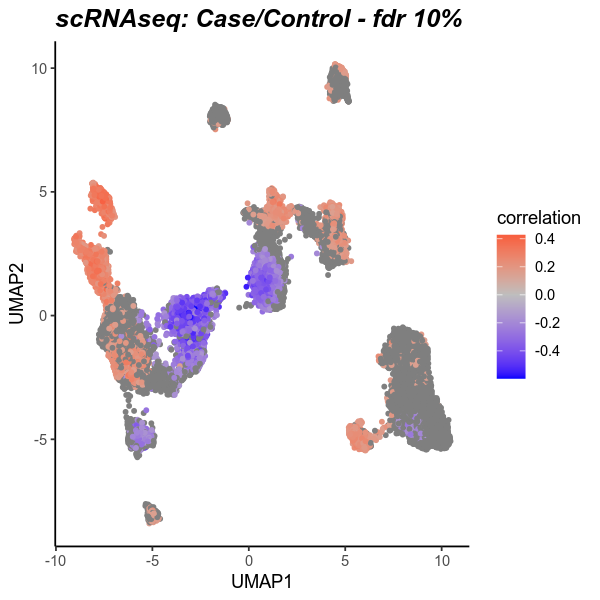

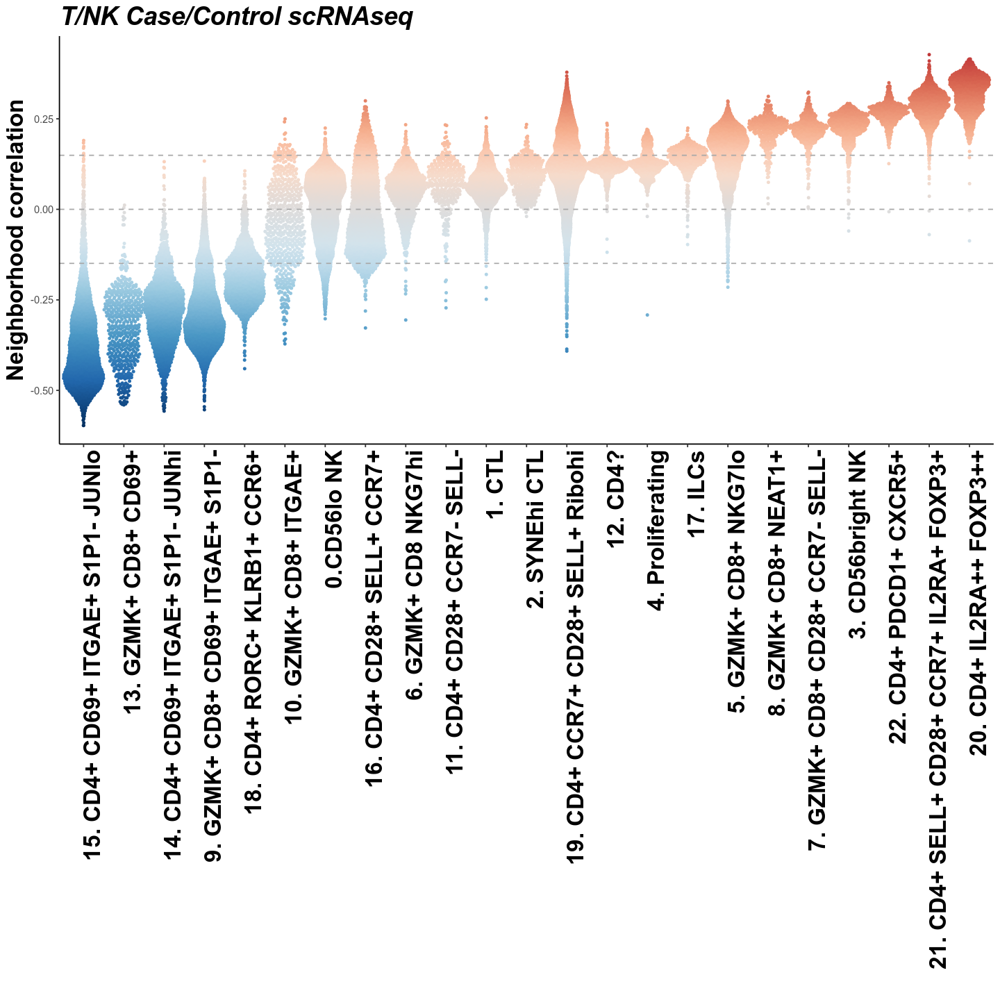

In [18]:
meta <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_casecontrol_meta.csv')
meta <- meta %>% select(-annotation) %>% left_join(qcd_meta %>% select(cell, annotation))
kept <- read.csv("/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_casecontrol.kept.csv")
kept <- which(kept[, 1] == TRUE)

thresh <- read.csv("/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_casecontrol.thresh.csv", header = FALSE)
ncorr <- read.csv("/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_casecontrol.ncorrs.csv", header = FALSE)
ncorr <- ncorr[, 1]

meta_tmp_1 <- meta
meta_tmp_1$ncorr <- as.numeric(ncorr)

thresh10 <- thresh[2, ]


meta_tmp_1$ncorr <- as.numeric(ncorr)

umap <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_casecontrol_umap.csv')

sn_umap <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_casecontrol_umap.csv')

meta_tmp_1$UMAP1 <- umap$hUMAP1
meta_tmp_1$UMAP2 <- umap$hUMAP2


meta_tmp_1$ncorr[which(abs(meta_tmp_1$ncorr) < thresh10)] <- NA


fig.size(5, 5)
ggplot(
      data = meta_tmp_1[sample(nrow(meta_tmp_1)),] %>% rename(correlation = ncorr), 
      aes(x = UMAP1, y = UMAP2)) + 
      geom_point(mapping = aes(color = correlation), alpha = 5, size = 1) + 
 #     geom_point(data = qcd_meta %>% filter(dataset == 'snRNAseq'), aes(x = hUMAP1, y = hUMAP2), color = 'black', alpha = 0.1) + 
      scale_color_gradient2(low = 'blue', mid = 'gray', high = 'red') + 
      labs(x="UMAP1", y="UMAP2") +
      theme_classic() +
      theme(
        plot.title = element_text(color="black", size=15, face="bold.italic")
        ) +
      labs(title = "scRNAseq: Case/Control - fdr 10%") 
pos_fdr_thres <- thresh10
neg_fdr_thresh <- -1 * thresh10


meta$ncorr <- as.numeric(ncorr)

interval <- c(-max(abs(meta$ncorr)), max(abs(meta$ncorr)))


myPalette <- colorRampPalette(c(RColorBrewer::brewer.pal(11, "RdBu")[11:7], "#DCDCDC", RColorBrewer::brewer.pal(11, "RdBu")[5:1]))
fig.size(12, 12)

ggplot(meta, aes(x = reorder(annotation, ncorr), y = ncorr)) +
    ggbeeswarm::geom_quasirandom(aes(color = ncorr), width = 0.5, size = 0.75) +
    geom_hline(yintercept = thresh10, linetype = "dashed", color = "darkgrey") +
    geom_hline(yintercept = -1 * thresh10, linetype = "dashed", color = "darkgrey") +
    geom_hline(yintercept = 0, linetype = "dashed", color = "darkgrey") +
    scale_colour_gradientn(colours = myPalette(20), limits = interval) +
    labs(title = "T/NK Case/Control scRNAseq", x= "", y = "Neighborhood correlation") +
    theme_classic() +
    theme(
        legend.position = "none",
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=22, face = "bold.italic"),
        axis.text.x = element_text(color = "black", size = 20, angle = 90, hjust=1, face = "bold"),
        axis.title = element_text(size=20, face = "bold"))

### sn Case/Control

Joining, by = "cell"


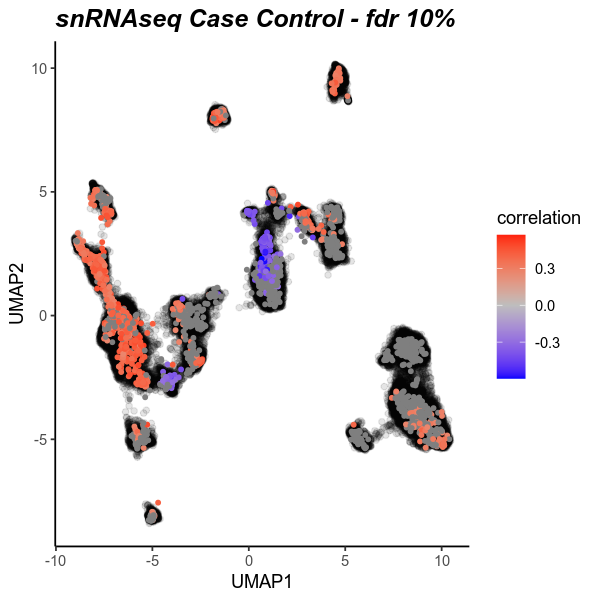

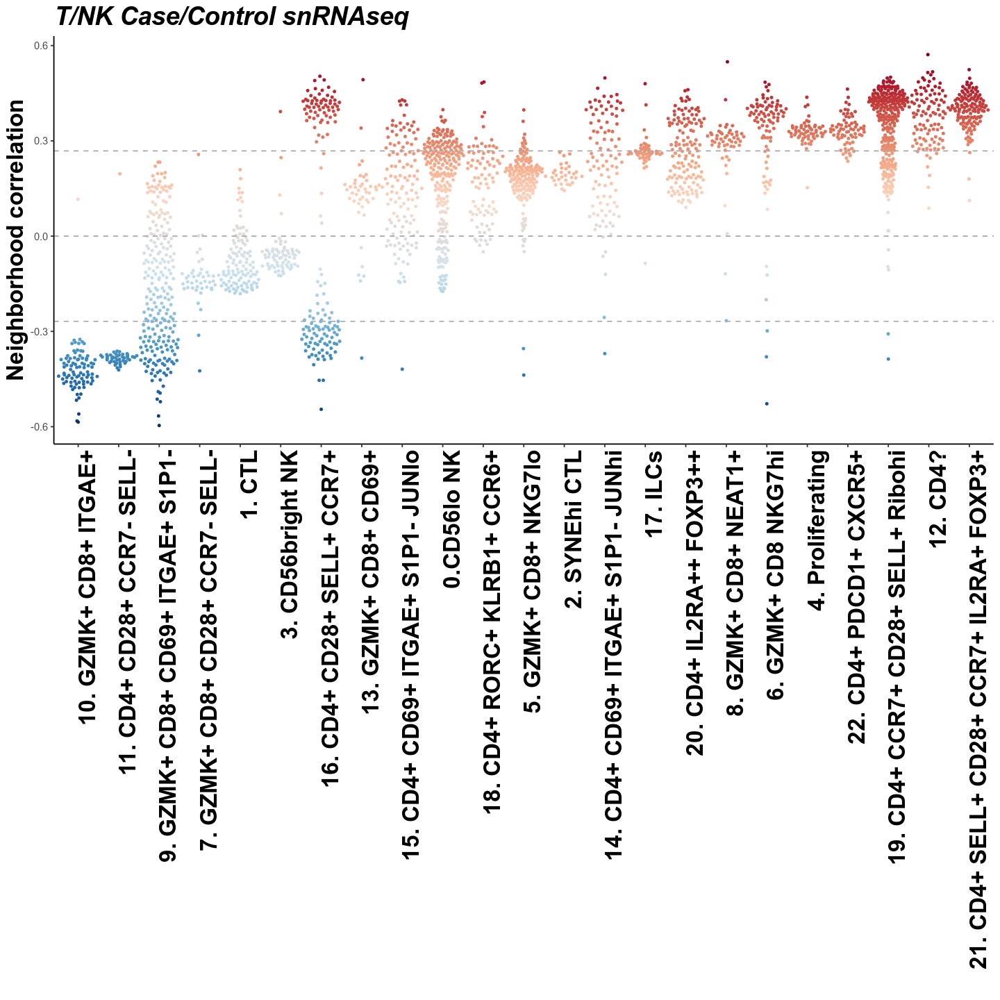

In [17]:
meta <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_casecontrol_meta.csv')
meta <- meta %>% select(-annotation) %>% left_join(qcd_meta %>% select(cell, annotation))
kept <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_casecontrol.kept.csv')
kept <- kept[, 1]
kept <- which(kept == TRUE)
thresh <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_casecontrol.thresh.csv', header = FALSE)
ncorr <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_casecontrol.ncorrs.csv', check.names = FALSE, header = FALSE)
ncorr <- ncorr[, 1]

thresh10 <- thresh[2, ]


meta_tmp_1 <- meta
meta_tmp_1$ncorr <- as.numeric(ncorr)


umap <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_casecontrol_umap.csv')

meta_tmp_1$UMAP1 <- umap$hUMAP1
meta_tmp_1$UMAP2 <- umap$hUMAP2

meta_tmp_1$ncorr[which(abs(meta_tmp_1$ncorr) < thresh10)] <- NA


sc_umap <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_casecontrol_umap.csv')

fig.size(5, 5)
ggplot(
      data = meta_tmp_1[sample(nrow(meta_tmp_1)),] %>% rename(correlation = ncorr), 
      aes(x = UMAP1, y = UMAP2)) + 
      geom_point(data = qcd_meta %>% filter(dataset == 'scRNAseq'), aes(x = hUMAP1, y = hUMAP2), color = 'black', alpha = 0.1) + 
      geom_point(mapping = aes(color = correlation), alpha = 5, size = 1) + 
      scale_color_gradient2(low = 'blue', mid = 'gray', high = 'red') + 
      labs(x="UMAP1", y="UMAP2") +
      theme_classic()+
      theme(
        plot.title = element_text(color="black", size=15, face="bold.italic")
        ) +
      labs(title = "snRNAseq Case Control - fdr 10%")

pos_fdr_thres <- thresh10
neg_fdr_thresh <- -1 * thresh10


meta$ncorr <- as.numeric(ncorr)

interval <- c(-max(abs(meta$ncorr)), max(abs(meta$ncorr)))


myPalette <- colorRampPalette(c(RColorBrewer::brewer.pal(11, "RdBu")[11:7], "#DCDCDC", RColorBrewer::brewer.pal(11, "RdBu")[5:1]))
fig.size(12, 12)

ggplot(meta, aes(x = reorder(annotation, ncorr), y = ncorr)) +
    ggbeeswarm::geom_quasirandom(aes(color = ncorr), width = 0.5, size = 0.75) +
    geom_hline(yintercept = thresh10, linetype = "dashed", color = "darkgrey") +
    geom_hline(yintercept = -1 * thresh10, linetype = "dashed", color = "darkgrey") +
    geom_hline(yintercept = 0, linetype = "dashed", color = "darkgrey") +
    scale_colour_gradientn(colours = myPalette(20), limits = interval) +
    labs(title = "T/NK Case/Control snRNAseq", x= "", y = "Neighborhood correlation") +
    theme_classic() +
    theme(
        legend.position = "none",
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=22, face = "bold.italic"),
        axis.text.x = element_text(color = "black", size = 20, angle = 90, hjust=1, face = "bold"),
        axis.title = element_text(size=20, face = "bold"))

### sc Chronicity

In [5]:
meta <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_chronicity.meta.csv')
meta <- meta %>% select(-annotation) %>% left_join(qcd_meta %>% select(cell, annotation))
kept <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_chronicity.kept.csv')
kept <- kept[, 1]
kept <- which(kept == TRUE)
thresh <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_chronicity.thresh.csv')
ncorr <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_chronicity.ncorrs.csv', check.names = FALSE)
ncorr <- rbind(colnames(ncorr), ncorr)
ncorr <- ncorr[, 1]

meta_tmp_1 <- meta
meta_tmp_1$ncorr <- as.numeric(ncorr)

meta <- left_join(meta %>% select(-final_annotation), data.frame(new_cluster_number = seq(0, 22), 
                                           final_annotation = c("NK0. CD56dim NK",
                                                                 "T1. CD8+ GZMB+ CTL",
                                                                 "T2. CD8+ GZMB+ SYNE2bright CTL",
                                                                 "NK3. CD56bright NK",
                                                                 "T4. CENPF+ MKI67+ Proliferating",
                                                                 "T5. GZMK+ CD8+ NKG7high",
                                                                 "T6. GZMK+ CD8+ NKG7low",
                                                                 "T7. GZMK+ CD8+ Effector Memory-like",
                                                                 "T8. GZMK+ CD8+ NEAT1+",
                                                                 "T9. GZMK+ CD8+ Resident Memory-like",
                                                                 "T10. GZMK+ CD8+ ITGAE",
                                                                 "T11. CD4+ Effector Memory-like",
                                                                 "T12. CD4+",
                                                                 "T13. CD8+ GMZK+ CD69+",
                                                                 "T14. CD4+ JUNhigh Resident Memory-like",
                                                                 "T15. CD4+ JUNlow Resident Memory-like",
                                                                 "T16. CD4+ Central memory/Naive-like",
                                                                 "T17. KLRB1+ KIT+ ILC",
                                                                 "T18. CD4+ RORC+ CCR6+ Th17-like",
                                                                 "T19. CD4+ Central Memory/Naive-like",
                                                                 "T20. CD4+ IL2RA++ FOXP3++ Treg-like",
                                                                 "T21. CD4+ CXCR5+ Central Memory/Naive-like",
                                                                 "T22. CD4+ PDCD1+ CXCR5+ TFH-like")))

thresh10 <- thresh[, 1]


meta_tmp_1$ncorr <- as.numeric(ncorr)


umap <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_chronicity_umap.csv')

sn_umap <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_chronicity_umap.csv')

meta_tmp_1$UMAP1 <- umap$hUMAP1
meta_tmp_1$UMAP2 <- umap$hUMAP2


meta_tmp_1$ncorr[which(abs(meta_tmp_1$ncorr) < thresh10)] <- NA


fig.size(5, 5)
ggplot(
      data = meta_tmp_1[sample(nrow(meta_tmp_1)),] %>% rename(correlation = ncorr), 
      aes(x = UMAP1, y = UMAP2)) + 
      geom_point(mapping = aes(color = correlation), alpha = 5, size = 1) + 
      geom_point(data = qcd_meta %>% filter(dataset == 'snRNAseq'), aes(x = hUMAP1, y = hUMAP2), color = 'black', alpha = 0.1) + 
      scale_color_gradient2(low = 'blue', mid = 'gray', high = 'red') + 
      labs(x="UMAP1", y="UMAP2") +
      theme_Publication() +
      theme(
        plot.title = element_text(color="black", size=12), # face="bold.italic"
        ) +
      labs(title = "scRNAseq: Chronicity - fdr 10%") 
pos_fdr_thres <- thresh10
neg_fdr_thresh <- -1 * thresh10


meta$ncorr <- as.numeric(ncorr)

interval <- c(-max(abs(meta$ncorr)), max(abs(meta$ncorr)))


myPalette <- colorRampPalette(c(RColorBrewer::brewer.pal(11, "RdBu")[11:7], "#DCDCDC", RColorBrewer::brewer.pal(11, "RdBu")[5:1]))
fig.size(8, 8)

ggplot(meta, aes(x = reorder(annotation, ncorr), y = ncorr)) +
    ggbeeswarm::geom_quasirandom(aes(color = ncorr), width = 0.5, size = 0.75) +
    geom_hline(yintercept = thresh10, linetype = "dashed", color = "darkgrey") +
    geom_hline(yintercept = -1 * thresh10, linetype = "dashed", color = "darkgrey") +
    geom_hline(yintercept = 0, linetype = "dashed", color = "darkgrey") +
    scale_colour_gradientn(colours = myPalette(20), limits = interval) +
    labs(title = "T/NK Chronicity scRNAseq", x= "", y = "Neighborhood correlation") +
    theme_Publication() +
    theme(
        legend.position = "none",
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=12),
        axis.text.x = element_text(color = "black", size = 8, angle = 45, hjust=1),
        axis.title = element_text(size=10))

Joining, by = "cell"


ERROR: [1m[33mError[39m in `select()`:[22m
[33m![39m Can't subset columns that don't exist.
[31m✖[39m Column `final_annotation` doesn't exist.


In [30]:
sc_med <- meta %>% select(annotation, ncorr) %>% group_by(annotation) %>% summarize(singlecell = median(ncorr))

In [53]:
old_meta <- read.csv("/data/srlab/ssg34/SLE_kidney/data/T+nk/all_T+nk_cells.post_meta_CNA_chronicity.csv")
old_ncorr <- read.csv("/data/srlab/ssg34/SLE_kidney/data/T+nk/all_T+nk_postQC_responder_ncorrs_chronicity.csv",header = F)
ncorr <- old_ncorr$V1
old_meta$old_ncorr <- ncorr

In [68]:
library(MASS)

Warning message:
“package ‘MASS’ was built under R version 4.1.3”

Attaching package: ‘MASS’


The following object is masked from ‘package:dplyr’:

    select




In [69]:
get_density <- function(x, y, ...) {
  dens <- MASS::kde2d(x, y, ...)
  ix <- findInterval(x, dens$x)
  iy <- findInterval(y, dens$y)
  ii <- cbind(ix, iy)
  return(dens$z[ii])
}

In [84]:
dat <- left_join(meta, old_meta[, c('cells', 'old_ncorr')] %>% rename(cell = cells)) %>% dplyr::select(old_ncorr, ncorr) %>% na.omit()

Joining, by = "cell"


In [89]:
dat$density <- get_density(dat$old_ncor, dat$ncorr, n = 20)

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


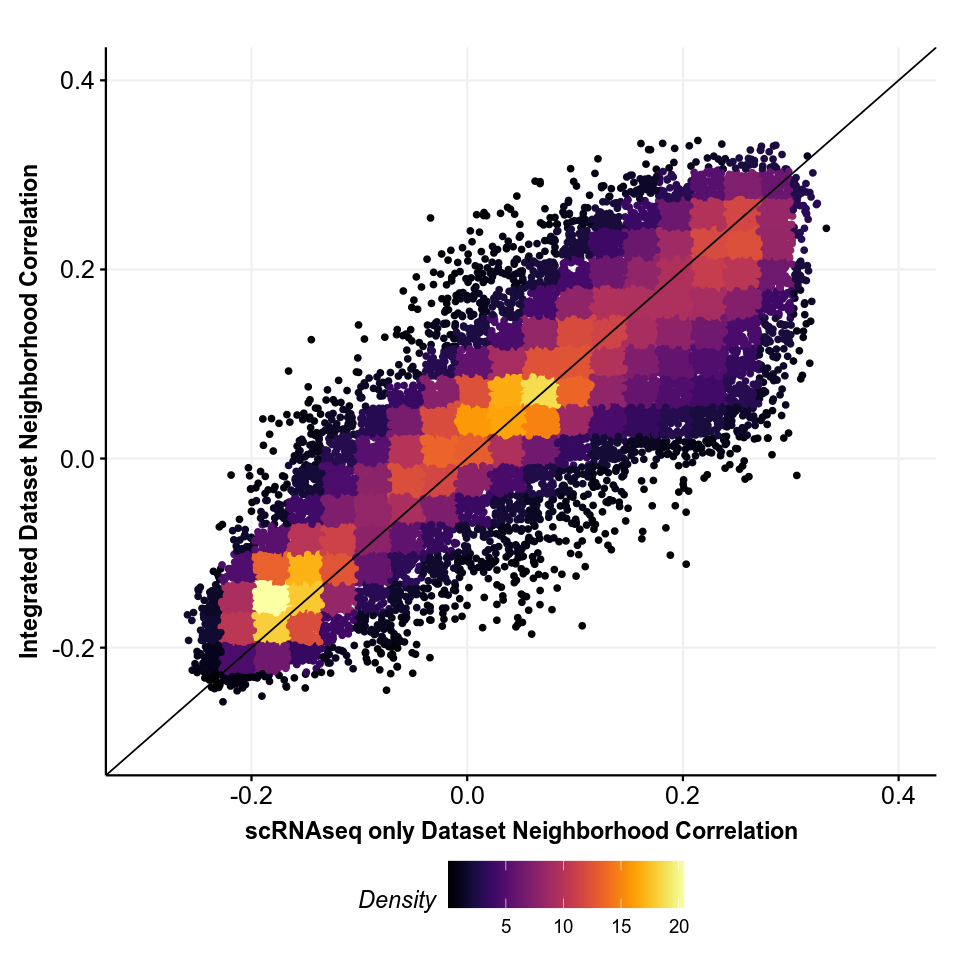

In [92]:
ggplot(dat %>% rename(Density = density), aes(x = old_ncorr, y = ncorr, color = Density)) + 
    geom_point() +
    geom_abline() +
    labs(x = 'scRNAseq only Dataset Neighborhood Correlation', y = 'Integrated Dataset Neighborhood Correlation') + 
    scale_color_viridis(option = 'inferno') + 
    theme_Publication() +
    scale_x_continuous(limits = c(-0.3, 0.4)) + 
    scale_y_continuous(limits = c(-0.3, 0.4)) 

In [57]:
left_join(meta, old_meta %>% select(cells, old_ncorr) %>% rename(cell = cells))

Joining, by = "cell"


cell,sample,Annot.separate,dataset,Site,Type,processing.batch,nCount_RNA,nFeature_RNA,broad.type,⋯,Novaseq.num,Flow.cell,Lane.num,Rituximab.stop.date,biopsy.length.from.site.mm,Responder_Status,processing_batch,annotation,ncorr,old_ncorr
<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<chr>,⋯,<int>,<chr>,<int>,<int>,<chr>,<int>,<int>,<chr>,<dbl>,<dbl>
AACGGGAGTACGATTC-1-AMPSLEkid_cells_0143,AMPSLEkid_cells_0143,T,scRNAseq,Rochester,1,30,4018,1513,T/NK,⋯,4,HLFTVDSXY,4,NA,N/A,5,28,9. GZMK+ CD8+ CD69+ ITGAE+ S1P1-,0.005947142,-0.0258644318
AAGACAAAGGATTCAA-1-AMPSLEkid_cells_0143,AMPSLEkid_cells_0143,T,scRNAseq,Rochester,1,30,5222,1676,T/NK,⋯,4,HLFTVDSXY,4,NA,N/A,5,28,13. GZMK+ CD8+ CD69+,0.068423125,-0.0365313886
ACAGGGAGTCTACGTA-1-AMPSLEkid_cells_0143,AMPSLEkid_cells_0143,T,scRNAseq,Rochester,1,30,4285,1472,T/NK,⋯,4,HLFTVDSXY,4,NA,N/A,5,28,18. CD4+ RORC+ KLRB1+ CCR6+,0.011177065,0.0778784065
ACATGCAAGGAAGTAG-1-AMPSLEkid_cells_0143,AMPSLEkid_cells_0143,T,scRNAseq,Rochester,1,30,4653,1841,T/NK,⋯,4,HLFTVDSXY,4,NA,N/A,5,28,5. GZMK+ CD8+ NKG7lo,-0.132027310,-0.1572654748
ACTGATGAGATAGCAT-1-AMPSLEkid_cells_0143,AMPSLEkid_cells_0143,T,scRNAseq,Rochester,1,30,6385,2332,T/NK,⋯,4,HLFTVDSXY,4,NA,N/A,5,28,1. CTL,-0.138715798,-0.2006897890
ACTTATCCACCTCTGT-1-AMPSLEkid_cells_0143,AMPSLEkid_cells_0143,T,scRNAseq,Rochester,1,30,4366,1726,T/NK,⋯,4,HLFTVDSXY,4,NA,N/A,5,28,18. CD4+ RORC+ KLRB1+ CCR6+,-0.052843236,-0.0292013589
AGAGAGCTCCTACCAC-1-AMPSLEkid_cells_0143,AMPSLEkid_cells_0143,T,scRNAseq,Rochester,1,30,4606,1168,T/NK,⋯,4,HLFTVDSXY,4,NA,N/A,5,28,20. CD4+ IL2RA++ FOXP3++,0.026053621,-0.0834638859
AGCATCATCCGATGCG-1-AMPSLEkid_cells_0143,AMPSLEkid_cells_0143,T,scRNAseq,Rochester,1,30,5114,1868,T/NK,⋯,4,HLFTVDSXY,4,NA,N/A,5,28,0.CD56lo NK,-0.185163939,-0.2364456106
AGGTAGGTCGCTATTT-1-AMPSLEkid_cells_0143,AMPSLEkid_cells_0143,T,scRNAseq,Rochester,1,30,4724,1802,T/NK,⋯,4,HLFTVDSXY,4,NA,N/A,5,28,1. CTL,-0.136797279,-0.1983544772


In [56]:
cor.test(left_join(meta, old_meta %>% select(cells, old_ncorr) %>% rename(cell = cells))$old_ncorr, left_join(meta, old_meta %>% select(cells, old_ncorr) %>% rename(cell = cells))$ncorr)

Joining, by = "cell"
Joining, by = "cell"



	Pearson's product-moment correlation

data:  left_join(meta, old_meta %>% select(cells, old_ncorr) %>% rename(cell = cells))$old_ncorr and left_join(meta, old_meta %>% select(cells, old_ncorr) %>% rename(cell = cells))$ncorr
t = 347.59, df = 28587, p-value < 2.2e-16
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.8970173 0.9014536
sample estimates:
      cor 
0.8992586 


### sn Chronicity

Joining, by = "cell"
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


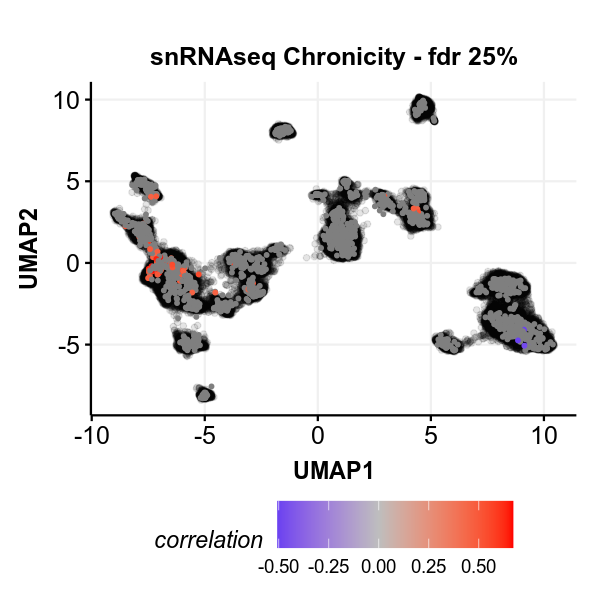

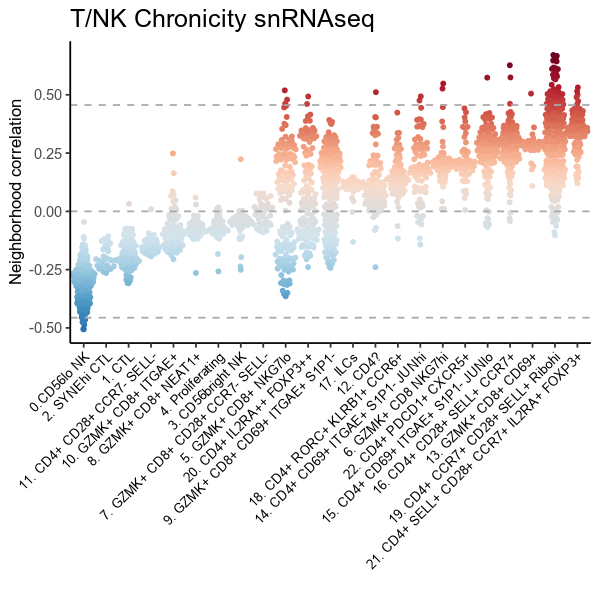

In [26]:
meta <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_chronicity_meta.csv')
meta <- meta %>% select(-annotation) %>% left_join(qcd_meta %>% select(cell, annotation))
kept <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_chronicity.kept.csv')
kept <- kept[, 1]
kept <- which(kept == TRUE)
thresh <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_chronicity.thresh.csv')
ncorr <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_chronicity.ncorrs.csv', check.names = FALSE)
ncorr <- rbind(colnames(ncorr), ncorr)
ncorr <- ncorr[, 1]

thresh30 <- 0.4561717


meta_tmp_1 <- meta
meta_tmp_1$ncorr <- as.numeric(ncorr)


umap <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_chronicity_umap.csv')

meta_tmp_1$UMAP1 <- umap$hUMAP1
meta_tmp_1$UMAP2 <- umap$hUMAP2

meta_tmp_1$ncorr[which(abs(meta_tmp_1$ncorr) < thresh30)] <- NA


sc_umap <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sc_t_nk_chronicity_umap.csv')

fig.size(5, 5)
ggplot(
      data = meta_tmp_1[sample(nrow(meta_tmp_1)),] %>% rename(correlation = ncorr), 
      aes(x = UMAP1, y = UMAP2)) + 
      geom_point(data = qcd_meta %>% filter(dataset == 'scRNAseq'), aes(x = hUMAP1, y = hUMAP2), color = 'black', alpha = 0.1) + 
      geom_point(mapping = aes(color = correlation), alpha = 5, size = 1) + 
      scale_color_gradient2(low = 'blue', mid = 'gray', high = 'red') + 
      labs(x="UMAP1", y="UMAP2") +
      theme_Publication()+
      theme(
        plot.title = element_text(color="black", size=15), # face="bold.italic"
        ) +
      labs(title = "snRNAseq Chronicity - fdr 25%")

pos_fdr_thresh <- thresh30
neg_fdr_thresh <- -1 * thresh30


meta$ncorr <- as.numeric(ncorr)

interval <- c(-max(abs(meta$ncorr)), max(abs(meta$ncorr)))


myPalette <- colorRampPalette(c(RColorBrewer::brewer.pal(11, "RdBu")[11:7], "#DCDCDC", RColorBrewer::brewer.pal(11, "RdBu")[5:1]))

fig.size(5, 5)
ggplot(meta, aes(x = reorder(annotation, ncorr), y = ncorr)) +
    ggbeeswarm::geom_quasirandom(aes(color = ncorr), width = 0.5, size = 1) +
    geom_hline(yintercept = pos_fdr_thresh, linetype = "dashed", color = "darkgrey") +
    geom_hline(yintercept = neg_fdr_thresh, linetype = "dashed", color = "darkgrey") +
    geom_hline(yintercept = 0, linetype = "dashed", color = "darkgrey") +
    scale_colour_gradientn(colours = myPalette(20), limits = interval) +
    labs(title = "T/NK Chronicity snRNAseq", x= "", y = "Neighborhood correlation") +
    theme_classic() +
    theme(
        legend.position = "none",
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=15),
        axis.text.x = element_text(color = "black", size = 8, angle = 45, hjust=1),
        axis.title = element_text(size=10))

In [28]:
sn_med <- meta %>% select(annotation, ncorr) %>% group_by(annotation) %>% summarize(singlenuc = median(ncorr))

Joining, by = "annotation"
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


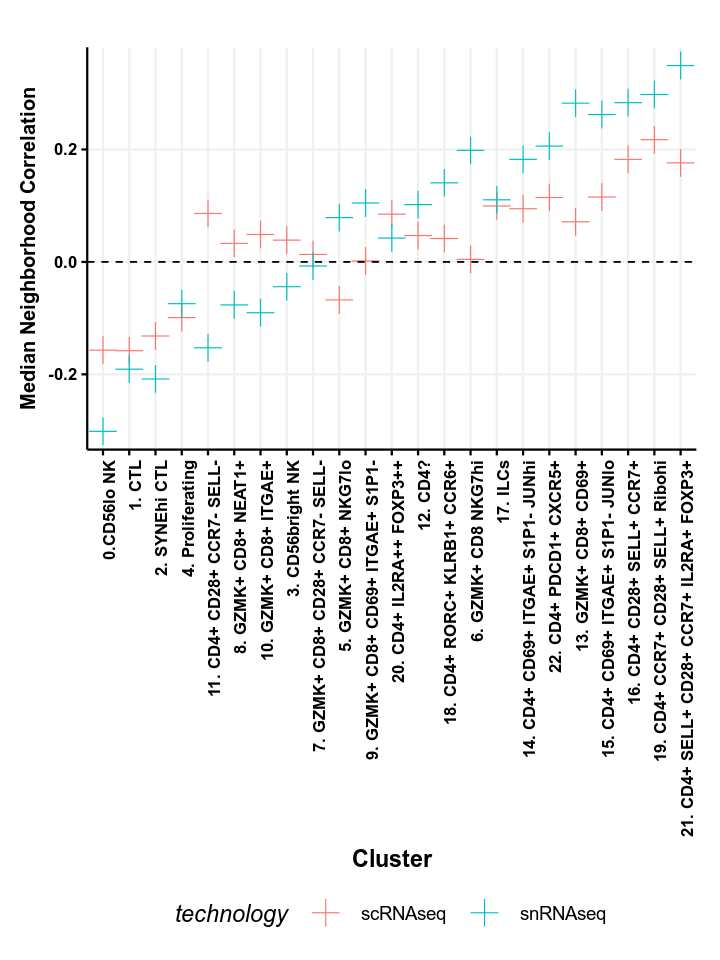

In [46]:
fig.size(8, 6)
ggplot(left_join(sn_med, sc_med) %>% rename(scRNAseq = singlecell, snRNAseq = singlenuc) %>% 
       pivot_longer(cols = c('scRNAseq', 'snRNAseq'), names_to = 'technology'), 
      aes(x = reorder(annotation, value), y = value)) +
    geom_point(aes(color = technology), shape = 3, size = 5) +
    geom_hline(yintercept = 0, linetype = 'dashed') +
    theme_Publication() + 
    theme(axis.title.y = element_text(size = 12), 
          axis.text.y = element_text(size = 10, face = 'bold'),
        axis.text.x = element_text(color = "black", size = 10, angle = 90, hjust=1, face = 'bold')) + 
    labs(x = 'Cluster', y = 'Median Neighborhood Correlation')

In [31]:
left_join(sn_med, sc_med) %>% 
       pivot_longer(cols = c('singlecell', 'singlenuc'), names_to = 'technology')

Joining, by = "annotation"


annotation,technology,value
<chr>,<chr>,<dbl>
0.CD56lo NK,singlecell,-0.156996668
0.CD56lo NK,singlenuc,-0.301382964
1. CTL,singlecell,-0.157978116
1. CTL,singlenuc,-0.190829517
10. GZMK+ CD8+ ITGAE+,singlecell,0.048763660
10. GZMK+ CD8+ ITGAE+,singlenuc,-0.090433602
11. CD4+ CD28+ CCR7- SELL-,singlecell,0.086220063
11. CD4+ CD28+ CCR7- SELL-,singlenuc,-0.152815430
12. CD4?,singlecell,0.046951866


In [182]:
all_thresh <- read.csv("/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_chronicity.fdrs.csv")

In [208]:
all_thresh

X1.677101907079417420e.01,X6.389939965694682034e.01,X1.166000000000000000e.03
<dbl>,<dbl>,<dbl>
0.1693873,0.6328477,1162
0.1710644,0.6308148,1150
0.1727415,0.6268179,1142
0.1744186,0.6239620,1132
0.1760957,0.6199137,1124
0.1777728,0.6188398,1111
0.1794499,0.6141096,1104
0.1811270,0.6123645,1092
0.1828041,0.6076608,1085


#### Single Dataset

In [198]:
meta <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_chronicity_meta.csv')
meta <- meta %>% select(-annotation) %>% left_join(qcd_meta %>% select(cell,annotation))
kept <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_chronicity_singledataset.kept.csv')
kept <- kept[, 1]
kept <- which(kept == TRUE)
#thresh <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_chronicity_singledataset.thresh.csv')
ncorr <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/cna/t_nk/sn_t_nk_chronicity_singledataset.ncorrs.csv')
ncorr <- rbind(colnames(ncorr), ncorr)
ncorr <- ncorr[, 1]

Joining, by = "cell"


Joining, by = c("cell", "hUMAP1", "hUMAP2")
Warning message in eval(expr, envir, enclos):
“NAs introduced by coercion”
Warning message:
“Removed 1 rows containing missing values (position_quasirandom).”


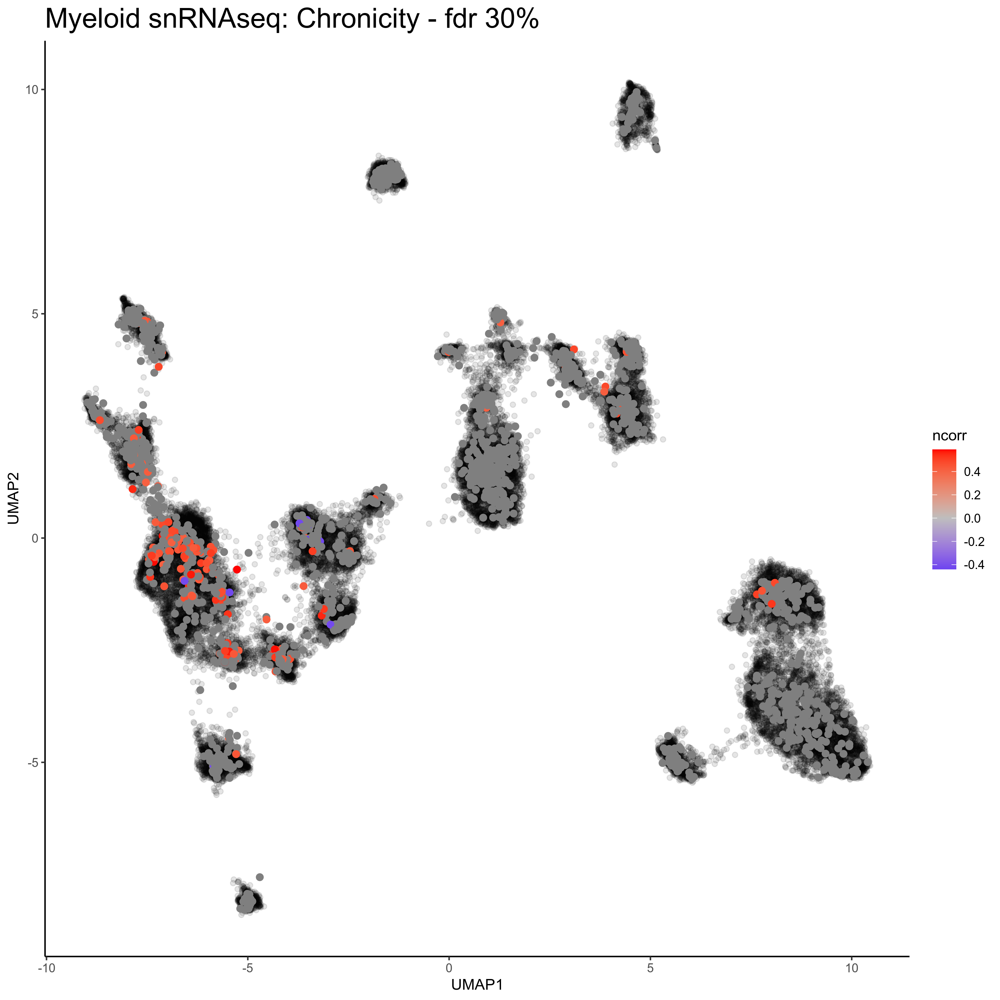

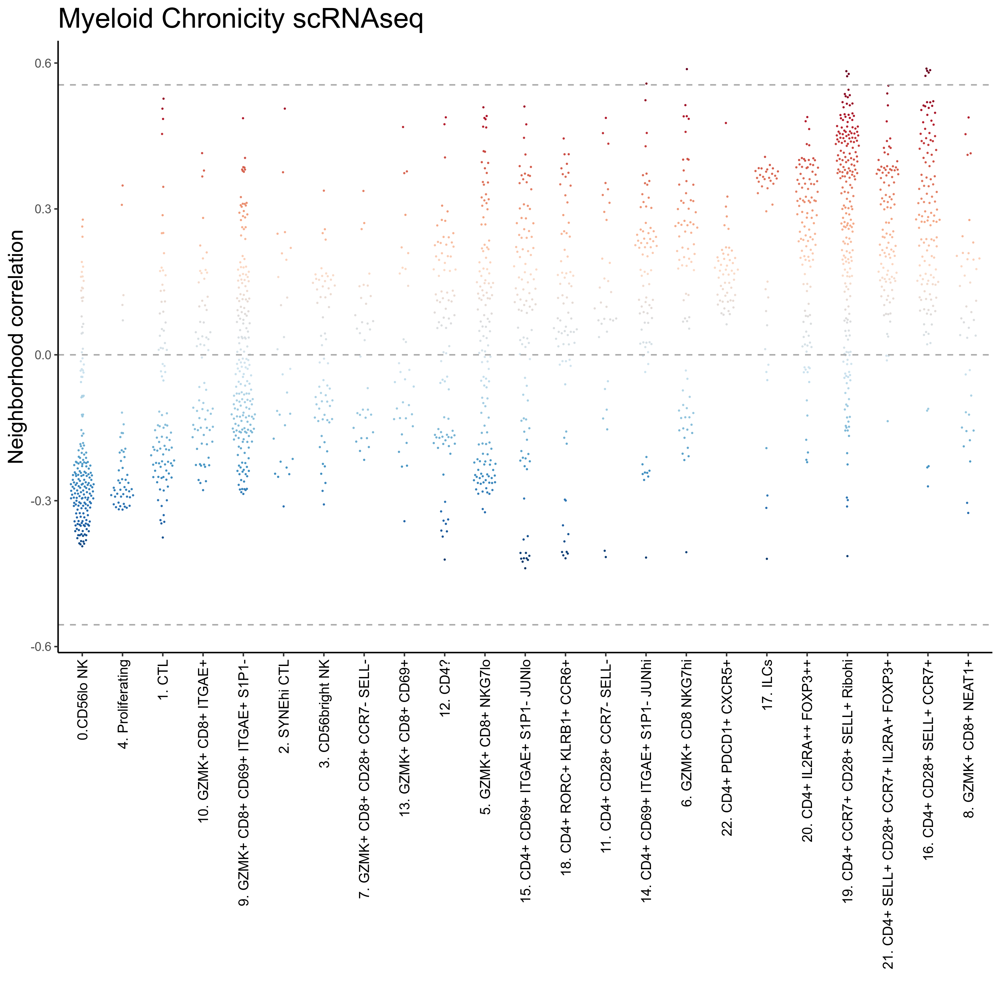

In [202]:
meta <- left_join(meta, qcd_meta %>% select(cell, hUMAP1, hUMAP2))
meta$ncorr <- as.numeric(ncorr)

thresh30 <- 0.410528	
meta_tmp_1 <- meta
meta_tmp_1$ncorr[which(abs(meta_tmp_1$ncorr) < thresh30)] <- NA


ggplot(
      data = meta_tmp_1[sample(nrow(meta_tmp_1)),], 
      aes(x = hUMAP1, y = hUMAP2)) + 
      geom_point(data = qcd_meta %>% filter(dataset == 'scRNAseq'), aes(x = hUMAP1, y = hUMAP2), color = 'black', alpha = 0.1) + 
      geom_point(mapping = aes(color = ncorr), alpha = 5, size = 2) + 
      scale_color_gradient2(low = 'blue', mid = 'gray', high = 'red') + 
      labs(x="UMAP1", y="UMAP2") +
      theme_classic()+
      theme(
        plot.title = element_text(color="black", size=20), # face="bold.italic"
        ) +
      labs(title = "Myeloid snRNAseq: Chronicity - fdr 30%")


pos_fdr_thres <- thresh30
neg_fdr_thresh <- -1 * thresh30


interval <- c(-max(abs(meta$ncorr)), max(abs(meta$ncorr)))


myPalette <- colorRampPalette(c(RColorBrewer::brewer.pal(11, "RdBu")[11:7], "#DCDCDC", RColorBrewer::brewer.pal(11, "RdBu")[5:1]))
fig.size(10, 10)

ggplot(meta, aes(x = reorder(annotation, ncorr), y = ncorr)) +
    ggbeeswarm::geom_quasirandom(aes(color = ncorr), width = 0.3, size = 0.1) +
    geom_hline(yintercept = thresh10, linetype = "dashed", color = "darkgrey") +
    geom_hline(yintercept = -1 * thresh10, linetype = "dashed", color = "darkgrey") +
    geom_hline(yintercept = 0, linetype = "dashed", color = "darkgrey") +
    scale_colour_gradientn(colours = myPalette(100), limits = interval) +
    labs(title = "Myeloid Chronicity scRNAseq", x= "", y = "Neighborhood correlation") +
    theme_classic() +
    theme(
        legend.position = "none",
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=20),
        axis.text.x = element_text(color = "black", size = 10, angle = 90, vjust = 0.5, hjust=1),
        axis.title=element_text(size=15)) 

## Cell State Proportions

In [1]:
qcd_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_meta_harmonizedPCUMAPclusters_annotations09212022.rds')

In [276]:
cell_states <- qcd_meta %>% group_by(dataset, annotation, new_cluster_number) %>% 
                select(dataset, annotation) %>% tally() %>% ungroup() %>%
                group_by(dataset) %>% mutate(prop = n / sum(n)) %>% select(-n) %>% pivot_wider(values_from = prop, names_from = dataset)

Adding missing grouping variables: `new_cluster_number`


In [280]:
cell_states <- cell_states[order(cell_states$new_cluster_number), ]

In [306]:
cell_states

annotation,new_cluster_number,scRNAseq,snRNAseq
<chr>,<int>,<dbl>,<dbl>
0.CD56lo NK,0,0.133209709,0.09383810
1. CTL,1,0.065677673,0.04430125
2. SYNEhi CTL,2,0.010655670,0.01288764
3. CD56bright NK,3,0.030555479,0.02819170
4. Proliferating,4,0.023691567,0.02335884
5. GZMK+ CD8+ NKG7lo,5,0.074285240,0.06484092
6. GZMK+ CD8 NKG7hi,6,0.027344939,0.03544100
7. GZMK+ CD8+ CD28+ CCR7- SELL-,7,0.013091251,0.01772050
8. GZMK+ CD8+ NEAT1+,8,0.008109380,0.02053967


Warning message:
“Use of `cell_states$annotation` is discouraged. Use `annotation` instead.”


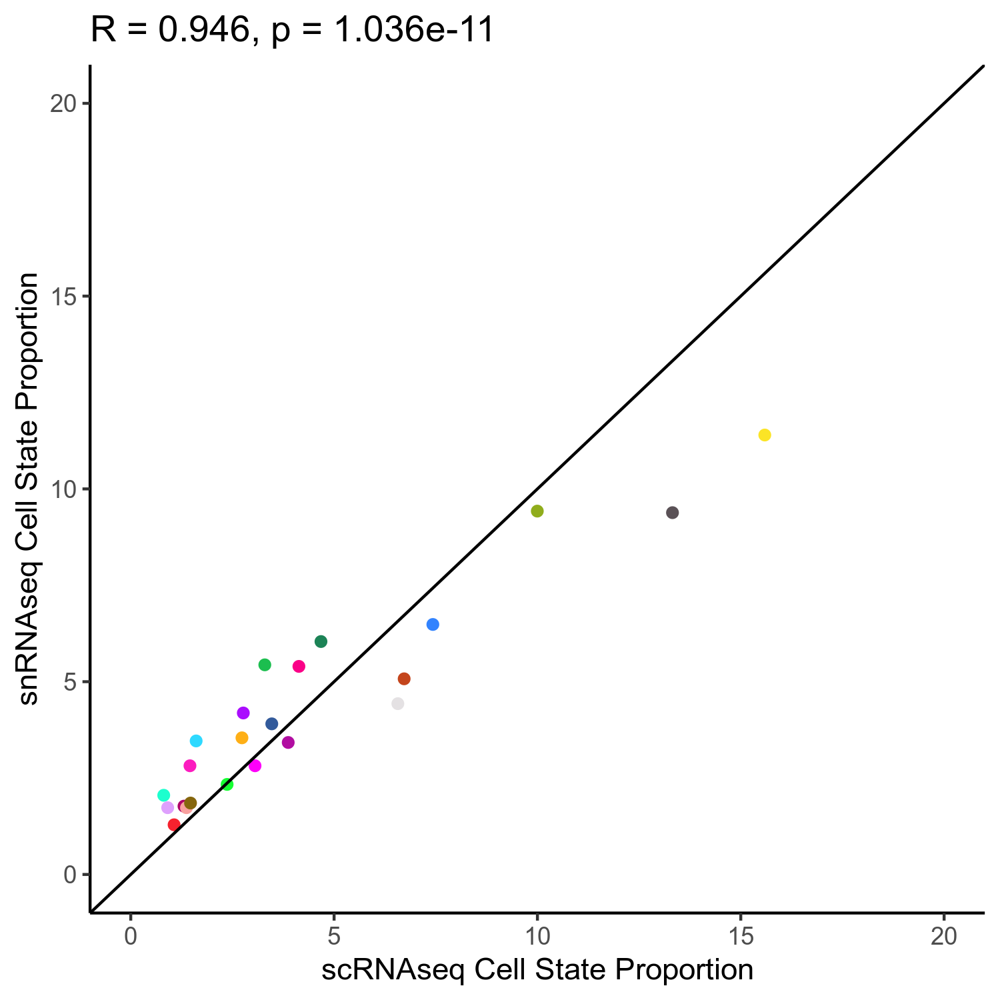

In [314]:
ggplot(cell_states, aes(x = scRNAseq * 100 , y = snRNAseq * 100, color = factor(annotation, levels = cell_states$annotation))) + 
    geom_point() + 
    geom_abline() + 
    scale_x_continuous(limits = c(0, 20)) + 
    scale_y_continuous(limits = c(0, 20)) + 
    theme_classic() +
    scale_color_manual(values = as.vector(polychrome(28))) +
    theme(legend.position = 'none') +
    labs(x = 'scRNAseq Cell State Proportion', y = 'snRNAseq Cell State Proportion', title = 'R = 0.946, p = 1.036e-11')

In [305]:
cor.test(cell_states$scRNAseq, cell_states$snRNAseq)


	Pearson's product-moment correlation

data:  cell_states$scRNAseq and cell_states$snRNAseq
t = 13.321, df = 21, p-value = 1.036e-11
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.8741351 0.9769977
sample estimates:
      cor 
0.9456135 


In [2]:
qcd_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_meta_harmonizedPCUMAPclusters_annotations09212022.rds')

In [5]:
paste0('T', unique(qcd_meta$annotation))

[1] "T19. CD4+ CCR7+ CD28+ SELL+ Ribohi"       
 [2] "T1. CTL"                                  
 [3] "T6. GZMK+ CD8 NKG7hi"                     
 [4] "T20. CD4+ IL2RA++ FOXP3++"                
 [5] "T13. GZMK+ CD8+ CD69+"                    
 [6] "T12. CD4?"                                
 [7] "T14. CD4+ CD69+ ITGAE+ S1P1- JUNhi"       
 [8] "T16. CD4+ CD28+ SELL+ CCR7+"              
 [9] "T15. CD4+ CD69+ ITGAE+ S1P1- JUNlo"       
[10] "T17. ILCs"                                
[11] "T3. CD56bright NK"                        
[12] "T10. GZMK+ CD8+ ITGAE+"                   
[13] "T18. CD4+ RORC+ KLRB1+ CCR6+"             
[14] "T7. GZMK+ CD8+ CD28+ CCR7- SELL-"         
[15] "T0.CD56lo NK"                             
[16] "T21. CD4+ SELL+ CD28+ CCR7+ IL2RA+ FOXP3+"
[17] "T9. GZMK+ CD8+ CD69+ ITGAE+ S1P1-"        
[18] "T5. GZMK+ CD8+ NKG7lo"                    
[19] "T11. CD4+ CD28+ CCR7- SELL-"              
[20] "T4. Proliferating"                        
[21] "T2. SYNEhi CTL"                           
[22] "T22. CD4+ PDCD1+ CXCR5+"                  
[23] "T8. GZMK+ CD8+ NEAT1+"

In [14]:
overlapping_meta <- qcd_meta %>%  mutate(individual = str_split(sample, '_')) %>% 
                                    rowwise() %>% 
                                    mutate(individual = unlist(individual)[3]) %>% 
                                    group_by(individual, dataset, annotation) %>% 
                                    tally() %>% pivot_wider(names_from = 'annotation', values_from = 'n') 
overlapping_meta[is.na(overlapping_meta)] <- 0
overlapping_meta <- overlapping_meta %>% pivot_longer(cols = unique(qcd_meta$annotation),
                                                           names_to = 'annotation') %>%
                                        pivot_wider(names_from = 'dataset', values_from = 'value') %>%
                                ungroup() %>% group_by(individual) %>% filter(sum(scRNAseq) > 40, sum(snRNAseq) > 40) %>%
                                    mutate(snRNAseq = (snRNAseq / sum(snRNAseq)), 
                                           scRNAseq = (scRNAseq / sum(scRNAseq))) 

In [23]:
correlations

correlations,clusters,prop
<dbl>,<chr>,<dbl>
0.44520276,19. CD4+ CCR7+ CD28+ SELL+ Ribohi,0.153208681
0.73012649,1. CTL,0.064303103
0.16664217,6. GZMK+ CD8 NKG7hi,0.027865541
0.44516858,20. CD4+ IL2RA++ FOXP3++,0.034339877
0.61387267,13. GZMK+ CD8+ CD69+,0.013932770
-0.09868992,12. CD4?,0.028590667
0.12217043,14. CD4+ CD69+ ITGAE+ S1P1- JUNhi,0.034961413
0.36402057,16. CD4+ CD28+ SELL+ CCR7+,0.047651111
0.38109369,15. CD4+ CD69+ ITGAE+ S1P1- JUNlo,0.066167711


`geom_smooth()` using formula 'y ~ x'



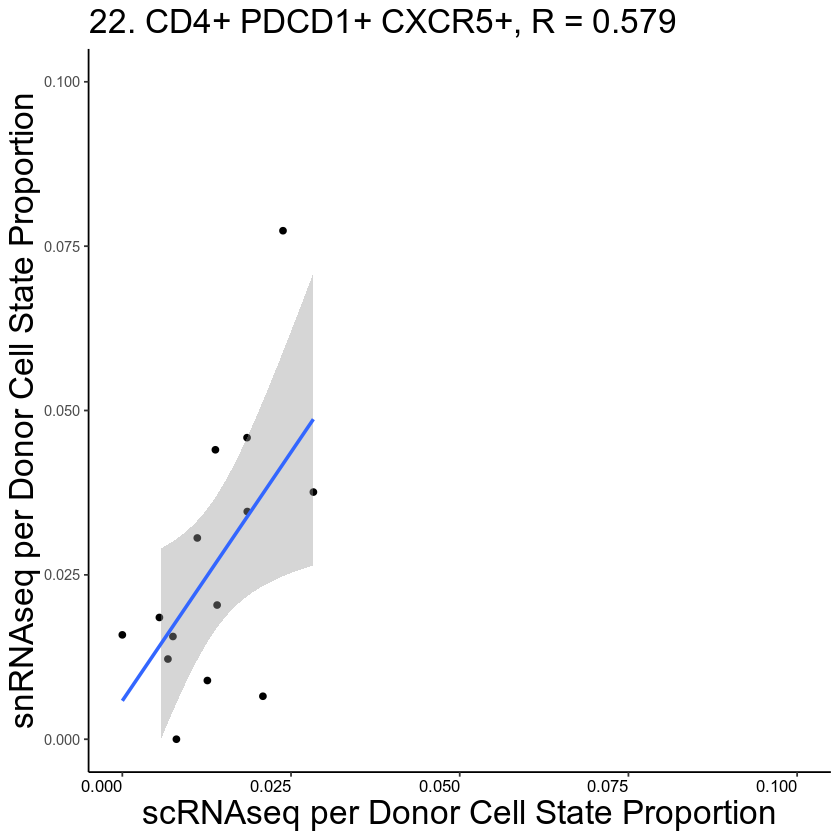

In [171]:
ggplot(overlapping_meta %>% filter(annotation == '22. CD4+ PDCD1+ CXCR5+'), aes(x = scRNAseq, y = snRNAseq)) + 
    geom_point() + 
    scale_color_manual(values = as.vector(polychrome(28))) +
    theme_classic() + 
    geom_smooth(method = 'lm') + 
    scale_x_continuous(limits = c(0, 0.1)) + 
    scale_y_continuous(limits = c(0, 0.1)) + 
    labs(x = 'scRNAseq per Donor Cell State Proportion', y = 'snRNAseq per Donor Cell State Proportion', title = '22. CD4+ PDCD1+ CXCR5+, R = 0.579') + 
    theme(
        legend.position = "none",
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=20),
        axis.text.x = element_text(color = "black", size = 10, hjust=1),
        axis.title = element_text(size=20)) 


In [45]:
overlapping_meta$individual %>% unique() %>% length()

[1] 8

In [15]:
correlations <- vector()
clusters <- vector()
for (i in overlapping_meta %>% pull(annotation) %>% unique()) {
correlations <- c(correlations, cor(overlapping_meta %>% 
        filter(annotation == i) %>% pull(snRNAseq),
        overlapping_meta %>% 
        filter(annotation == i) %>% pull(scRNAseq))) 
clusters <- c(clusters, i)}

In [16]:
correlations <- data.frame(correlations, clusters = clusters)

In [17]:
correlations$clusters

[1] "19. CD4+ CCR7+ CD28+ SELL+ Ribohi"       
 [2] "1. CTL"                                  
 [3] "6. GZMK+ CD8 NKG7hi"                     
 [4] "20. CD4+ IL2RA++ FOXP3++"                
 [5] "13. GZMK+ CD8+ CD69+"                    
 [6] "12. CD4?"                                
 [7] "14. CD4+ CD69+ ITGAE+ S1P1- JUNhi"       
 [8] "16. CD4+ CD28+ SELL+ CCR7+"              
 [9] "15. CD4+ CD69+ ITGAE+ S1P1- JUNlo"       
[10] "17. ILCs"                                
[11] "3. CD56bright NK"                        
[12] "10. GZMK+ CD8+ ITGAE+"                   
[13] "18. CD4+ RORC+ KLRB1+ CCR6+"             
[14] "7. GZMK+ CD8+ CD28+ CCR7- SELL-"         
[15] "0.CD56lo NK"                             
[16] "21. CD4+ SELL+ CD28+ CCR7+ IL2RA+ FOXP3+"
[17] "9. GZMK+ CD8+ CD69+ ITGAE+ S1P1-"        
[18] "5. GZMK+ CD8+ NKG7lo"                    
[19] "11. CD4+ CD28+ CCR7- SELL-"              
[20] "4. Proliferating"                        
[21] "2. SYNEhi CTL"                           
[22] "22. CD4+ PDCD1+ CXCR5+"                  
[23] "8. GZMK+ CD8+ NEAT1+"

In [18]:
cell_number <- vector() 
for (i in correlations$cluster) {
    cell_number <- c(cell_number, qcd_meta %>% group_by(annotation) %>% tally() %>% mutate(prop = n / sum(n)) %>% filter(annotation == i) %>% pull(prop))
}

In [19]:
correlations$prop <- cell_number

In [49]:
correlations$ncells <- cell_number

In [20]:
annot_levels <- c('0.CD56lo NK', '1. CTL', '2. SYNEhi CTL', '3. CD56bright NK', '4. Proliferating', '5. GZMK+ CD8+ NKG7lo',
              '6. GZMK+ CD8 NKG7hi', '7. GZMK+ CD8+ CD28+ CCR7- SELL-', '8. GZMK+ CD8+ NEAT1+', '9. GZMK+ CD8+ CD69+ ITGAE+ S1P1-', 
              '10. GZMK+ CD8+ ITGAE+', '11. CD4+ CD28+ CCR7- SELL-', '12. CD4?', '13. GZMK+ CD8+ CD69+', 
              '14. CD4+ CD69+ ITGAE+ S1P1- JUNhi', '15. CD4+ CD69+ ITGAE+ S1P1- JUNlo', 
              '16. CD4+ CD28+ SELL+ CCR7+', '17. ILCs', '18. CD4+ RORC+ KLRB1+ CCR6+', '19. CD4+ CCR7+ CD28+ SELL+ Ribohi',
              '20. CD4+ IL2RA++ FOXP3++', '21. CD4+ SELL+ CD28+ CCR7+ IL2RA+ FOXP3+', '22. CD4+ PDCD1+ CXCR5+')

`geom_smooth()` using formula 'y ~ x'



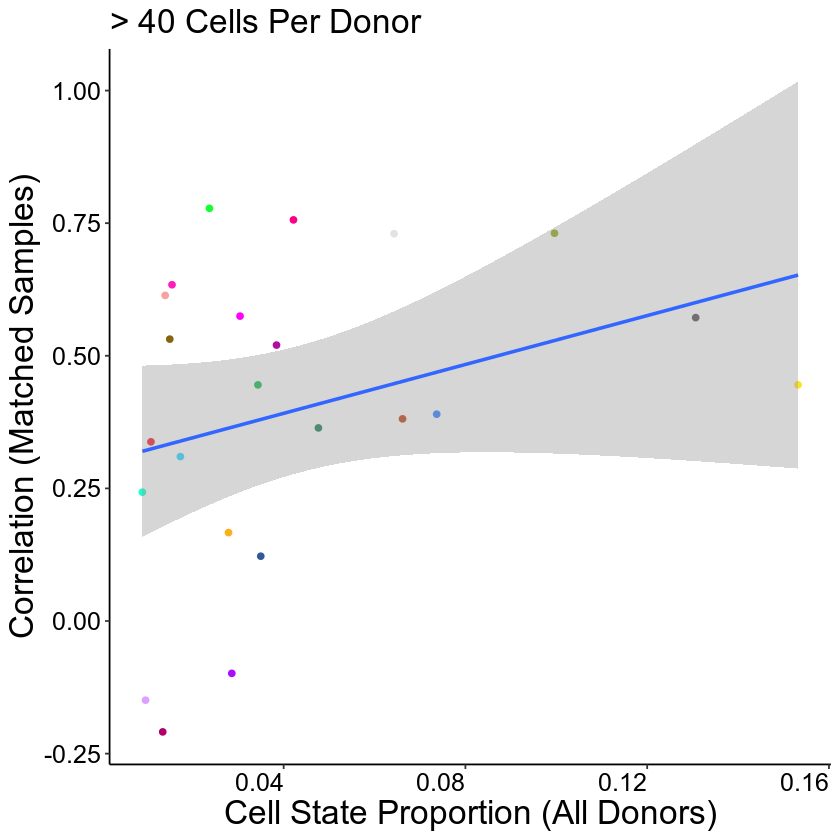

In [21]:
ggplot(correlations, aes(x = prop, y = correlations)) +
    geom_point(aes(color = factor(clusters, levels = annot_levels))) + 
    theme_classic() + 
    geom_smooth(method = 'lm') +
    scale_color_manual(values = as.vector(polychrome(28))) +
    labs(x = 'Cell State Proportion (All Donors)', y = 'Correlation (Matched Samples)',
         title = '> 40 Cells Per Donor') +
        theme(
        legend.position = "none",
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=20),
        axis.text = element_text(color = "black", size = 15,vjust = 0.5, hjust=1),
        axis.title=element_text(size=20)) 

## sc sn QQ NORM

In [15]:
qcd_meta <- readRDS('/data/srlab/ssg34/SLE_kidney_v2/data/qcd/T_NK_clusterQCd_meta_harmonizedPCUMAPclusters_annotations09212022.rds')

In [126]:
theme_Publication <- function(base_size=14, base_family="sans") {
      library(grid)
      library(ggthemes)
      (theme_foundation(base_size=base_size, base_family=base_family)
       + theme(plot.title = element_text(face = "bold",
                                         size = rel(1.2), hjust = 0.5),
               text = element_text(),
               panel.background = element_rect(colour = NA),
               plot.background = element_rect(colour = NA),
               panel.border = element_rect(colour = NA),
               axis.title = element_text(face = "bold",size = rel(1)),
               axis.title.y = element_text(angle=90,vjust =2),
               axis.title.x = element_text(vjust = -0.2),
               axis.text = element_text(size = 15), 
               axis.line.x = element_line(colour="black"),
               axis.line.y = element_line(colour="black"),
               axis.ticks = element_line(),
               panel.grid.major = element_line(colour="#f0f0f0"),
               panel.grid.minor = element_blank(),
               legend.key = element_rect(colour = NA),
               legend.position = "bottom",
               legend.direction = "horizontal",
               legend.key.size= unit(1, "cm"),
               legend.margin = unit(0, "cm"),
               legend.title = element_text(face="italic"),
               plot.margin=unit(c(10,5,5,5),"mm"),
               strip.background=element_rect(colour="#f0f0f0",fill="#f0f0f0"),
               strip.text = element_text(face="bold")
       ))
      
}

In [17]:
qcd_meta %>% filter(dataset == 'snRNAseq') %>% select(sample, Type) %>% pull(Type) %>% table()

.
Control      LN 
     25    2458 

In [18]:
meta_details <- data.frame(sc_samples = c(151, 28), c(35187, 944), c(39, 9), c(2458, 25))

In [11]:
meta_details <-  data.frame(    Samples = c(151, 39, 28, 9), 
                                Cells = c(35187, 2458, 944, 25),
                                Status = c('Case', 'Case', 'Control', 'Control'), 
                                Technology = c('scRNAseq', 'snRNAseq', 
                                   'scRNAseq', 'snRNAseq'))

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”
Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


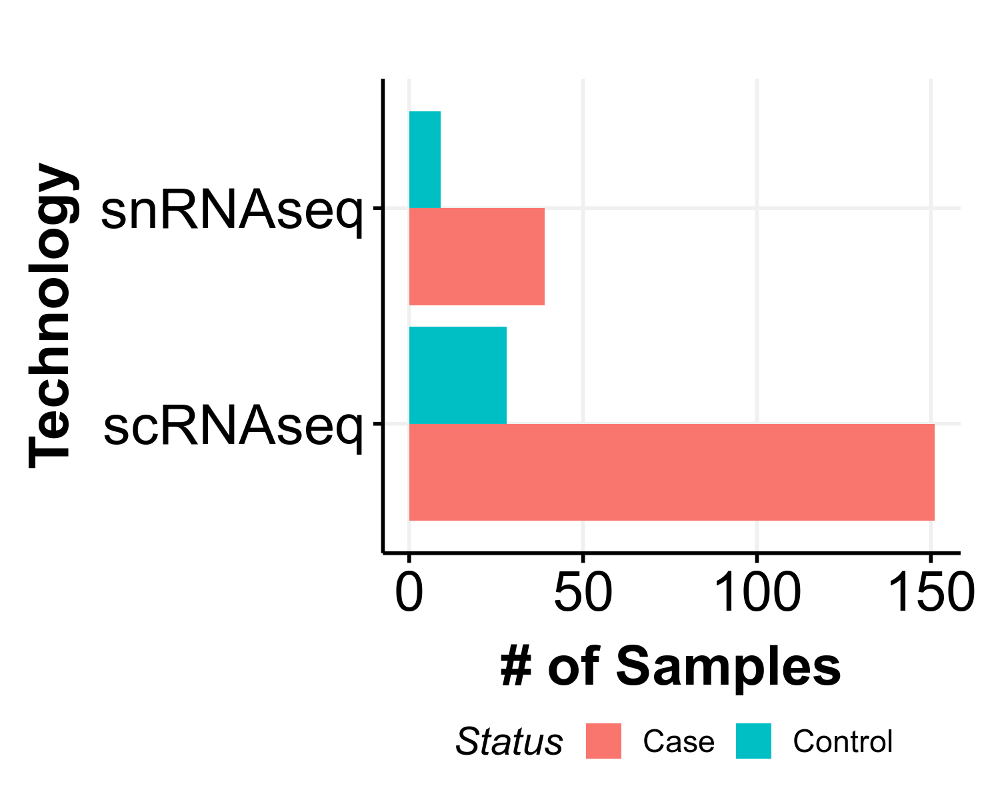

Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


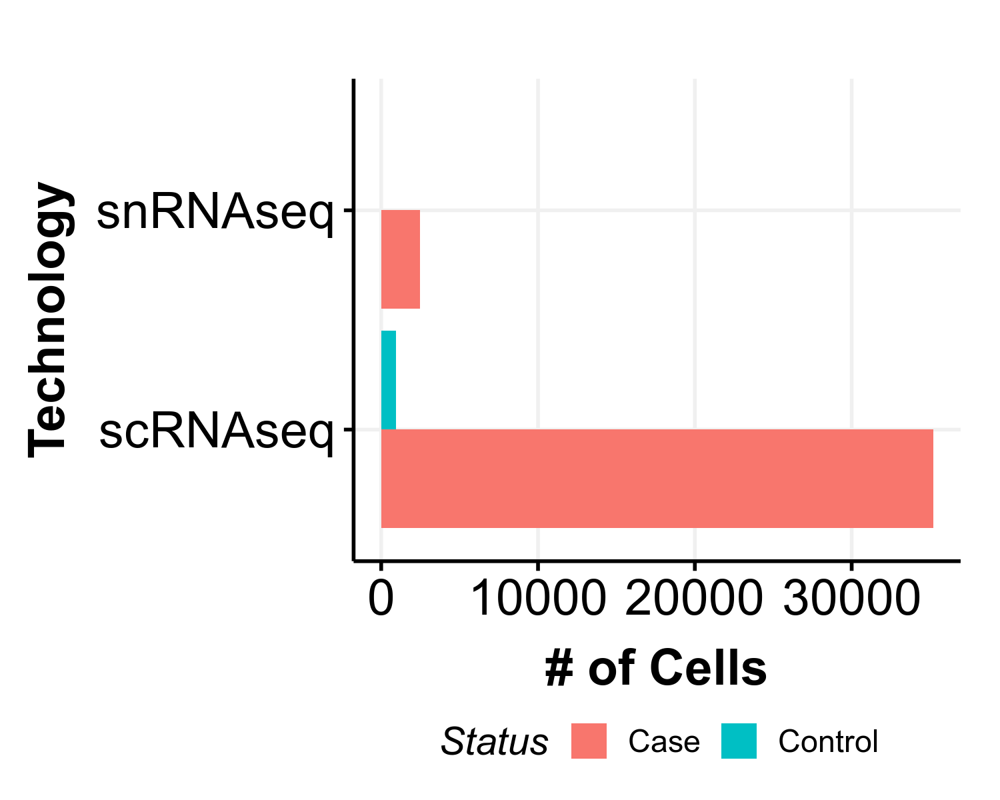

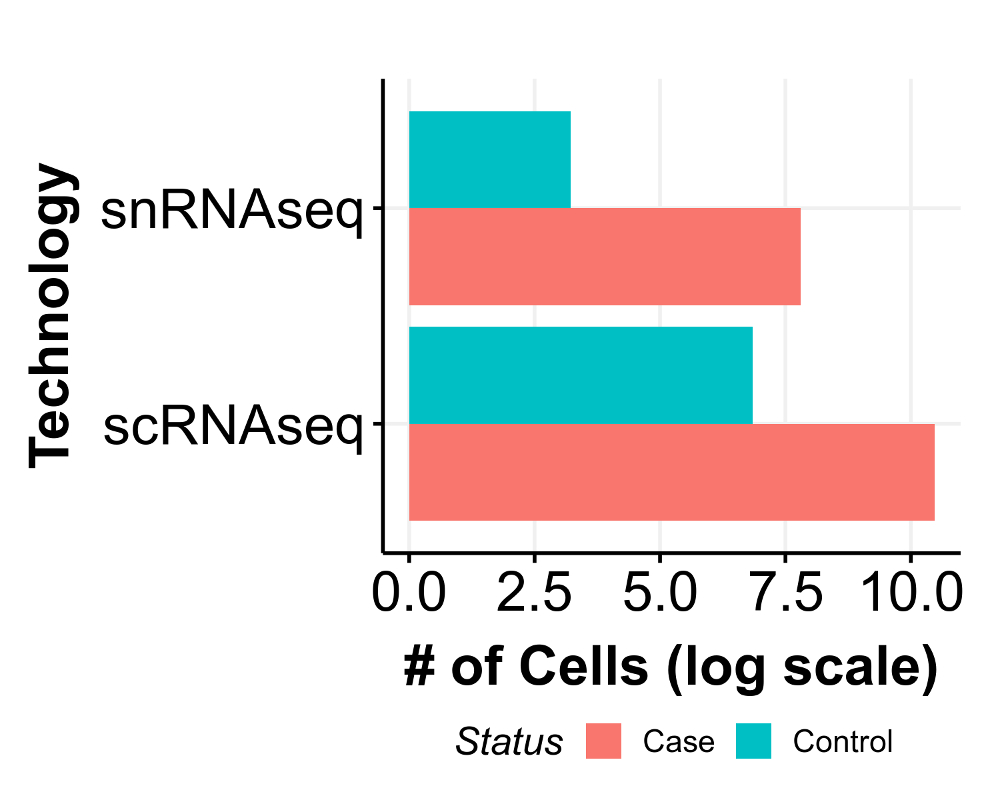

In [351]:
ggplot(meta_details, aes(y = Technology, x = Samples, fill = Status)) + 
    geom_col(position = 'dodge') + 
    theme_Publication() +
    labs(x = '# of Samples') +
    theme(axis.title = element_text(size = 20),
          axis.text = element_text(size = 20))
ggplot(meta_details, aes(y = Technology, x = Cells, fill = Status)) + 
    geom_col(position = 'dodge') + 
    theme_Publication() +
    labs(x = '# of Cells') +
    theme(axis.title = element_text(size = 18),
          axis.text = element_text(size = 18))

ggplot(meta_details, aes(y = Technology, x = log(Cells), fill = Status)) + 
    geom_col(position = 'dodge') + 
    theme_Publication() +
    labs(x = '# of Cells (log scale)') +
    theme(axis.title = element_text(size = 20),
          axis.text = element_text(size = 20))

In [17]:
pb_sn <- data.frame(nrow = 213)
clusters <- vector()
for (i in 0:22) {
    cluster_pb <-  rowMeans(qcd_norm[var_genes[!var_genes %in% genes_exclude], qcd_meta %>% filter(dataset == 'snRNAseq', 
                                                                    new_cluster_number == i) %>% pull(cell)])
    pb_sn <- cbind(pb_sn, cluster_pb)
}

In [18]:
pb_sc <- data.frame(nrow = 213)
clusters <- vector()
for (i in 0:22) {
    cluster_pb <-  rowMeans(qcd_norm[var_genes[!var_genes %in% genes_exclude], qcd_meta %>% filter(dataset == 'scRNAseq', 
                                                                    new_cluster_number == i) %>% pull(cell)])
    pb_sc <- cbind(pb_sc, cluster_pb)
}

In [19]:
pb_sn <- pb_sn[, 2:ncol(pb_sn)]
pb_sc <- pb_sc[, 2:ncol(pb_sc)]

In [20]:
qq_ratios <- data.frame(nrow = 213)
index_to_mean <- function(my_index, my_mean){
  return(my_mean[my_index])
}
for (i in 1:ncol(pb_sn)) {
    df <- data.frame(singlenuc = pb_sn[, i], singlecell = pb_sc[, i])
    df_rank <- apply(df,2,rank,ties.method="first")
    df_sort <- data.frame(apply(df, 2, sort))
    df_mean <- apply(df_sort, 1, mean)
    df_final <- apply(df_rank, 2, index_to_mean, my_mean=df_mean)
    cluster_qq_ratio <- df_final[, 1] / df_final[, 2]
    qq_ratios <- cbind(qq_ratios, cluster_qq_ratio)
}

In [21]:
qq_ratios <- qq_ratios[, 2:24]

In [227]:
quantile(as.matrix(qq_ratios), c(0.1, 0.96))

10%          96% 
  0.04466963 221.32374205

In [23]:
colnames(qq_ratios) <- paste0('Cluster', 0:22)

In [ ]:
rownames(qq_ratios) <- rownames(pb_sn)

In [26]:
tcell_activation_go <- read.csv('/data/srlab/ssg34/SLE_kidney_v2/data/GO_TCELL_ACTIVATION.csv')

In [29]:
qq_ratios[rownames(qq_ratios) %in% tcell_activation_go$Symbol, ]

Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”
Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
“number of rows of result is not a multiple of vector length (arg 2)”


Cluster0,Cluster1,Cluster2,Cluster3,Cluster4,Cluster5,Cluster6,Cluster7,Cluster8,Cluster9,⋯,Cluster13,Cluster14,Cluster15,Cluster16,Cluster17,Cluster18,Cluster19,Cluster20,Cluster21,Cluster22
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>


In [36]:
go_ratios <- qq_ratios[rownames(qq_ratios) %in% toupper(tcell_activation_go$Symbol), ]

In [48]:
sc_favored <- vector()
sn_favored <- vector()
for (i in 1:nrow(go_ratios)) {
    if (all(go_ratios[i, ] < 1)) {
        sc_favored <- c(sc_favored, rownames(go_ratios)[i])
    }
    else if (isTRUE(all(go_ratios[i, ] > 1))) {
        sn_favored <- c(sn_favored, rownames(go_ratios)[i])
    }

}

In [221]:
sc_genes <- names(sort(rowMeans(qq_ratios[sc_favored, ]))[c(1, 2, 3, 4, 5, 6, 7, 8, 10 ,11, 12)])
sn_genes <- names(sort(rowMeans(qq_ratios[sn_favored, ]))[17:27])

In [225]:
go_matrix <- go_ratios[c(sc_genes, sn_genes), ]

In [226]:
log_go_matrix <- log(go_matrix)
log_go_matrix[log_go_matrix == -Inf] <- NA 

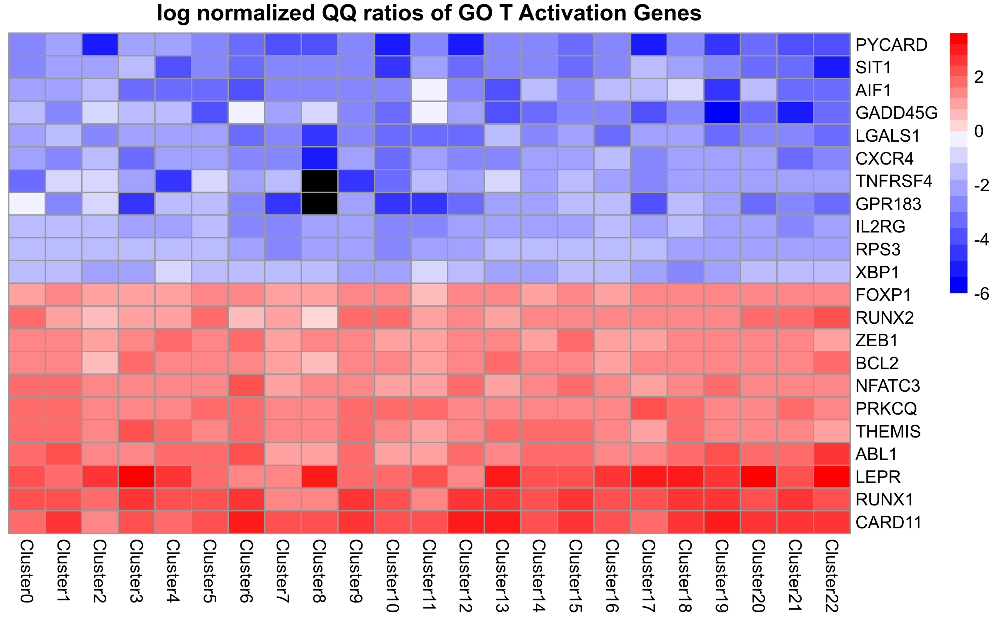

In [240]:
fig.size(5, 8)
pheatmap(log_go_matrix, cluster_rows = FALSE, 
                         cluster_cols = FALSE, 
                         na_col = 'black',
                         color=colorRampPalette(c("blue", "white", "red"))(20), 
                         breaks = c(seq(-6, 0, 0.6), seq(0.001, 4, 0.4)),
                         main = 'log normalized QQ ratios of GO T Activation Genes')

In [105]:
cluster_balance <- qcd_meta %>% select(new_cluster_number, annotation, dataset) %>% 
                        group_by(new_cluster_number, annotation, dataset) %>% tally() %>% 
                        pivot_wider(names_from = dataset, values_from = n) %>% 
                        mutate(total = scRNAseq + snRNAseq, scRNAseq = scRNAseq / total, snRNAseq = snRNAseq / total) %>% 
                        pivot_longer(cols = c(scRNAseq, snRNAseq))

In [143]:
qcd_meta %>% select(dataset) %>% table() %>% prop.table()

.
 scRNAseq  snRNAseq 
0.9356969 0.0643031 

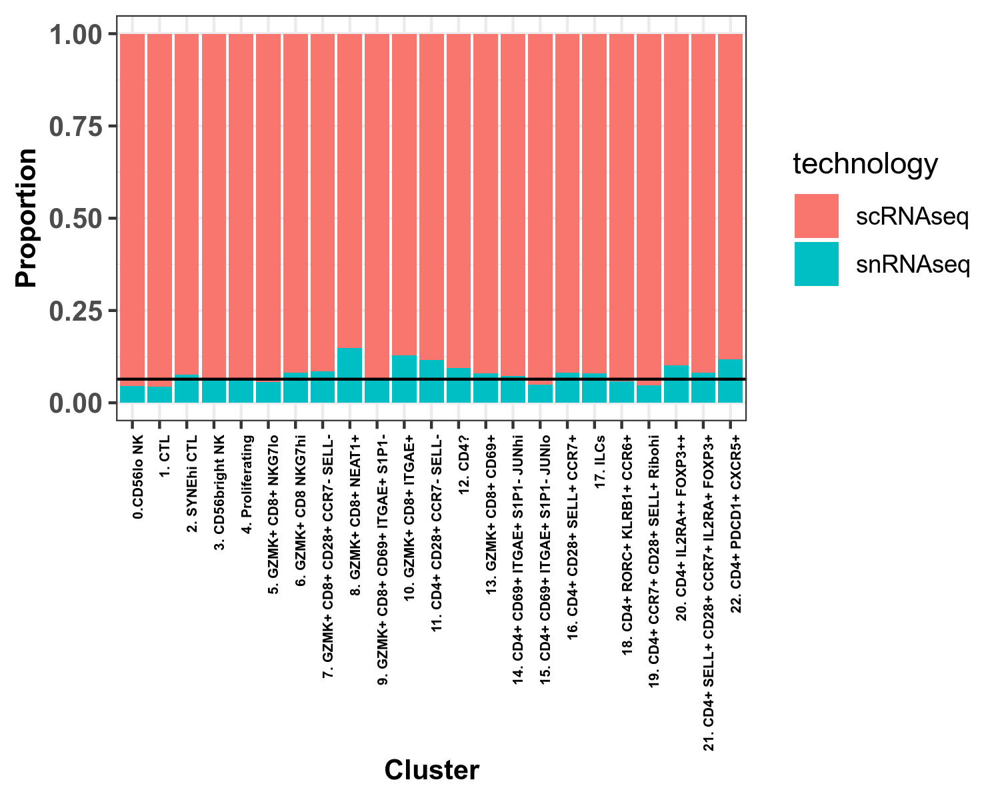

In [349]:
fig.size(4, 5)
ggplot(cluster_balance %>% rename(technology = name),  
           aes(x = annotation, y = value, fill = technology)) + 
    geom_bar(stat = 'identity') + 
    scale_x_discrete(limits = unique(cluster_balance$annotation)) + 
    theme_bw() + 
    geom_hline(yintercept = 0.064) + 
    labs(x = 'Cluster', y = 'Proportion') +
    theme(axis.title = element_text(size = 10, face = 'bold'), 
          axis.text.y = element_text(size = 10, face = 'bold'),
          axis.text.x = element_text(color = "black", size = 5, 
                                       angle = 90, hjust=1, face = 'bold'))

In [228]:
pb_sc_genes <- rowMeans(qcd_norm[var_genes[!var_genes %in% genes_exclude], qcd_meta %>% filter(dataset == 'scRNAseq') %>% pull(cell)])

In [229]:
pb_sn_genes <- rowMeans(qcd_norm[var_genes[!var_genes %in% genes_exclude], qcd_meta %>% filter(dataset == 'snRNAseq') %>% pull(cell)])

In [230]:
qq_ratios <- data.frame(nrow = 213)
index_to_mean <- function(my_index, my_mean){
  return(my_mean[my_index])
}


    df <- data.frame(singlenuc = pb_sn_genes, singlecell = pb_sc_genes)
    df_rank <- apply(df,2,rank,ties.method="first")
    df_sort <- data.frame(apply(df, 2, sort))
    df_mean <- apply(df_sort, 1, mean)
    df_final <- apply(df_rank, 2, index_to_mean, my_mean=df_mean)
    cluster_qq_ratio <- df_final[, 1] / df_final[, 2]
    qq_ratios <- cbind(qq_ratios, cluster_qq_ratio)


In [1]:
df_final

ERROR: Error in eval(expr, envir, enclos): object 'df_final' not found


In [231]:
log_cluster_qq_ratio$gene <- rownames(log_cluster_qq_ratio)

In [232]:
rownames(qq_ratios) <- names(pb_sn_genes)

In [233]:
log_cluster_qq_ratio <- log(qq_ratios[rownames(log_go_matrix), ] %>% select(cluster_qq_ratio))

In [238]:
log_cluster_qq_ratio$gene <- rownames(log_cluster_qq_ratio)

In [239]:
log_cluster_qq_ratio

,cluster_qq_ratio,gene
,<dbl>,<chr>
PYCARD,-2.922944,PYCARD
SIT1,-2.817192,SIT1
AIF1,-2.686791,AIF1
GADD45G,-2.622386,GADD45G
LGALS1,-2.392083,LGALS1
CXCR4,-2.179859,CXCR4
TNFRSF4,-2.122009,TNFRSF4
GPR183,-2.086319,GPR183
IL2RG,-1.847897,IL2RG


Warning message:
“`legend.margin` must be specified using `margin()`
ℹ For the old behavior use `legend.spacing`”


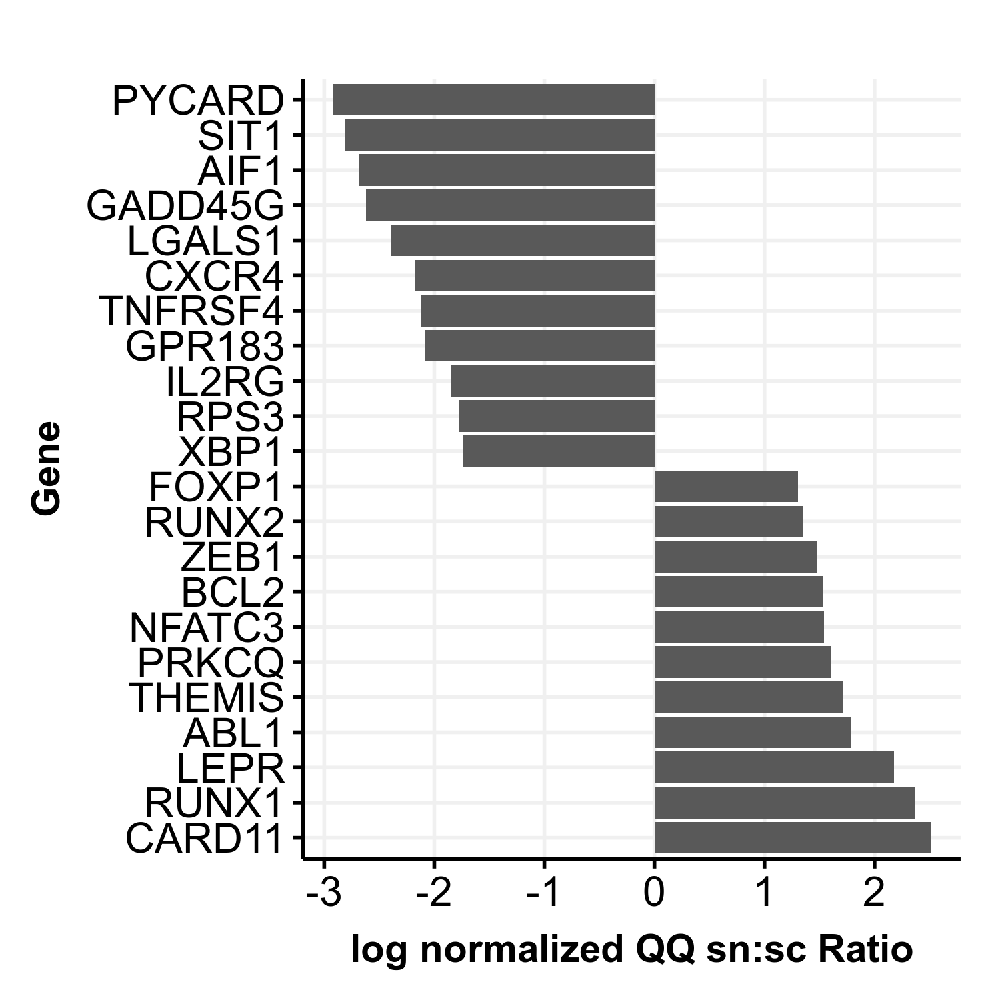

In [235]:
fig.size(5, 5)
ggplot(log_cluster_qq_ratio, aes(x = cluster_qq_ratio, y = gene)) +
    scale_y_discrete(limits = rev(log_cluster_qq_ratio$gene)) +
    geom_bar(stat = 'identity') + 
    theme_Publication() + 
    labs(x = 'log normalized QQ sn:sc Ratio', y = 'Gene')